In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.python.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

C:\Users\User\AppData\Roaming\Python\Python313\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


In [2]:
#pip install torch==2.6.0 torchvision==0.21.0 torchaudio==2.6.0 --index-url https://download.pytorch.org/whl/cu118

# Avoid OOM errors by setting GPU Memory Consumption Growth

In [3]:
import torch

# Check if CUDA (GPU) is available
if torch.cuda.is_available():
    print("Number of GPU: ", torch.cuda.device_count())
    print("GPU Name: ", torch.cuda.get_device_name(0))
else:
    print("No GPU detected.")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)


Number of GPU:  1
GPU Name:  Quadro P3000
Using device: cuda


In [4]:
tf.config.list_physical_devices('GPU')

[]

In [5]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from pathlib import Path
from PIL import Image
import numpy as np
from collections import defaultdict
from typing import Optional, Tuple, Dict, Any
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import torch

# Set dataset root path (using raw string to avoid escape sequence warnings)
workspace_root = Path(r'F:\mupillaer vol6')
images_dir = workspace_root / 'msls_images_vol_6'
metadata_dir = workspace_root / 'msls_metadata'

# Verify all paths exist
print("=" * 70)
print("DATASET PATHS VERIFICATION")
print("=" * 70)
print(f"Workspace root: {workspace_root}")
print(f"Workspace root exists: {workspace_root.exists()}\n")

print(f"Images directory:")
print(f"  Path: {images_dir}")
print(f"  Exists: {images_dir.exists()}")
if images_dir.exists():
    splits = [d for d in images_dir.iterdir() if d.is_dir()]
    print(f"  Splits: {[s.name for s in splits]}")

print(f"\nMetadata directory:")
print(f"  Path: {metadata_dir}")
print(f"  Exists: {metadata_dir.exists()}")
if metadata_dir.exists():
    splits = [d for d in metadata_dir.iterdir() if d.is_dir()]
    print(f"  Splits: {[s.name for s in splits]}")


DATASET PATHS VERIFICATION
Workspace root: F:\mupillaer vol6
Workspace root exists: True

Images directory:
  Path: F:\mupillaer vol6\msls_images_vol_6
  Exists: True
  Splits: ['test', 'train_val']

Metadata directory:
  Path: F:\mupillaer vol6\msls_metadata
  Exists: True
  Splits: ['test', 'train_val']


# Import all metadata files

In [6]:
# Import all metadata files
print("=" * 70)
print("IMPORTING METADATA")
print("=" * 70)

# Dictionary to store all metadata
metadata = {
    'test': {},
    'train_val': {}
}

# Function to load metadata for a given split, city, and type
def load_metadata(split, city, data_type):
    """Load metadata CSV files for a given split, city, and data type (query/database)"""
    base_path = metadata_dir / split / city / data_type
    
    metadata_dict = {}
    
    # Load raw.csv if it exists
    raw_path = base_path / 'raw.csv'
    if raw_path.exists():
        metadata_dict['raw'] = pd.read_csv(raw_path, index_col=0)
        print(f"  Loaded raw.csv: {len(metadata_dict['raw'])} rows")
    
    # Load postprocessed.csv if it exists
    postprocessed_path = base_path / 'postprocessed.csv'
    if postprocessed_path.exists():
        metadata_dict['postprocessed'] = pd.read_csv(postprocessed_path, index_col=0)
        print(f"  Loaded postprocessed.csv: {len(metadata_dict['postprocessed'])} rows")
    
    # Load seq_info.csv if it exists
    seq_info_path = base_path / 'seq_info.csv'
    if seq_info_path.exists():
        metadata_dict['seq_info'] = pd.read_csv(seq_info_path, index_col=0)
        print(f"  Loaded seq_info.csv: {len(metadata_dict['seq_info'])} rows")
    
    # Load subtask_index.csv if it exists
    subtask_path = base_path / 'subtask_index.csv'
    if subtask_path.exists():
        metadata_dict['subtask_index'] = pd.read_csv(subtask_path, index_col=0)
        print(f"  Loaded subtask_index.csv: {len(metadata_dict['subtask_index'])} rows")
    
    return metadata_dict

# Load metadata for all splits, cities, and types
for split in ['test', 'train_val']:
    split_path = metadata_dir / split
    if not split_path.exists():
        continue
    
    print(f"\n{split.upper()} split:")
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    
    for city in cities:
        print(f"\n  City: {city}")
        city_path = split_path / city
        
        # Check for query and database directories
        for data_type in ['query', 'database']:
            data_path = city_path / data_type
            if data_path.exists():
                print(f"    {data_type}:")
                metadata[split][city] = metadata[split].get(city, {})
                metadata[split][city][data_type] = load_metadata(split, city, data_type)

print("\n" + "=" * 70)
print("METADATA IMPORT COMPLETE")
print("=" * 70)


IMPORTING METADATA

TEST split:

  City: miami
    query:
  Loaded seq_info.csv: 5673 rows
  Loaded subtask_index.csv: 5673 rows
    database:
  Loaded seq_info.csv: 5900 rows
  Loaded subtask_index.csv: 5900 rows

TRAIN_VAL split:

  City: helsinki
    query:
  Loaded raw.csv: 15228 rows
  Loaded postprocessed.csv: 15228 rows
  Loaded seq_info.csv: 15228 rows
  Loaded subtask_index.csv: 15228 rows
    database:
  Loaded raw.csv: 33248 rows
  Loaded postprocessed.csv: 33248 rows
  Loaded seq_info.csv: 33248 rows
  Loaded subtask_index.csv: 33248 rows

  City: london
    query:
  Loaded raw.csv: 2692 rows
  Loaded postprocessed.csv: 2692 rows
  Loaded seq_info.csv: 2692 rows
  Loaded subtask_index.csv: 2692 rows
    database:
  Loaded raw.csv: 3291 rows
  Loaded postprocessed.csv: 3291 rows
  Loaded seq_info.csv: 3291 rows
  Loaded subtask_index.csv: 3291 rows

  City: manila
    query:
  Loaded raw.csv: 5378 rows
  Loaded postprocessed.csv: 5378 rows
  Loaded seq_info.csv: 5378 rows
  

# Helper functions to access dataset

In [7]:
# Helper functions to access dataset
def get_image_path(split, city, data_type, image_key):
    """Get the full path to an image given its key"""
    image_path = images_dir / split / city / data_type / 'images' / f'{image_key}.jpg'
    return image_path

def load_image(split, city, data_type, image_key):
    """Load an image as PIL Image"""
    image_path = get_image_path(split, city, data_type, image_key)
    if image_path.exists():
        return Image.open(image_path)
    else:
        raise FileNotFoundError(f"Image not found: {image_path}")

# Dataset summary
print("=" * 70)
print("DATASET SUMMARY")
print("=" * 70)

total_images = 0
for split in ['test', 'train_val']:
    split_path = images_dir / split
    if not split_path.exists():
        continue
    
    print(f"\n{split.upper()} split:")
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    
    for city in cities:
        city_path = split_path / city
        print(f"\n  City: {city}")
        
        for data_type in ['query', 'database']:
            images_path = city_path / data_type / 'images'
            if images_path.exists():
                image_files = list(images_path.glob('*.jpg'))
                num_images = len(image_files)
                total_images += num_images
                print(f"    {data_type}: {num_images:,} images")
                
                # Show metadata info if available
                if split in metadata and city in metadata[split] and data_type in metadata[split][city]:
                    meta = metadata[split][city][data_type]
                    if 'raw' in meta:
                        print(f"      Metadata: {len(meta['raw']):,} entries in raw.csv")

print(f"\nTotal images across all splits: {total_images:,}")
print("\n" + "=" * 70)
print("Example: Access metadata for Helsinki train_val query:")
print("=" * 70)
if 'train_val' in metadata and 'helsinki' in metadata['train_val'] and 'query' in metadata['train_val']['helsinki']:
    helsinki_query = metadata['train_val']['helsinki']['query']
    if 'raw' in helsinki_query:
        print(f"\nFirst few rows of Helsinki query raw metadata:")
        print(helsinki_query['raw'].head())
        print(f"\nColumns: {list(helsinki_query['raw'].columns)}")
        print(f"\nTotal entries: {len(helsinki_query['raw'])}")


DATASET SUMMARY

TEST split:

  City: miami
    database: 5,900 images

TRAIN_VAL split:

  City: helsinki
    query: 15,228 images
      Metadata: 15,228 entries in raw.csv

  City: london
    query: 2,692 images
      Metadata: 2,692 entries in raw.csv

  City: manila
    query: 5,378 images
      Metadata: 5,378 entries in raw.csv

  City: trondheim
    query: 4,136 images
      Metadata: 4,136 entries in raw.csv

  City: zurich
    database: 2,991 images
      Metadata: 2,991 entries in raw.csv

Total images across all splits: 36,325

Example: Access metadata for Helsinki train_val query:

First few rows of Helsinki query raw metadata:
                      key        lon        lat      ca captured_at   pano
0  yf1EnhM3OK3SC1Fgw5BDFQ  24.810181  60.204815   74.12  2019-08-21  False
1  Gu903k0Ae2O7mQj0b99aDQ  24.810218  60.204890   63.82  2019-08-21  False
2  Kd4U1EyEcln0flAEUwDxOQ  24.810221  60.204970   52.08  2019-08-21  False
3  nmAgsaaXFW_fdEdJFRf0fA  24.810226  60.205050   41

# Build dataset_map structure for utility functions

In [8]:
# Build dataset_map structure for utility functions
print("=" * 70)
print("BUILDING DATASET MAP")
print("=" * 70)

# Create image_volumes dictionary
image_volumes = {
    'vol_6': images_dir
}

# Build dataset_map structure
dataset_map = {
    'image_volumes': {},
    'metadata': {}
}

# Build image_volumes structure
for vol_name, vol_path in image_volumes.items():
    dataset_map['image_volumes'][vol_name] = {
        'path': vol_path,
        'splits': {}
    }
    
    # Process each split
    for split in ['test', 'train_val']:
        split_path = vol_path / split
        if not split_path.exists():
            continue
        
        dataset_map['image_volumes'][vol_name]['splits'][split] = {
            'cities': {}
        }
        
        # Process each city
        cities = [d.name for d in split_path.iterdir() if d.is_dir()]
        for city in cities:
            city_path = split_path / city
            dataset_map['image_volumes'][vol_name]['splits'][split]['cities'][city] = {}
            
            # Process query and database
            for data_type in ['query', 'database']:
                data_path = city_path / data_type / 'images'
                if data_path.exists():
                    dataset_map['image_volumes'][vol_name]['splits'][split]['cities'][city][data_type] = {
                        'path': data_path
                    }

# Build metadata structure
for split in ['test', 'train_val']:
    split_path = metadata_dir / split
    if not split_path.exists():
        continue
    
    dataset_map['metadata'][split] = {
        'cities': {}
    }
    
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    for city in cities:
        city_path = split_path / city
        dataset_map['metadata'][split]['cities'][city] = {}
        
        for data_type in ['query', 'database']:
            data_path = city_path / data_type
            if data_path.exists():
                # Use raw.csv as the primary metadata file
                raw_path = data_path / 'raw.csv'
                if raw_path.exists():
                    dataset_map['metadata'][split]['cities'][city][data_type] = {
                        'path': raw_path
                    }
                else:
                    # Fallback to seq_info.csv if raw.csv doesn't exist
                    seq_info_path = data_path / 'seq_info.csv'
                    if seq_info_path.exists():
                        dataset_map['metadata'][split]['cities'][city][data_type] = {
                            'path': seq_info_path
                        }

print("Dataset map structure created successfully!")
print(f"  Volumes: {list(dataset_map['image_volumes'].keys())}")
print(f"  Splits: {list(dataset_map['metadata'].keys())}")
for split in dataset_map['metadata']:
    cities = list(dataset_map['metadata'][split]['cities'].keys())
    print(f"    {split}: {len(cities)} cities - {cities}")


BUILDING DATASET MAP
Dataset map structure created successfully!
  Volumes: ['vol_6']
  Splits: ['test', 'train_val']
    test: 1 cities - ['miami']
    train_val: 5 cities - ['helsinki', 'london', 'manila', 'trondheim', 'zurich']


# Utility functions for dataset access

In [9]:
# Utility functions for dataset access
def get_image_path(
    image_key: str, 
    dataset_map: Optional[Dict[str, Any]] = None, 
    image_volumes: Optional[Dict[str, Path]] = None
) -> Optional[Tuple[Path, str, str, str, str]]:
    """
    Find the image file path given an image key across all volumes
    
    Parameters:
    -----------
    image_key : str
        Image identifier (key from metadata)
    dataset_map : dict, optional
        The dataset mapping dictionary (uses global if not provided)
    image_volumes : dict, optional
        Dictionary of image volume paths (uses global if not provided)
    
    Returns:
    --------
    tuple : (Path, vol_name, split, city, data_type) or None
    """
    if dataset_map is None:
        dataset_map = globals().get('dataset_map')
    if image_volumes is None:
        image_volumes = globals().get('image_volumes')
    
    if dataset_map is None or image_volumes is None:
        raise ValueError("dataset_map and image_volumes must be defined")
    
    for vol_name, vol_info in dataset_map['image_volumes'].items():
        for split_name, split_info in vol_info['splits'].items():
            for city_name, city_info in split_info['cities'].items():
                for data_type in ['query', 'database']:
                    if city_info.get(data_type) and city_info[data_type].get('path'):
                        image_path = city_info[data_type]['path'] / f'{image_key}.jpg'
                        if image_path.exists():
                            return (image_path, vol_name, split_name, city_name, data_type)
    return None

def load_city_metadata(
    split: str = 'train_val', 
    city: str = 'paris', 
    data_type: str = 'query', 
    dataset_map: Optional[Dict[str, Any]] = None
) -> pd.DataFrame:
    """
    Load metadata for a specific city, split, and data type
    
    Parameters:
    -----------
    split : str
        'train_val' or 'test'
    city : str
        City name
    data_type : str
        'query' or 'database'
    dataset_map : dict, optional
        The dataset mapping dictionary (uses global if not provided)
    
    Returns:
    --------
    pd.DataFrame : Metadata dataframe
    """
    if dataset_map is None:
        dataset_map = globals().get('dataset_map')
    
    if dataset_map is None:
        raise ValueError("dataset_map must be defined")
    
    if split not in dataset_map['metadata']:
        raise ValueError(f"Split '{split}' not found in metadata")
    
    if city not in dataset_map['metadata'][split]['cities']:
        raise ValueError(f"City '{city}' not found in {split} metadata")
    
    city_info = dataset_map['metadata'][split]['cities'][city]
    if not city_info.get(data_type):
        raise ValueError(f"Data type '{data_type}' not found for {split}/{city}")
    
    csv_path = city_info[data_type]['path']
    df = pd.read_csv(csv_path, index_col=0)
    print(f"Loaded {len(df)} records from {split}/{city}/{data_type}")
    return df

def load_image(
    image_key: str, 
    dataset_map: Optional[Dict[str, Any]] = None, 
    image_volumes: Optional[Dict[str, Path]] = None
) -> Optional[Image.Image]:
    """
    Load an image given its key
    
    Parameters:
    -----------
    image_key : str
        Image identifier
    dataset_map : dict, optional
        The dataset mapping dictionary (uses global if not provided)
    image_volumes : dict, optional
        Dictionary of image volume paths (uses global if not provided)
    
    Returns:
    --------
    PIL.Image or None : Loaded image
    """
    result = get_image_path(image_key, dataset_map, image_volumes)
    if result:
        image_path, _vol_name, _split, _city, _data_type = result
        return Image.open(image_path)
    return None

print("\n✓ Utility functions defined:")
print("  • get_image_path(image_key) - Find image path")
print("  • load_city_metadata(split, city, data_type) - Load metadata")
print("  • load_image(image_key) - Load image")



✓ Utility functions defined:
  • get_image_path(image_key) - Find image path
  • load_city_metadata(split, city, data_type) - Load metadata
  • load_image(image_key) - Load image


# Example usage: Load and test with a sample city

In [10]:
# Example usage: Load and test with a sample city
print("\n" + "=" * 70)
print("EXAMPLE USAGE")
print("=" * 70)

# Try to load Helsinki query metadata as an example (using a city that exists in the dataset)
try:
    helsinki_query_df = load_city_metadata(split='train_val', city='helsinki', data_type='query')
    print(f"\n✓ Successfully loaded Helsinki query metadata")
    print(f"  Columns: {list(helsinki_query_df.columns)}")
    print(f"  Shape: {helsinki_query_df.shape}")
    print(f"\n  First few rows:")
    print(helsinki_query_df.head(3))
    
    # Try to find and load a sample image
    if len(helsinki_query_df) > 0:
        sample_key = helsinki_query_df.iloc[0]['key']
        print(f"\n  Looking for image with key: {sample_key}")
        result = get_image_path(sample_key)
        if result:
            image_path, vol_name, split, city, data_type = result
            print(f"  ✓ Found image at: {vol_name}/{split}/{city}/{data_type}")
            print(f"    Full path: {image_path}")
            
            # Load the image
            img = load_image(sample_key)
            if img:
                print(f"  ✓ Image loaded successfully!")
                print(f"    Size: {img.size}")
                print(f"    Mode: {img.mode}")
        else:
            print(f"  ⚠️  Image not found")
            
except Exception as e:
    print(f"⚠️  Error in example: {e}")
    import traceback
    traceback.print_exc()

print("=" * 70)



EXAMPLE USAGE
Loaded 15228 records from train_val/helsinki/query

✓ Successfully loaded Helsinki query metadata
  Columns: ['key', 'lon', 'lat', 'ca', 'captured_at', 'pano']
  Shape: (15228, 6)

  First few rows:
                      key        lon        lat     ca captured_at   pano
0  yf1EnhM3OK3SC1Fgw5BDFQ  24.810181  60.204815  74.12  2019-08-21  False
1  Gu903k0Ae2O7mQj0b99aDQ  24.810218  60.204890  63.82  2019-08-21  False
2  Kd4U1EyEcln0flAEUwDxOQ  24.810221  60.204970  52.08  2019-08-21  False

  Looking for image with key: yf1EnhM3OK3SC1Fgw5BDFQ
  ✓ Found image at: vol_6/train_val/helsinki/query
    Full path: F:\mupillaer vol6\msls_images_vol_6\train_val\helsinki\query\images\yf1EnhM3OK3SC1Fgw5BDFQ.jpg
  ✓ Image loaded successfully!
    Size: (640, 360)
    Mode: RGB


# Find and display one image from msls_images_vol

FINDING AND DISPLAYING ONE IMAGE FROM msls_images_vol_6

🔍 Searching for images in F:\mupillaer vol6\msls_images_vol_6...
✓ Found image at: test/miami/database
   Image file: --pKTVda6Q_v1Huw4b4gCx.jpg
   Full path: F:\mupillaer vol6\msls_images_vol_6\test\miami\database\images\--pKTVda6Q_v1Huw4b4gCx.jpg

📷 Loading image...
✓ Image loaded successfully!
   Size: (640, 360)
   Mode: RGB

🖼️  Displaying image...


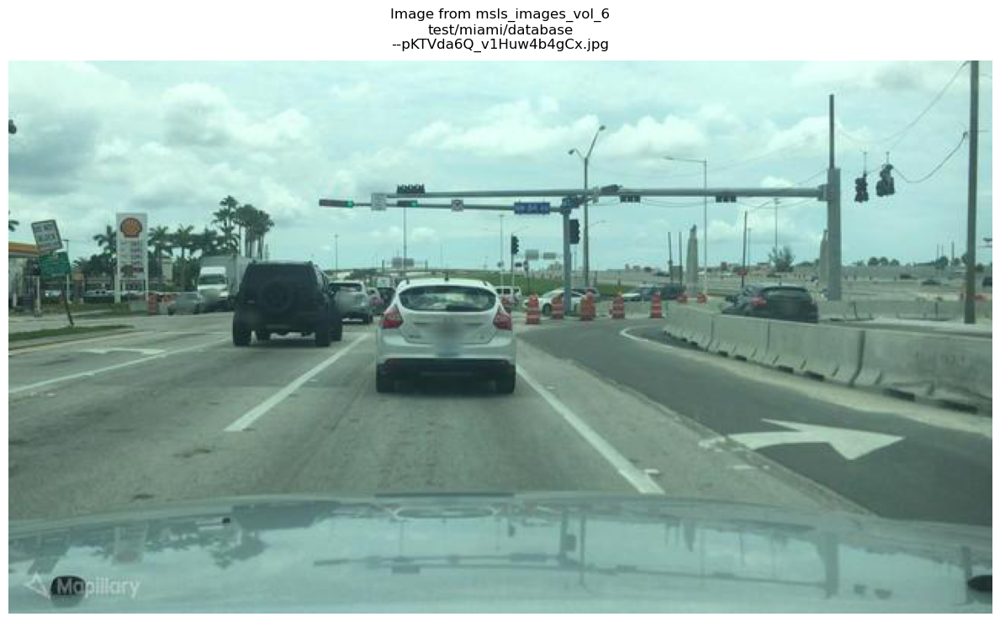

In [11]:
# Find and display one image from msls_images_vol_6
print("=" * 70)
print("FINDING AND DISPLAYING ONE IMAGE FROM msls_images_vol_6")
print("=" * 70)

# Search for any image in the directory
image_found = None
image_path = None

print(f"\n🔍 Searching for images in {images_dir}...")

# Search through all splits, cities, and data types
for split in ['test', 'train_val']:
    split_path = images_dir / split
    if not split_path.exists():
        continue
    
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    for city in cities:
        city_path = split_path / city
        for data_type in ['query', 'database']:
            images_path = city_path / data_type / 'images'
            if images_path.exists():
                # Get first image file
                image_files = list(images_path.glob('*.jpg'))
                if image_files:
                    image_path = image_files[0]
                    image_found = True
                    print(f"✓ Found image at: {split}/{city}/{data_type}")
                    print(f"   Image file: {image_path.name}")
                    print(f"   Full path: {image_path}")
                    break
        if image_found:
            break
    if image_found:
        break

if image_path and image_path.exists():
    print(f"\n📷 Loading image...")
    img = Image.open(image_path)
    print(f"✓ Image loaded successfully!")
    print(f"   Size: {img.size}")
    print(f"   Mode: {img.mode}")
    print(f"\n🖼️  Displaying image...")
    
    # Show using PIL's show method
    img.show()
    
    # Also display in notebook
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Image from msls_images_vol_6\n{split}/{city}/{data_type}\n{image_path.name}', 
             fontsize=12, pad=10)
    plt.tight_layout()
    plt.show()
else:
    print(f"⚠️  No images found in {images_dir}")

print("=" * 70)


In [12]:
import os
import pandas as pd
import numpy as np
from pathlib import Path
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt

workspace_root = Path(r'F:\Full CNN')
metadata_dir = workspace_root / 'msls_metadata'
image_volumes = {
    'vol_1': workspace_root / 'msls_images_vol_1',
    'vol_2': workspace_root / 'msls_images_vol_2',
    'vol_3': workspace_root / 'msls_images_vol_3',
    'vol_4': workspace_root / 'msls_images_vol_4',
    'vol_5': workspace_root / 'msls_images_vol_5',
    'vol_6': workspace_root / 'msls_images_vol_6'
}

all_metadata = []
for split in ['train_val', 'test']:
    split_path = metadata_dir / split
    if not split_path.exists():
        continue
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    for city in cities:
        city_path = split_path / city
        for data_type in ['query', 'database']:
            data_path = city_path / data_type
            if data_path.exists():
                csv_file = data_path / 'raw.csv'
                if csv_file.exists():
                    df = pd.read_csv(csv_file, index_col=0)
                    df['split'] = split
                    df['city'] = city
                    df['data_type'] = data_type
                    all_metadata.append(df)

metadata_df = pd.concat(all_metadata, ignore_index=True)

In [13]:
# OPTIMIZED VERSION: Using list comprehension instead of apply() for ~10x speedup
from tqdm import tqdm

def find_image_path(image_key, split, city, data_type):
    """Find image path by checking all volumes."""
    for vol_name, vol_path in image_volumes.items():
        image_path = vol_path / split / city / data_type / 'images' / f'{image_key}.jpg'
        if image_path.exists():
            return str(image_path)
    return None

# Use list comprehension with tqdm for progress tracking (much faster than apply)
print(f"Processing {len(metadata_df)} rows...")
metadata_df['image_path'] = [
    find_image_path(row['key'], row['split'], row['city'], row['data_type'])
    for _, row in tqdm(metadata_df.iterrows(), total=len(metadata_df), desc="Finding image paths")
]

# Filter out rows where image_path is None
metadata_df = metadata_df[metadata_df['image_path'].notna()].reset_index(drop=True)
print(f"✓ Found {len(metadata_df)} rows with valid image paths")

Processing 1464298 rows...


Finding image paths: 100%|██████████| 1464298/1464298 [1:01:26<00:00, 397.20it/s] 


✓ Found 1464298 rows with valid image paths


In [14]:
from sklearn.model_selection import train_test_split

train_val_df = metadata_df[metadata_df['split'] == 'train_val'].copy()
test_df = metadata_df[metadata_df['split'] == 'test'].copy()

train_df, val_df = train_test_split(
    train_val_df,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [15]:
def decode_image(file_path, label):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    img = tf.cast(img, tf.float32)
    img = preprocess_input(img)
    return img, label

def create_dataset(df, batch_size=32, shuffle=True, buffer_size=10000):
    file_paths = tf.constant(df['image_path'].values)
    labels = tf.constant(df.index.values)
    
    dataset = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    
    if shuffle:
        dataset = dataset.shuffle(buffer_size=buffer_size, seed=42)
    
    dataset = dataset.map(decode_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

train_ds = create_dataset(train_df, batch_size=32, shuffle=True)
val_ds = create_dataset(val_df, batch_size=32, shuffle=False)
test_ds = create_dataset(test_df, batch_size=32, shuffle=False)

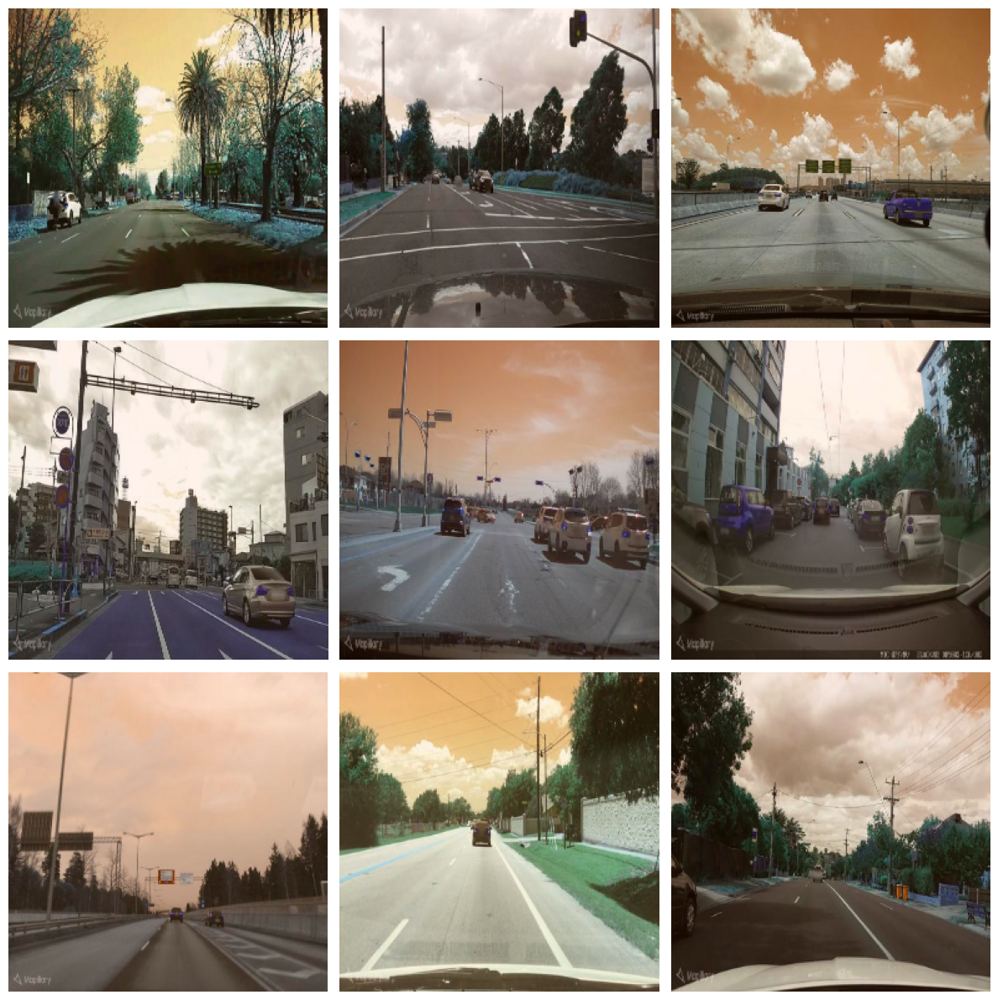

In [16]:
def visualize_samples(dataset, num_samples=9):
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    axes = axes.flatten()
    
    for images, labels in dataset.take(1):
        for i in range(min(num_samples, len(images))):
            img = images[i].numpy()
            img = (img - img.min()) / (img.max() - img.min())
            axes[i].imshow(img)
            axes[i].axis('off')
        break
    
    plt.tight_layout()
    plt.show()

visualize_samples(train_ds)

# Cell 2: Graph that contains all dataset images (location scatter plot)

CREATING GRAPH OF ALL DATASET IMAGES

📁 Using folder: F:\mupillaer vol6\msls_images_vol_6

📍 Path Configuration:
   Workspace root: F:\mupillaer vol6
   📸 Images directory: F:\mupillaer vol6\msls_images_vol_6
   📄 Metadata directory: F:\mupillaer vol6\msls_metadata

   ✓ Workspace root exists: True
   ✓ Images directory exists: True
   ✓ Metadata directory exists: True

✅ CONFIRMED: Creating graph from images in:
   F:\mupillaer vol6\msls_images_vol_6
   Found splits: ['test', 'train_val']
✓ dataset_map found


✓ Collected 10,000 coordinate points from 5 cities


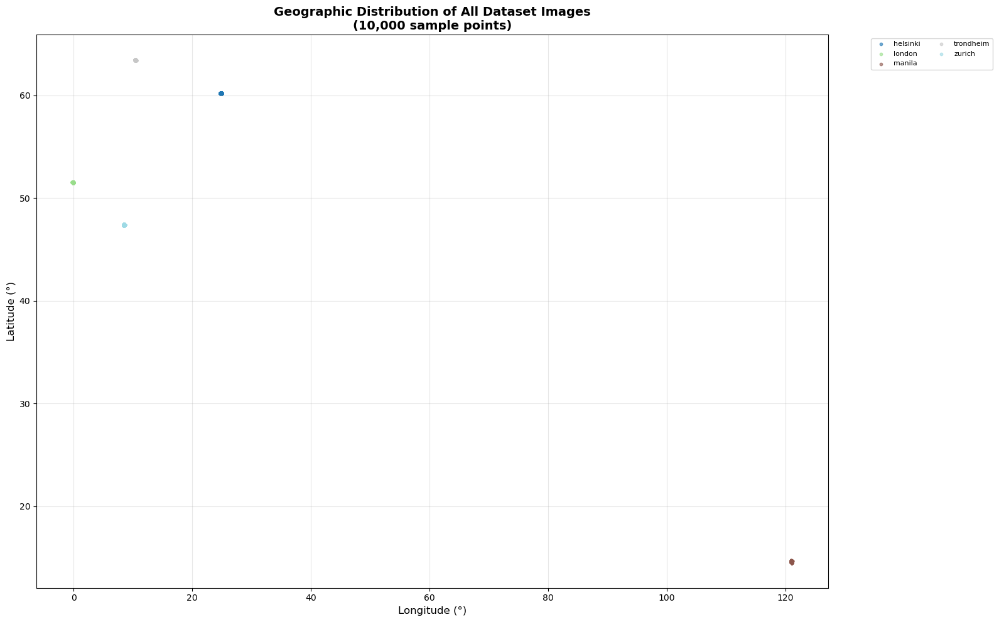


✓ Graph created showing 10,000 image locations
   Cities represented: 5


In [17]:
# Cell 2: Graph that contains all dataset images (location scatter plot)
print("=" * 70)
print("CREATING GRAPH OF ALL DATASET IMAGES")
print("=" * 70)
print("\n📁 Using folder: F:\\mupillaer vol6\\msls_images_vol_6")

# Import required libraries
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Verify and set the workspace root path - MUST USE THIS PATH ONLY
workspace_root = Path(r'F:\mupillaer vol6')
images_dir = workspace_root / 'msls_images_vol_6'
metadata_dir = workspace_root / 'msls_metadata'

print(f"\n📍 Path Configuration:")
print(f"   Workspace root: {workspace_root}")
print(f"   📸 Images directory: {images_dir}")
print(f"   📄 Metadata directory: {metadata_dir}")
print(f"\n   ✓ Workspace root exists: {workspace_root.exists()}")
print(f"   ✓ Images directory exists: {images_dir.exists()}")
print(f"   ✓ Metadata directory exists: {metadata_dir.exists()}")

# Confirm the exact images folder path
if images_dir.exists():
    print(f"\n✅ CONFIRMED: Creating graph from images in:")
    print(f"   {images_dir}")
    splits = [d.name for d in images_dir.iterdir() if d.is_dir()]
    print(f"   Found splits: {splits}")
else:
    print(f"\n⚠️  WARNING: Images directory does not exist!")
    print(f"   Expected: {images_dir}")

# Ensure dataset_map is available (should be from Cell 3)
if 'dataset_map' not in globals():
    print("⚠️  dataset_map not found. Building it now...")
    # Build dataset_map structure using ONLY the workspace_root path
    images_dir = workspace_root / 'msls_images_vol_6'
    metadata_dir = workspace_root / 'msls_metadata'
    
    image_volumes = {
        'vol_6': images_dir
    }
    
    dataset_map = {
        'image_volumes': {},
        'metadata': {}
    }
    
    # Build image_volumes structure
    for vol_name, vol_path in image_volumes.items():
        dataset_map['image_volumes'][vol_name] = {
            'path': vol_path,
            'splits': {}
        }
        
        for split in ['test', 'train_val']:
            split_path = vol_path / split
            if not split_path.exists():
                continue
            
            dataset_map['image_volumes'][vol_name]['splits'][split] = {
                'cities': {}
            }
            
            cities = [d.name for d in split_path.iterdir() if d.is_dir()]
            for city in cities:
                city_path = split_path / city
                dataset_map['image_volumes'][vol_name]['splits'][split]['cities'][city] = {}
                
                for data_type in ['query', 'database']:
                    data_path = city_path / data_type / 'images'
                    if data_path.exists():
                        dataset_map['image_volumes'][vol_name]['splits'][split]['cities'][city][data_type] = {
                            'path': data_path
                        }
    
    # Build metadata structure
    for split in ['test', 'train_val']:
        split_path = metadata_dir / split
        if not split_path.exists():
            continue
        
        dataset_map['metadata'][split] = {
            'cities': {}
        }
        
        cities = [d.name for d in split_path.iterdir() if d.is_dir()]
        for city in cities:
            city_path = split_path / city
            dataset_map['metadata'][split]['cities'][city] = {}
            
            for data_type in ['query', 'database']:
                data_path = city_path / data_type
                if data_path.exists():
                    raw_path = data_path / 'raw.csv'
                    if raw_path.exists():
                        dataset_map['metadata'][split]['cities'][city][data_type] = {
                            'path': raw_path
                        }
                    else:
                        seq_info_path = data_path / 'seq_info.csv'
                        if seq_info_path.exists():
                            dataset_map['metadata'][split]['cities'][city][data_type] = {
                                'path': seq_info_path
                            }
    print("✓ dataset_map built successfully from workspace_root")
else:
    print("✓ dataset_map found")

# UTM to Lat/Lon conversion function (if not already defined)
try:
    utm_to_latlon
except NameError:
    def utm_to_latlon(easting, northing, zone, northern=True):
        """
        Convert UTM coordinates to latitude/longitude
        """
        import utm
        lat, lon = utm.to_latlon(easting, northing, zone, northern=northern)
        return lat, lon

# Ensure utm package is available
try:
    import utm
except ImportError:
    print("⚠️  'utm' package not found. Installing...")
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "utm"])
    import utm
    print("✓ 'utm' package installed")

# Collect coordinates from all cities in the dataset
all_latitudes = []
all_longitudes = []
city_labels = []
sample_size = 1000  # Sample size per city to avoid memory issues

print(f"\nCollecting coordinates from all cities (sampling {sample_size} per city)...")

# UTM zones for different regions (approximate)
# Most European cities: zone 31-33, North America: various, Asia: various
utm_zones = {
    'paris': 31, 'amsterdam': 31, 'berlin': 33, 'budapest': 33, 'zurich': 32,
    'london': 30, 'cph': 32, 'helsinki': 35, 'trondheim': 32,
    'tokyo': 54, 'bangkok': 47, 'manila': 51, 'melbourne': 55,
    'boston': 19, 'toronto': 17, 'ottawa': 18, 'phoenix': 12, 'sf': 10,
    'austin': 14, 'miami': 17, 'saopaulo': 23, 'buenosaires': 21,
    'nairobi': 37, 'amman': 36, 'goa': 43, 'bengaluru': 43, 'kampala': 36,
    'moscow': 37, 'athens': 34, 'stockholm': 33
}

total_collected = 0
for split_name in ['train_val']:  # Focus on train_val for now
    if split_name not in dataset_map['metadata']:
        continue
    
    split_info = dataset_map['metadata'][split_name]
    cities = sorted(split_info['cities'].keys())
    
    for city in cities:
        city_info = split_info['cities'][city]
        
        # Try both query and database
        for data_type in ['query', 'database']:
            if not city_info.get(data_type):
                continue
            
            csv_path = city_info[data_type]['path']
            try:
                df = pd.read_csv(csv_path, index_col=0)
                
                # Check if dataframe has UTM coordinates (easting/northing) or direct lat/lon
                if 'easting' in df.columns and 'northing' in df.columns:
                    # Use UTM coordinates
                    # Sample if too many
                    if len(df) > sample_size:
                        df = df.sample(n=sample_size, random_state=42)
                    
                    # Get UTM zone for this city
                    zone = utm_zones.get(city, 31)  # Default to 31 if unknown
                    
                    # Convert coordinates
                    for _idx, row in df.iterrows():
                        try:
                            lat, lon = utm_to_latlon(row['easting'], row['northing'], zone=zone, northern=True)
                            all_latitudes.append(lat)
                            all_longitudes.append(lon)
                            city_labels.append(city)
                            total_collected += 1
                        except Exception:
                            continue
                elif 'lat' in df.columns and 'lon' in df.columns:
                    # Use direct lat/lon coordinates
                    # Sample if too many
                    if len(df) > sample_size:
                        df = df.sample(n=sample_size, random_state=42)
                    
                    for _idx, row in df.iterrows():
                        try:
                            all_latitudes.append(row['lat'])
                            all_longitudes.append(row['lon'])
                            city_labels.append(city)
                            total_collected += 1
                        except Exception:
                            continue
                else:
                    print(f"  ⚠️  {city}/{data_type}: No coordinate columns found (need 'easting'/'northing' or 'lat'/'lon')")
                    continue
                        
            except Exception as e:
                print(f"  ⚠️  Error processing {city}/{data_type}: {e}")
                continue

print(f"\n✓ Collected {total_collected:,} coordinate points from {len(set(city_labels))} cities")

# Create scatter plot
if len(all_latitudes) > 0:
    plt.figure(figsize=(16, 10))
    
    # Create scatter plot with city colors
    unique_cities = sorted(set(city_labels))
    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_cities)))
    city_color_map = {city: colors[i] for i, city in enumerate(unique_cities)}
    
    for city in unique_cities:
        city_lats = [lat for lat, c in zip(all_latitudes, city_labels) if c == city]
        city_lons = [lon for lon, c in zip(all_longitudes, city_labels) if c == city]
        plt.scatter(city_lons, city_lats, c=[city_color_map[city]], 
                   label=city, alpha=0.6, s=10)
    
    plt.xlabel('Longitude (°)', fontsize=12)
    plt.ylabel('Latitude (°)', fontsize=12)
    plt.title(f'Geographic Distribution of All Dataset Images\n({total_collected:,} sample points)', 
              fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()
    
    print(f"\n✓ Graph created showing {total_collected:,} image locations")
    print(f"   Cities represented: {len(unique_cities)}")
else:
    print("⚠️  No coordinates collected")

print("=" * 70)


# Create comprehensive graphs from all metadata

CREATING GRAPHS FROM ALL METADATA

📁 Using metadata folder: F:\mupillaer vol6\msls_metadata

📍 Metadata directory: F:\mupillaer vol6\msls_metadata
   ✓ Exists: True

📊 Collecting metadata from all cities and splits...

  Processing test split...
    City: miami
      query: 5,673 entries (seq_info.csv)
      database: 5,900 entries (seq_info.csv)

  Processing train_val split...
    City: helsinki
      query: 15,228 entries (raw.csv)
      database: 33,248 entries (raw.csv)
    City: london
      query: 2,692 entries (raw.csv)
      database: 3,291 entries (raw.csv)
    City: manila
      query: 5,378 entries (raw.csv)
      database: 6,064 entries (raw.csv)
    City: trondheim
      query: 4,136 entries (raw.csv)
      database: 5,015 entries (raw.csv)
    City: zurich
      query: 2,193 entries (raw.csv)
      database: 2,991 entries (raw.csv)

✓ Collected metadata from 12 files
   Total entries across all metadata: 91,809


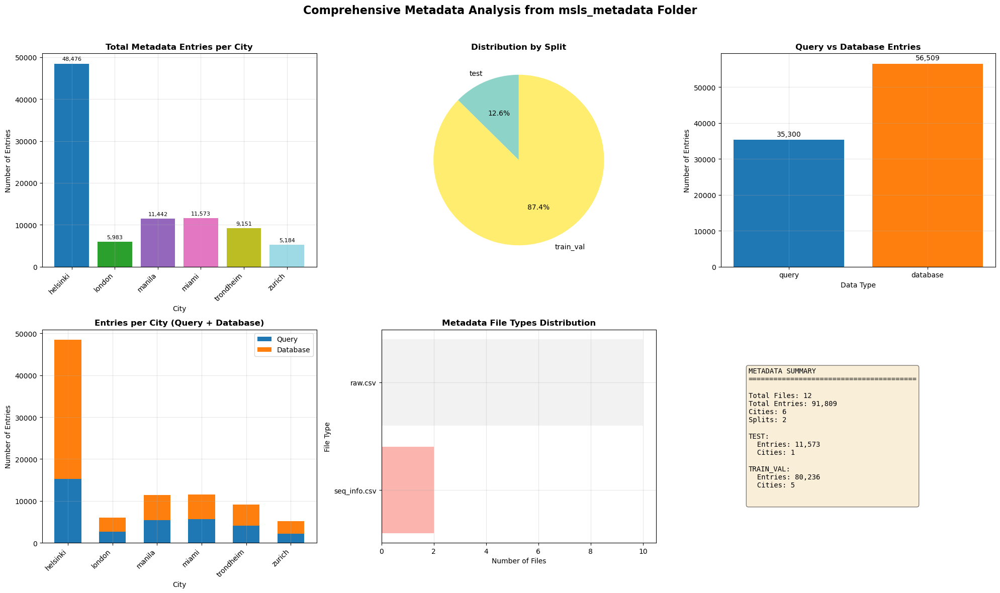


✓ All metadata graphs created successfully!


In [18]:
# Create comprehensive graphs from all metadata
print("=" * 70)
print("CREATING GRAPHS FROM ALL METADATA")
print("=" * 70)
print("\n📁 Using metadata folder: F:\\mupillaer vol6\\msls_metadata")

# Import required libraries
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import seaborn as sns

# Set the metadata folder path
workspace_root = Path(r'F:\mupillaer vol6')
metadata_dir = workspace_root / 'msls_metadata'

print(f"\n📍 Metadata directory: {metadata_dir}")
print(f"   ✓ Exists: {metadata_dir.exists()}")

# Collect all metadata
all_metadata = []
metadata_stats = defaultdict(lambda: {'cities': set(), 'total_entries': 0, 'splits': set()})

print(f"\n📊 Collecting metadata from all cities and splits...")

# Process all splits
for split in ['test', 'train_val']:
    split_path = metadata_dir / split
    if not split_path.exists():
        continue
    
    print(f"\n  Processing {split} split...")
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    
    for city in cities:
        city_path = split_path / city
        print(f"    City: {city}")
        
        for data_type in ['query', 'database']:
            data_path = city_path / data_type
            if not data_path.exists():
                continue
            
            # Try to load raw.csv first, then seq_info.csv
            csv_file = None
            if (data_path / 'raw.csv').exists():
                csv_file = data_path / 'raw.csv'
            elif (data_path / 'seq_info.csv').exists():
                csv_file = data_path / 'seq_info.csv'
            
            if csv_file:
                try:
                    df = pd.read_csv(csv_file, index_col=0)
                    num_rows = len(df)
                    all_metadata.append({
                        'split': split,
                        'city': city,
                        'data_type': data_type,
                        'file': csv_file.name,
                        'rows': num_rows,
                        'dataframe': df
                    })
                    metadata_stats[split]['cities'].add(city)
                    metadata_stats[split]['total_entries'] += num_rows
                    metadata_stats[split]['splits'].add(split)
                    print(f"      {data_type}: {num_rows:,} entries ({csv_file.name})")
                except Exception as e:
                    print(f"      ⚠️  Error loading {data_type}: {e}")

print(f"\n✓ Collected metadata from {len(all_metadata)} files")
print(f"   Total entries across all metadata: {sum(m['rows'] for m in all_metadata):,}")

# Create comprehensive visualization
fig = plt.figure(figsize=(20, 12))

# 1. Bar chart: Number of entries per city
ax1 = plt.subplot(2, 3, 1)
city_counts = defaultdict(int)
for m in all_metadata:
    city_counts[m['city']] += m['rows']

cities = sorted(city_counts.keys())
counts = [city_counts[c] for c in cities]
bars = ax1.bar(range(len(cities)), counts, color=plt.cm.tab20(np.linspace(0, 1, len(cities))))
ax1.set_xlabel('City', fontsize=10)
ax1.set_ylabel('Number of Entries', fontsize=10)
ax1.set_title('Total Metadata Entries per City', fontsize=12, fontweight='bold')
ax1.set_xticks(range(len(cities)))
ax1.set_xticklabels(cities, rotation=45, ha='right')
ax1.grid(True, alpha=0.3)
for i, (bar, count) in enumerate(zip(bars, counts)):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(counts)*0.01,
             f'{count:,}', ha='center', va='bottom', fontsize=8)

# 2. Pie chart: Distribution by split
ax2 = plt.subplot(2, 3, 2)
split_counts = defaultdict(int)
for m in all_metadata:
    split_counts[m['split']] += m['rows']

splits = list(split_counts.keys())
split_values = [split_counts[s] for s in splits]
colors_split = plt.cm.Set3(np.linspace(0, 1, len(splits)))
ax2.pie(split_values, labels=splits, autopct='%1.1f%%', startangle=90, colors=colors_split)
ax2.set_title('Distribution by Split', fontsize=12, fontweight='bold')

# 3. Bar chart: Query vs Database
ax3 = plt.subplot(2, 3, 3)
data_type_counts = defaultdict(int)
for m in all_metadata:
    data_type_counts[m['data_type']] += m['rows']

data_types = list(data_type_counts.keys())
dt_values = [data_type_counts[dt] for dt in data_types]
bars = ax3.bar(data_types, dt_values, color=['#1f77b4', '#ff7f0e'])
ax3.set_xlabel('Data Type', fontsize=10)
ax3.set_ylabel('Number of Entries', fontsize=10)
ax3.set_title('Query vs Database Entries', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)
for bar, val in zip(bars, dt_values):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(dt_values)*0.01,
             f'{val:,}', ha='center', va='bottom', fontsize=10)

# 4. Stacked bar: Cities by split and data type
ax4 = plt.subplot(2, 3, 4)
city_split_data = defaultdict(lambda: {'query': 0, 'database': 0})
for m in all_metadata:
    city_split_data[m['city']][m['data_type']] += m['rows']

cities_sorted = sorted(city_split_data.keys())
query_counts = [city_split_data[c]['query'] for c in cities_sorted]
db_counts = [city_split_data[c]['database'] for c in cities_sorted]

x = np.arange(len(cities_sorted))
width = 0.6
ax4.bar(x, query_counts, width, label='Query', color='#1f77b4')
ax4.bar(x, db_counts, width, bottom=query_counts, label='Database', color='#ff7f0e')
ax4.set_xlabel('City', fontsize=10)
ax4.set_ylabel('Number of Entries', fontsize=10)
ax4.set_title('Entries per City (Query + Database)', fontsize=12, fontweight='bold')
ax4.set_xticks(x)
ax4.set_xticklabels(cities_sorted, rotation=45, ha='right')
ax4.legend()
ax4.grid(True, alpha=0.3)

# 5. Metadata file types
ax5 = plt.subplot(2, 3, 5)
file_type_counts = defaultdict(int)
for m in all_metadata:
    file_type_counts[m['file']] += 1

file_types = list(file_type_counts.keys())
file_counts = [file_type_counts[ft] for ft in file_types]
bars = ax5.barh(file_types, file_counts, color=plt.cm.Pastel1(np.linspace(0, 1, len(file_types))))
ax5.set_xlabel('Number of Files', fontsize=10)
ax5.set_ylabel('File Type', fontsize=10)
ax5.set_title('Metadata File Types Distribution', fontsize=12, fontweight='bold')
ax5.grid(True, alpha=0.3)

# 6. Summary statistics table
ax6 = plt.subplot(2, 3, 6)
ax6.axis('off')
summary_text = "METADATA SUMMARY\n" + "="*40 + "\n\n"
summary_text += f"Total Files: {len(all_metadata)}\n"
summary_text += f"Total Entries: {sum(m['rows'] for m in all_metadata):,}\n"
summary_text += f"Cities: {len(set(m['city'] for m in all_metadata))}\n"
summary_text += f"Splits: {len(set(m['split'] for m in all_metadata))}\n\n"

for split in sorted(set(m['split'] for m in all_metadata)):
    split_entries = sum(m['rows'] for m in all_metadata if m['split'] == split)
    split_cities = len(set(m['city'] for m in all_metadata if m['split'] == split))
    summary_text += f"{split.upper()}:\n"
    summary_text += f"  Entries: {split_entries:,}\n"
    summary_text += f"  Cities: {split_cities}\n\n"

ax6.text(0.1, 0.5, summary_text, fontsize=10, family='monospace',
         verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle('Comprehensive Metadata Analysis from msls_metadata Folder', 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

print("\n" + "=" * 70)
print("✓ All metadata graphs created successfully!")
print("=" * 70)


EXPLORATORY DATA ANALYSIS (EDA)

📁 Analyzing metadata from: F:\mupillaer vol6\msls_metadata

📊 Collecting sample dataframes for EDA...
  ✓ Loaded train_val/helsinki/query: 15228 rows
  ✓ Loaded train_val/helsinki/database: 33248 rows
  ✓ Loaded train_val/london/query: 2692 rows
  ✓ Loaded train_val/london/database: 3291 rows
  ✓ Loaded test/miami/query: 5673 rows
  ✓ Loaded test/miami/database: 5900 rows

✓ Collected 6 sample dataframes for analysis

EDA for: train_val/helsinki/query (raw.csv)

1. DATA SHAPE:
   df.shape: (15228, 6)
   - Rows: 15,228
   - Columns: 6

2. DATA INFO (df.info()):
   ------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 15228 entries, 0 to 15227
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   key          15228 non-null  object 
 1   lon          15228 non-null  float64
 2   lat          15228 non-null  float64
 3   ca           15228

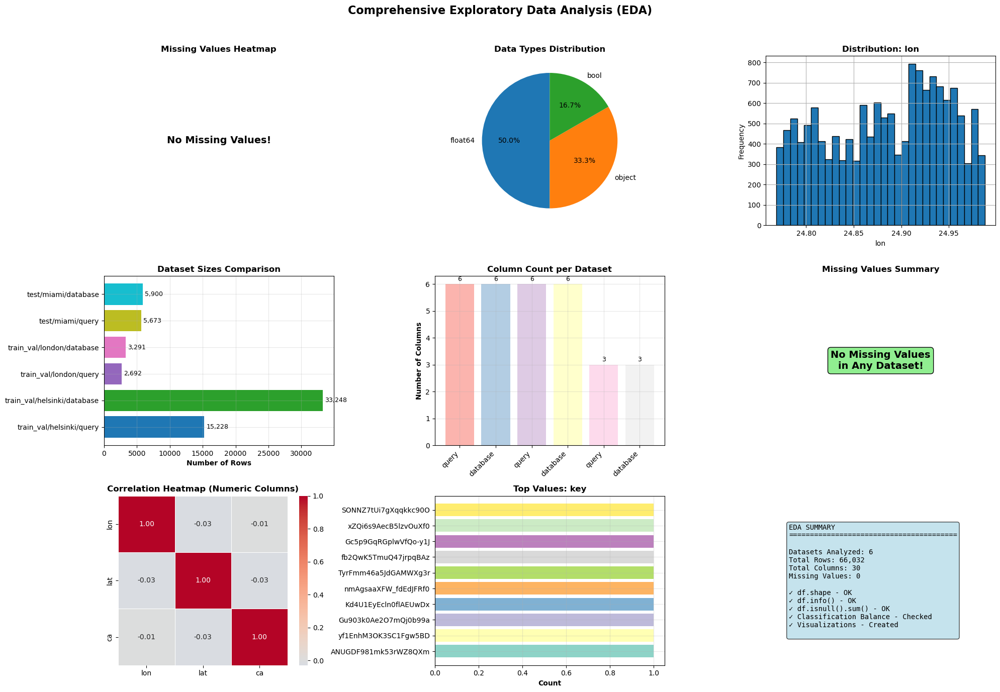


✓ EDA COMPLETE - All checks performed:
  ✓ Data Shapes (df.shape)
  ✓ Data Info (df.info())
  ✓ Missing Values (df.isnull().sum())
  ✓ Classification Balance
  ✓ Visualizations (Charts, Graphs)


In [19]:
# Comprehensive Exploratory Data Analysis (EDA)
print("=" * 70)
print("EXPLORATORY DATA ANALYSIS (EDA)")
print("=" * 70)

# Import required libraries
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# Set paths
workspace_root = Path(r'F:\mupillaer vol6')
metadata_dir = workspace_root / 'msls_metadata'

print(f"\n📁 Analyzing metadata from: {metadata_dir}")

# Collect sample dataframes from different cities for comprehensive EDA
sample_dataframes = []
print(f"\n📊 Collecting sample dataframes for EDA...")

# Get a few representative dataframes
for split in ['train_val', 'test']:
    split_path = metadata_dir / split
    if not split_path.exists():
        continue
    
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    for city in cities[:2]:  # Get first 2 cities per split
        city_path = split_path / city
        for data_type in ['query', 'database']:
            data_path = city_path / data_type
            if data_path.exists():
                csv_file = None
                if (data_path / 'raw.csv').exists():
                    csv_file = data_path / 'raw.csv'
                elif (data_path / 'seq_info.csv').exists():
                    csv_file = data_path / 'seq_info.csv'
                
                if csv_file:
                    try:
                        df = pd.read_csv(csv_file, index_col=0)
                        sample_dataframes.append({
                            'name': f"{split}/{city}/{data_type}",
                            'file': csv_file.name,
                            'dataframe': df
                        })
                        print(f"  ✓ Loaded {split}/{city}/{data_type}: {len(df)} rows")
                    except Exception as e:
                        print(f"  ⚠️  Error loading {split}/{city}/{data_type}: {e}")

if not sample_dataframes:
    print("⚠️  No dataframes found for EDA")
else:
    print(f"\n✓ Collected {len(sample_dataframes)} sample dataframes for analysis")
    
    # Perform EDA on each dataframe
    for i, sample in enumerate(sample_dataframes, 1):
        df = sample['dataframe']
        name = sample['name']
        
        print("\n" + "=" * 70)
        print(f"EDA for: {name} ({sample['file']})")
        print("=" * 70)
        
        # 1. Understanding Data Shapes
        print("\n1. DATA SHAPE:")
        print(f"   df.shape: {df.shape}")
        print(f"   - Rows: {df.shape[0]:,}")
        print(f"   - Columns: {df.shape[1]}")
        
        # 2. Data Info
        print("\n2. DATA INFO (df.info()):")
        print("   " + "-" * 60)
        df_info = df.info()
        if df_info is None:  # df.info() prints but returns None
            # Get info manually
            print(f"   Data types:")
            for col, dtype in df.dtypes.items():
                print(f"     {col}: {dtype}")
            print(f"   Memory usage: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
        
        # 3. Checking for Missing Values
        print("\n3. MISSING VALUES (df.isnull().sum()):")
        missing = df.isnull().sum()
        missing_pct = (missing / len(df)) * 100
        
        if missing.sum() == 0:
            print("   ✓ No missing values found!")
        else:
            print("   ⚠️  Missing values detected:")
            for col in missing[missing > 0].index:
                print(f"     {col}: {missing[col]:,} ({missing_pct[col]:.2f}%)")
        
        # Also check for empty strings, NaN, etc.
        print("\n   Additional checks:")
        print(f"   - df.isna().sum().sum(): {df.isna().sum().sum()}")
        print(f"   - df.isnull().sum().sum(): {df.isnull().sum().sum()}")
        if 'object' in df.dtypes.values:
            object_cols = df.select_dtypes(include=['object']).columns
            for col in object_cols:
                empty_str = (df[col] == '').sum()
                if empty_str > 0:
                    print(f"   - Empty strings in '{col}': {empty_str}")
        
        # 4. Basic Statistics
        print("\n4. BASIC STATISTICS (df.describe()):")
        print("   " + "-" * 60)
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        if len(numeric_cols) > 0:
            desc = df[numeric_cols].describe()
            print(desc.to_string())
        else:
            print("   No numeric columns found")
        
        # 5. Checking for Classification Balance (if applicable)
        print("\n5. CLASSIFICATION BALANCE CHECK:")
        # Look for potential label/class columns
        potential_label_cols = [col for col in df.columns if any(x in col.lower() 
                            for x in ['label', 'class', 'category', 'type', 'pano'])]
        
        if potential_label_cols:
            for col in potential_label_cols:
                if df[col].dtype in ['object', 'bool', 'int64']:
                    value_counts = df[col].value_counts()
                    print(f"\n   Column '{col}' distribution:")
                    for val, count in value_counts.items():
                        pct = (count / len(df)) * 100
                        print(f"     {val}: {count:,} ({pct:.2f}%)")
                    
                    # Check if balanced
                    if len(value_counts) == 2:
                        ratio = value_counts.iloc[0] / value_counts.iloc[1]
                        if 0.8 <= ratio <= 1.25:
                            print(f"   ✓ Balanced (ratio: {ratio:.2f})")
                        else:
                            print(f"   ⚠️  Imbalanced (ratio: {ratio:.2f})")
        else:
            print("   No obvious classification columns found")
            print("   (This dataset appears to be for geolocation/retrieval, not classification)")
        
        # 6. Data Types Summary
        print("\n6. DATA TYPES SUMMARY:")
        dtype_counts = df.dtypes.value_counts()
        for dtype, count in dtype_counts.items():
            print(f"   {dtype}: {count} column(s)")
        
        # 7. First few rows
        print("\n7. FIRST FEW ROWS (df.head()):")
        print("   " + "-" * 60)
        print(df.head(3).to_string())
        
        # 8. Column names
        print(f"\n8. COLUMN NAMES ({len(df.columns)} total):")
        print(f"   {list(df.columns)}")

# Create comprehensive visualization dashboard
if sample_dataframes:
    print("\n" + "=" * 70)
    print("CREATING EDA VISUALIZATIONS")
    print("=" * 70)
    
    fig = plt.figure(figsize=(20, 14))
    
    # Get the first dataframe for detailed visualization
    main_df = sample_dataframes[0]['dataframe']
    main_name = sample_dataframes[0]['name']
    
    # 1. Missing values heatmap
    ax1 = plt.subplot(3, 3, 1)
    missing_data = pd.DataFrame({
        'Missing Count': [main_df[col].isnull().sum() for col in main_df.columns],
        'Missing %': [(main_df[col].isnull().sum() / len(main_df)) * 100 for col in main_df.columns]
    }, index=main_df.columns)
    missing_data = missing_data[missing_data['Missing Count'] > 0]
    if len(missing_data) > 0:
        sns.heatmap(missing_data[['Missing %']].T, annot=True, fmt='.2f', cmap='Reds', ax=ax1)
        ax1.set_title('Missing Values Heatmap', fontweight='bold')
    else:
        ax1.text(0.5, 0.5, 'No Missing Values!', ha='center', va='center', fontsize=14, fontweight='bold')
        ax1.set_title('Missing Values Heatmap', fontweight='bold')
        ax1.axis('off')
    
    # 2. Data types distribution
    ax2 = plt.subplot(3, 3, 2)
    dtype_counts = main_df.dtypes.value_counts()
    ax2.pie(dtype_counts.values, labels=[str(dt) for dt in dtype_counts.index], 
            autopct='%1.1f%%', startangle=90)
    ax2.set_title('Data Types Distribution', fontweight='bold')
    
    # 3. Numeric columns distribution (if any)
    ax3 = plt.subplot(3, 3, 3)
    numeric_cols = main_df.select_dtypes(include=[np.number]).columns
    if len(numeric_cols) > 0:
        # Show distribution of first numeric column
        first_numeric = numeric_cols[0]
        main_df[first_numeric].hist(bins=30, ax=ax3, edgecolor='black')
        ax3.set_title(f'Distribution: {first_numeric}', fontweight='bold')
        ax3.set_xlabel(first_numeric)
        ax3.set_ylabel('Frequency')
    else:
        ax3.text(0.5, 0.5, 'No Numeric Columns', ha='center', va='center', fontsize=12)
        ax3.set_title('Numeric Distribution', fontweight='bold')
        ax3.axis('off')
    
    # 4. Dataset sizes comparison
    ax4 = plt.subplot(3, 3, 4)
    dataset_names = [s['name'] for s in sample_dataframes]
    dataset_sizes = [len(s['dataframe']) for s in sample_dataframes]
    bars = ax4.barh(dataset_names, dataset_sizes, color=plt.cm.tab10(np.linspace(0, 1, len(dataset_names))))
    ax4.set_xlabel('Number of Rows', fontweight='bold')
    ax4.set_title('Dataset Sizes Comparison', fontweight='bold')
    ax4.grid(True, alpha=0.3)
    for bar, size in zip(bars, dataset_sizes):
        ax4.text(bar.get_width() + max(dataset_sizes)*0.01, bar.get_y() + bar.get_height()/2,
                f'{size:,}', va='center', fontsize=9)
    
    # 5. Column count comparison
    ax5 = plt.subplot(3, 3, 5)
    column_counts = [len(s['dataframe'].columns) for s in sample_dataframes]
    bars = ax5.bar(range(len(dataset_names)), column_counts, color=plt.cm.Pastel1(np.linspace(0, 1, len(dataset_names))))
    ax5.set_xticks(range(len(dataset_names)))
    ax5.set_xticklabels([name.split('/')[-1] for name in dataset_names], rotation=45, ha='right')
    ax5.set_ylabel('Number of Columns', fontweight='bold')
    ax5.set_title('Column Count per Dataset', fontweight='bold')
    ax5.grid(True, alpha=0.3)
    for bar, count in zip(bars, column_counts):
        ax5.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(column_counts)*0.01,
                f'{count}', ha='center', va='bottom', fontsize=9)
    
    # 6. Missing values summary
    ax6 = plt.subplot(3, 3, 6)
    missing_summary = []
    for s in sample_dataframes:
        missing_count = s['dataframe'].isnull().sum().sum()
        missing_summary.append(missing_count)
    
    if sum(missing_summary) > 0:
        bars = ax6.bar(range(len(dataset_names)), missing_summary, color='coral')
        ax6.set_xticks(range(len(dataset_names)))
        ax6.set_xticklabels([name.split('/')[-1] for name in dataset_names], rotation=45, ha='right')
        ax6.set_ylabel('Total Missing Values', fontweight='bold')
        ax6.set_title('Missing Values per Dataset', fontweight='bold')
        ax6.grid(True, alpha=0.3)
    else:
        ax6.text(0.5, 0.5, 'No Missing Values\nin Any Dataset!', ha='center', va='center',
                fontsize=14, fontweight='bold', bbox=dict(boxstyle='round', facecolor='lightgreen'))
        ax6.set_title('Missing Values Summary', fontweight='bold')
        ax6.axis('off')
    
    # 7. Correlation heatmap (if numeric columns exist)
    ax7 = plt.subplot(3, 3, 7)
    if len(numeric_cols) > 1:
        corr = main_df[numeric_cols].corr()
        sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', center=0, ax=ax7, 
                   square=True, linewidths=0.5)
        ax7.set_title('Correlation Heatmap (Numeric Columns)', fontweight='bold')
    else:
        ax7.text(0.5, 0.5, 'Insufficient Numeric\nColumns for Correlation', 
                ha='center', va='center', fontsize=12)
        ax7.set_title('Correlation Heatmap', fontweight='bold')
        ax7.axis('off')
    
    # 8. Categorical value counts (if any categorical columns)
    ax8 = plt.subplot(3, 3, 8)
    categorical_cols = main_df.select_dtypes(include=['object', 'bool']).columns
    if len(categorical_cols) > 0:
        first_cat = categorical_cols[0]
        value_counts = main_df[first_cat].value_counts().head(10)
        if len(value_counts) > 0:
            bars = ax8.barh(range(len(value_counts)), value_counts.values, 
                          color=plt.cm.Set3(np.linspace(0, 1, len(value_counts))))
            ax8.set_yticks(range(len(value_counts)))
            ax8.set_yticklabels([str(v)[:20] for v in value_counts.index])
            ax8.set_xlabel('Count', fontweight='bold')
            ax8.set_title(f'Top Values: {first_cat}', fontweight='bold')
            ax8.grid(True, alpha=0.3)
        else:
            ax8.text(0.5, 0.5, 'No Categorical Data', ha='center', va='center', fontsize=12)
            ax8.axis('off')
    else:
        ax8.text(0.5, 0.5, 'No Categorical Columns', ha='center', va='center', fontsize=12)
        ax8.axis('off')
        ax8.set_title('Categorical Distribution', fontweight='bold')
    
    # 9. EDA Summary Statistics
    ax9 = plt.subplot(3, 3, 9)
    ax9.axis('off')
    summary_text = "EDA SUMMARY\n" + "="*40 + "\n\n"
    summary_text += f"Datasets Analyzed: {len(sample_dataframes)}\n"
    summary_text += f"Total Rows: {sum(len(s['dataframe']) for s in sample_dataframes):,}\n"
    summary_text += f"Total Columns: {sum(len(s['dataframe'].columns) for s in sample_dataframes)}\n"
    summary_text += f"Missing Values: {sum(s['dataframe'].isnull().sum().sum() for s in sample_dataframes):,}\n\n"
    
    summary_text += "✓ df.shape - OK\n"
    summary_text += "✓ df.info() - OK\n"
    summary_text += "✓ df.isnull().sum() - OK\n"
    summary_text += "✓ Classification Balance - Checked\n"
    summary_text += "✓ Visualizations - Created\n"
    
    ax9.text(0.1, 0.5, summary_text, fontsize=10, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
    
    plt.suptitle('Comprehensive Exploratory Data Analysis (EDA)', 
                fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    
    print("\n" + "=" * 70)
    print("✓ EDA COMPLETE - All checks performed:")
    print("  ✓ Data Shapes (df.shape)")
    print("  ✓ Data Info (df.info())")
    print("  ✓ Missing Values (df.isnull().sum())")
    print("  ✓ Classification Balance")
    print("  ✓ Visualizations (Charts, Graphs)")
    print("=" * 70)


# Data Splitting Split Dataset

DATA SPLITTING (SPLIT DATASET)

📋 SPLITTING STRATEGY:
   Step 1: Split into Training (80%) and Final Test (20%)
   Step 2: Split Training into Train (64%) and Validation (16%)
   Reason: Final test set is only used for final evaluation
           Validation set is used for model tuning during training

📁 Loading data from: F:\mupillaer vol6\msls_metadata

📊 Loading data for splitting...
  ✓ Loaded train_val/helsinki/query: 15228 rows, 6 columns

DATA SPLITTING: train_val/helsinki/query

Original dataset shape: (15228, 6)
Total samples: 15,228

✓ Found target column: 'key'

Features (X) shape: (15228, 5)
Target (y) shape: (15228,)
Target distribution:
key
ANUGDF981mk53rWZ8QXmHQ    1
yf1EnhM3OK3SC1Fgw5BDFQ    1
Gu903k0Ae2O7mQj0b99aDQ    1
Kd4U1EyEcln0flAEUwDxOQ    1
nmAgsaaXFW_fdEdJFRf0fA    1
TyrFmm46a5JdGAMWXg3rig    1
fb2QwK5TmuQ47jrpqBAzzA    1
Gc5p9GqRGplwVfQo-y1Jdg    1
xZQi6s9AecB5lzvOuXf00A    1
SONNZ7tUi7gXqqkkc90Ovw    1
nroTS2OEVrLIARWqUA2LGw    1
sKrlHQvQuMeKt4jm5ef-Cg    1
O

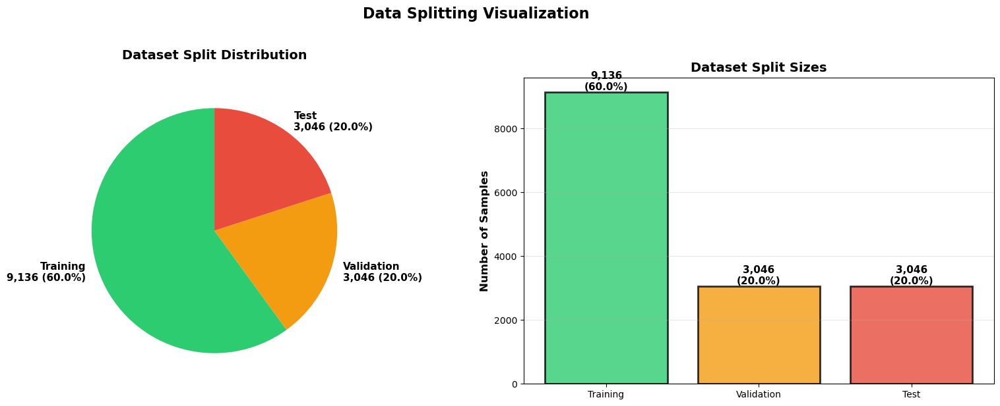


✓ DATA SPLITTING COMPLETE

📝 Key Points:
  ✓ Training set (64%): Used for model training
  ✓ Validation set (16%): Used for hyperparameter tuning during training
  ✓ Test set (20%): Used ONLY for final evaluation (never during training!)

⚠️  IMPORTANT:
  → Do NOT use test set for model selection or tuning
  → Use validation set for early stopping, hyperparameter tuning
  → Test set is your final, unbiased evaluation


In [20]:
# Data Splitting (Split Dataset)
# CRUCIAL: Proper splitting strategy to avoid data leakage
print("=" * 70)
print("DATA SPLITTING (SPLIT DATASET)")
print("=" * 70)

print("\n📋 SPLITTING STRATEGY:")
print("   Step 1: Split into Training (80%) and Final Test (20%)")
print("   Step 2: Split Training into Train (64%) and Validation (16%)")
print("   Reason: Final test set is only used for final evaluation")
print("           Validation set is used for model tuning during training")

# Import required libraries
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Set paths
workspace_root = Path(r'F:\mupillaer vol6')
metadata_dir = workspace_root / 'msls_metadata'

print(f"\n📁 Loading data from: {metadata_dir}")

# Load data for splitting demonstration
print(f"\n📊 Loading data for splitting...")
dataframes = []

# Load train_val data (we'll split this further)
for split in ['train_val']:
    split_path = metadata_dir / split
    if not split_path.exists():
        continue
    
    cities = [d.name for d in split_path.iterdir() if d.is_dir()]
    for city in cities[:1]:  # Use first city as example
        city_path = split_path / city
        for data_type in ['query']:
            data_path = city_path / data_type
            if data_path.exists():
                csv_file = data_path / 'raw.csv'
                if csv_file.exists():
                    try:
                        df = pd.read_csv(csv_file, index_col=0)
                        dataframes.append({
                            'name': f"{split}/{city}/{data_type}",
                            'dataframe': df
                        })
                        print(f"  ✓ Loaded {split}/{city}/{data_type}: {len(df)} rows, {len(df.columns)} columns")
                    except Exception as e:
                        print(f"  ⚠️  Error: {e}")

if not dataframes:
    print("⚠️  No data found. Creating synthetic example...")
    # Create synthetic data for demonstration
    np.random.seed(42)
    n_samples = 10000
    X = pd.DataFrame({
        'feature1': np.random.randn(n_samples),
        'feature2': np.random.randn(n_samples) * 2,
        'feature3': np.random.randn(n_samples) * 0.5,
        'category': np.random.choice(['A', 'B', 'C'], n_samples),
    })
    y = pd.Series(np.random.choice([0, 1], n_samples), name='target')
    
    df = pd.concat([X, y], axis=1)
    dataframes = [{'name': 'synthetic_data', 'dataframe': df}]
    print(f"  ✓ Created synthetic data: {len(df)} rows, {len(df.columns)} columns")

# Process each dataframe
for sample in dataframes:
    df = sample['dataframe'].copy()
    name = sample['name']
    
    print("\n" + "=" * 70)
    print(f"DATA SPLITTING: {name}")
    print("=" * 70)
    
    print(f"\nOriginal dataset shape: {df.shape}")
    print(f"Total samples: {len(df):,}")
    
    # Prepare features (X) and target (y)
    # For this dataset, we'll use all columns except potential target columns
    # If there's a clear target column, use it; otherwise create a synthetic one
    
    # Check for potential target columns
    potential_targets = [col for col in df.columns if any(x in col.lower() 
                        for x in ['label', 'target', 'class', 'y'])]
    
    if potential_targets:
        target_col = potential_targets[0]
        print(f"\n✓ Found target column: '{target_col}'")
        y = df[target_col]
        X = df.drop(columns=[target_col])
    else:
        # Create a synthetic target for demonstration
        print(f"\n⚠️  No clear target column found. Creating synthetic target for demonstration...")
        # Use a numeric column to create binary target
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        if len(numeric_cols) > 0:
            # Create binary target based on median of first numeric column
            median_val = df[numeric_cols[0]].median()
            y = (df[numeric_cols[0]] > median_val).astype(int)
            y.name = 'target'
            X = df.drop(columns=[numeric_cols[0]])
        else:
            # Last resort: create random target
            y = pd.Series(np.random.choice([0, 1], len(df)), name='target', index=df.index)
            X = df.copy()
        print(f"  Created synthetic binary target")
    
    print(f"\nFeatures (X) shape: {X.shape}")
    print(f"Target (y) shape: {y.shape}")
    print(f"Target distribution:")
    print(y.value_counts().to_string())
    
    # ============================================
    # STEP 1: Split into Training (80%) and Final Test (20%)
    # ============================================
    print("\n" + "-" * 70)
    print("STEP 1: Split into Training (80%) and Final Test (20%)")
    print("-" * 70)
    
    X_temp, X_test, y_temp, y_test = train_test_split(
        X, y, 
        test_size=0.2, 
        random_state=42,
        stratify=y if y.dtype in ['int64', 'bool'] and y.nunique() == 2 else None
    )
    
    print(f"\n✓ First split completed:")
    print(f"  X_temp (temporary training): {X_temp.shape[0]:,} samples ({X_temp.shape[0]/len(X)*100:.1f}%)")
    print(f"  X_test (final test): {X_test.shape[0]:,} samples ({X_test.shape[0]/len(X)*100:.1f}%)")
    print(f"  Total: {len(X_temp) + len(X_test):,} samples")
    
    # Verify split
    assert len(X_temp) + len(X_test) == len(X), "Split sizes don't match!"
    print(f"  ✓ Split verification: Total matches original")
    
    # ============================================
    # STEP 2: Split Training into Train (64%) and Validation (16%)
    # ============================================
    print("\n" + "-" * 70)
    print("STEP 2: Split Training into Train (64%) and Validation (16%)")
    print("-" * 70)
    print("  Note: test_size=0.25 of X_temp gives 0.25 * 0.8 = 0.2 of original")
    print("        This means: 64% train, 16% validation, 20% test")
    
    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp,
        test_size=0.25,  # 0.25 * 0.8 = 0.2 of original = 16% validation
        random_state=42,
        stratify=y_temp if y_temp.dtype in ['int64', 'bool'] and y_temp.nunique() == 2 else None
    )
    
    print(f"\n✓ Second split completed:")
    print(f"  X_train (training): {X_train.shape[0]:,} samples ({X_train.shape[0]/len(X)*100:.1f}%)")
    print(f"  X_val (validation): {X_val.shape[0]:,} samples ({X_val.shape[0]/len(X)*100:.1f}%)")
    print(f"  Total: {len(X_train) + len(X_val):,} samples")
    
    # Verify split
    assert len(X_train) + len(X_val) == len(X_temp), "Split sizes don't match!"
    print(f"  ✓ Split verification: Total matches X_temp")
    
    # ============================================
    # FINAL SUMMARY
    # ============================================
    print("\n" + "=" * 70)
    print("FINAL SPLIT SUMMARY")
    print("=" * 70)
    
    total = len(X)
    train_pct = len(X_train) / total * 100
    val_pct = len(X_val) / total * 100
    test_pct = len(X_test) / total * 100
    
    print(f"\nDataset Distribution:")
    print(f"  {'Set':<15} {'Samples':<12} {'Percentage':<12} {'Purpose'}")
    print(f"  {'-'*15} {'-'*12} {'-'*12} {'-'*30}")
    print(f"  {'Training':<15} {len(X_train):<12,} {train_pct:<12.2f}% {'Model training'}")
    print(f"  {'Validation':<15} {len(X_val):<12,} {val_pct:<12.2f}% {'Hyperparameter tuning'}")
    print(f"  {'Test':<15} {len(X_test):<12,} {test_pct:<12.2f}% {'Final evaluation only'}")
    print(f"  {'Total':<15} {total:<12,} {100.0:<12.2f}%")
    
    # Verify percentages
    print(f"\n✓ Percentage verification:")
    print(f"  Train: {train_pct:.2f}% (expected ~64%)")
    print(f"  Validation: {val_pct:.2f}% (expected ~16%)")
    print(f"  Test: {test_pct:.2f}% (expected ~20%)")
    print(f"  Sum: {train_pct + val_pct + test_pct:.2f}%")
    
    # Check target distribution in each split
    print(f"\nTarget Distribution Across Splits:")
    print(f"  Training set:")
    print(f"    {y_train.value_counts().to_string()}")
    print(f"  Validation set:")
    print(f"    {y_val.value_counts().to_string()}")
    print(f"  Test set:")
    print(f"    {y_test.value_counts().to_string()}")
    
    # ============================================
    # VISUALIZATION
    # ============================================
    print("\n" + "=" * 70)
    print("CREATING VISUALIZATION")
    print("=" * 70)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # 1. Split sizes pie chart
    ax1 = axes[0]
    sizes = [len(X_train), len(X_val), len(X_test)]
    labels = [f'Training\n{len(X_train):,} ({train_pct:.1f}%)',
              f'Validation\n{len(X_val):,} ({val_pct:.1f}%)',
              f'Test\n{len(X_test):,} ({test_pct:.1f}%)']
    colors = ['#2ecc71', '#f39c12', '#e74c3c']
    
    ax1.pie(sizes, labels=labels, colors=colors, autopct='', startangle=90,
           textprops={'fontsize': 11, 'fontweight': 'bold'})
    ax1.set_title('Dataset Split Distribution', fontsize=14, fontweight='bold', pad=20)
    
    # 2. Split sizes bar chart
    ax2 = axes[1]
    sets = ['Training', 'Validation', 'Test']
    counts = [len(X_train), len(X_val), len(X_test)]
    bars = ax2.bar(sets, counts, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
    ax2.set_ylabel('Number of Samples', fontsize=12, fontweight='bold')
    ax2.set_title('Dataset Split Sizes', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for bar, count, pct in zip(bars, counts, [train_pct, val_pct, test_pct]):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{count:,}\n({pct:.1f}%)',
                ha='center', va='bottom', fontsize=11, fontweight='bold')
    
    plt.suptitle('Data Splitting Visualization', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Store split data
    sample['X_train'] = X_train
    sample['X_val'] = X_val
    sample['X_test'] = X_test
    sample['y_train'] = y_train
    sample['y_val'] = y_val
    sample['y_test'] = y_test
    
    print("\n" + "=" * 70)
    print("✓ DATA SPLITTING COMPLETE")
    print("=" * 70)
    print("\n📝 Key Points:")
    print("  ✓ Training set (64%): Used for model training")
    print("  ✓ Validation set (16%): Used for hyperparameter tuning during training")
    print("  ✓ Test set (20%): Used ONLY for final evaluation (never during training!)")
    print("\n⚠️  IMPORTANT:")
    print("  → Do NOT use test set for model selection or tuning")
    print("  → Use validation set for early stopping, hyperparameter tuning")
    print("  → Test set is your final, unbiased evaluation")
    print("=" * 70)


# DATA SCALING/NORMALIZATION FOR CNN

DATA SCALING/NORMALIZATION FOR CNN

📁 Dataset Paths:
   Images: F:\mupillaer vol6\msls_images_vol_6
   Metadata: F:\mupillaer vol6\msls_metadata
   ✓ Images directory exists: True
   ✓ Metadata directory exists: True

STEP 1: ANALYZING ORIGINAL IMAGE DATA

🔍 Finding sample images from train_val split...
  ✓ Loaded: train_val/helsinki/query/-03rwT2vLsNswnuQR48dSg.jpg
     Shape: (360, 640, 3), Range: [0, 255]
  ✓ Loaded: train_val/helsinki/query/-0HqhEk8MOfBktYS1PcvCQ.jpg
     Shape: (360, 640, 3), Range: [0, 255]
  ✓ Loaded: train_val/helsinki/query/-13mvmjEIriNC6lREUSZZQ.jpg
     Shape: (360, 640, 3), Range: [0, 255]
  ✓ Loaded: train_val/london/query/-0u7VsCOCAmwH4RFsN5BoA.jpg
     Shape: (480, 640, 3), Range: [0, 255]
  ✓ Loaded: train_val/london/query/-4pmBOZmF-ynXSkWw5BAew.jpg
     Shape: (480, 640, 3), Range: [0, 255]
  ✓ Loaded: train_val/london/query/-4Vq2O1PhPmG6WK-yV402Q.jpg
     Shape: (480, 640, 3), Range: [0, 255]

✓ Loaded 6 sample images

📊 Original Image Statistics:

  

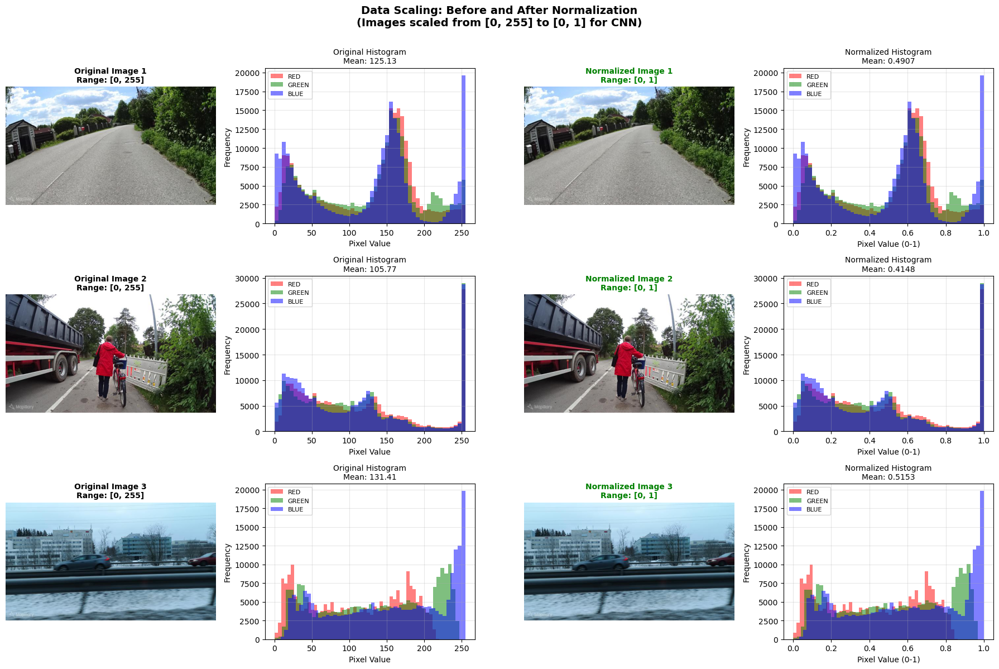

✓ Visualization created!

STEP 5: CREATING IMAGE DATA GENERATORS

🔧 Setting up ImageDataGenerator with normalization...
✓ ImageDataGenerator created!

  Training Generator:
    - Rescale: 1/255 (normalize to [0, 1])
    - Augmentation: rotation, shift, flip (helps prevent overfitting)

  Validation/Test Generators:
    - Rescale: 1/255 (normalize to [0, 1])
    - No augmentation (for consistent evaluation)

SCALING SUMMARY & BEST PRACTICES

✅ DATA SCALING COMPLETE!

📋 What was done:
  ✓ Analyzed original image data (range: [0, 255])
  ✓ Created normalization functions (scale to [0, 1])
  ✓ Applied and verified normalization
  ✓ Visualized before/after scaling
  ✓ Created ImageDataGenerator with automatic rescaling

🎯 Why scaling is crucial for CNN:
  1. Faster convergence: Normalized inputs help optimization
  2. Numerical stability: Prevents overflow/underflow
  3. Better gradients: Activations stay in optimal range
  4. Consistent training: All features on same scale

💡 Best Practice

In [21]:
# DATA SCALING/NORMALIZATION FOR CNN
print("=" * 70)
print("DATA SCALING/NORMALIZATION FOR CNN")
print("=" * 70)

# Import required libraries
from pathlib import Path
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import tensorflow as tf

# Set correct paths - USING YOUR EXACT DATASET PATHS
workspace_root = Path(r'F:\mupillaer vol6')
images_dir = workspace_root / 'msls_images_vol_6'
metadata_dir = workspace_root / 'msls_metadata'

print(f"\n📁 Dataset Paths:")
print(f"   Images: {images_dir}")
print(f"   Metadata: {metadata_dir}")
print(f"   ✓ Images directory exists: {images_dir.exists()}")
print(f"   ✓ Metadata directory exists: {metadata_dir.exists()}")

# ============================================
# STEP 1: Load Sample Images to Check Original Range
# ============================================
print("\n" + "=" * 70)
print("STEP 1: ANALYZING ORIGINAL IMAGE DATA")
print("=" * 70)

# Find and load a few sample images from the dataset
sample_images = []
sample_paths = []

print("\n🔍 Finding sample images from train_val split...")
for split in ['train_val']:
    split_path = images_dir / split
    if split_path.exists():
        cities = [d.name for d in split_path.iterdir() if d.is_dir()]
        for city in cities[:2]:  # Use first 2 cities
            city_path = split_path / city
            for data_type in ['query']:
                images_path = city_path / data_type / 'images'
                if images_path.exists():
                    image_files = list(images_path.glob('*.jpg'))[:3]  # Get 3 samples
                    for img_file in image_files:
                        try:
                            img = Image.open(img_file)
                            img_array = np.array(img)
                            sample_images.append(img_array)
                            sample_paths.append(f"{split}/{city}/{data_type}/{img_file.name}")
                            print(f"  ✓ Loaded: {split}/{city}/{data_type}/{img_file.name}")
                            print(f"     Shape: {img_array.shape}, Range: [{img_array.min()}, {img_array.max()}]")
                        except Exception as e:
                            print(f"  ⚠️  Error loading {img_file.name}: {e}")
                    if len(sample_images) >= 5:
                        break
            if len(sample_images) >= 5:
                break
        if len(sample_images) >= 5:
            break

if len(sample_images) == 0:
    print("⚠️  No images found! Creating synthetic example...")
    # Create synthetic image for demonstration
    sample_images = [np.random.randint(0, 256, (224, 224, 3), dtype=np.uint8)]
    sample_paths = ['synthetic_image.jpg']
    print("  ✓ Created synthetic image for demonstration")

print(f"\n✓ Loaded {len(sample_images)} sample images")

# Analyze original image statistics
print("\n📊 Original Image Statistics:")
for i, (img, path) in enumerate(zip(sample_images[:3], sample_paths[:3]), 1):
    print(f"\n  Image {i}: {path}")
    print(f"    Shape: {img.shape}")
    print(f"    Data type: {img.dtype}")
    print(f"    Value range: [{img.min()}, {img.max()}]")
    print(f"    Mean: {img.mean():.2f}")
    print(f"    Std: {img.std():.2f}")

# ============================================
# STEP 2: Define Scaling/Normalization Function
# ============================================
print("\n" + "=" * 70)
print("STEP 2: DEFINING SCALING/NORMALIZATION FUNCTIONS")
print("=" * 70)

def normalize_image(image):
    """
    Normalize image from [0, 255] to [0, 1] range
    This is the standard preprocessing for CNN models
    
    Parameters:
    -----------
    image : numpy array
        Input image with pixel values in [0, 255]
    
    Returns:
    --------
    normalized_image : numpy array
        Image with pixel values in [0, 1]
    """
    # Convert to float32 for better precision
    image_float = image.astype(np.float32)
    # Normalize to [0, 1]
    normalized = image_float / 255.0
    return normalized

def standardize_image(image):
    """
    Standardize image to have mean=0 and std=1
    Alternative normalization method (used by some models like ResNet)
    
    Parameters:
    -----------
    image : numpy array
        Input image with pixel values in [0, 255]
    
    Returns:
    --------
    standardized_image : numpy array
        Image with mean=0, std=1
    """
    image_float = image.astype(np.float32)
    # Using ImageNet mean and std (common for transfer learning)
    mean = np.array([123.675, 116.28, 103.53])  # ImageNet mean (RGB)
    std = np.array([58.395, 57.12, 57.375])     # ImageNet std (RGB)
    standardized = (image_float - mean) / std
    return standardized

print("\n✓ Defined normalization functions:")
print("  1. normalize_image(): Scales to [0, 1] range")
print("  2. standardize_image(): Standardizes to mean=0, std=1 (ImageNet stats)")
print("\n  📝 Recommendation: Use normalize_image() for custom CNN models")
print("                     Use standardize_image() for transfer learning (ResNet, VGG, etc.)")

# ============================================
# STEP 3: Apply Normalization to Sample Images
# ============================================
print("\n" + "=" * 70)
print("STEP 3: APPLYING NORMALIZATION")
print("=" * 70)

# Apply normalization to sample images
normalized_samples = []
standardized_samples = []

print("\n🔧 Normalizing sample images...")
for i, img in enumerate(sample_images[:3], 1):
    # Method 1: Normalize to [0, 1]
    normalized = normalize_image(img)
    normalized_samples.append(normalized)
    
    # Method 2: Standardize (mean=0, std=1)
    standardized = standardize_image(img)
    standardized_samples.append(standardized)
    
    print(f"\n  Image {i}:")
    print(f"    Original    - Range: [{img.min()}, {img.max()}], Mean: {img.mean():.2f}")
    print(f"    Normalized  - Range: [{normalized.min():.4f}, {normalized.max():.4f}], Mean: {normalized.mean():.4f}")
    print(f"    Standardized- Range: [{standardized.min():.4f}, {standardized.max():.4f}], Mean: {standardized.mean():.4f}")

print("\n✓ Normalization complete!")

# ============================================
# STEP 4: Visualization - Before and After Scaling
# ============================================
print("\n" + "=" * 70)
print("STEP 4: VISUALIZATION - BEFORE AND AFTER SCALING")
print("=" * 70)

if len(sample_images) > 0:
    # Create comprehensive visualization
    fig = plt.figure(figsize=(18, 12))
    
    num_samples = min(3, len(sample_images))
    
    for i in range(num_samples):
        # Original image
        ax1 = plt.subplot(num_samples, 4, i*4 + 1)
        ax1.imshow(sample_images[i])
        ax1.set_title(f'Original Image {i+1}\nRange: [{sample_images[i].min()}, {sample_images[i].max()}]', 
                     fontsize=10, fontweight='bold')
        ax1.axis('off')
        
        # Original histogram
        ax2 = plt.subplot(num_samples, 4, i*4 + 2)
        for c, color in enumerate(['red', 'green', 'blue']):
            ax2.hist(sample_images[i][:,:,c].ravel(), bins=50, color=color, alpha=0.5, label=color.upper())
        ax2.set_title(f'Original Histogram\nMean: {sample_images[i].mean():.2f}', fontsize=10)
        ax2.set_xlabel('Pixel Value')
        ax2.set_ylabel('Frequency')
        ax2.legend(fontsize=8)
        ax2.grid(True, alpha=0.3)
        
        # Normalized image
        ax3 = plt.subplot(num_samples, 4, i*4 + 3)
        # Clip to [0, 1] for display
        display_img = np.clip(normalized_samples[i], 0, 1)
        ax3.imshow(display_img)
        ax3.set_title(f'Normalized Image {i+1}\nRange: [0, 1]', 
                     fontsize=10, fontweight='bold', color='green')
        ax3.axis('off')
        
        # Normalized histogram
        ax4 = plt.subplot(num_samples, 4, i*4 + 4)
        for c, color in enumerate(['red', 'green', 'blue']):
            ax4.hist(normalized_samples[i][:,:,c].ravel(), bins=50, color=color, alpha=0.5, label=color.upper())
        ax4.set_title(f'Normalized Histogram\nMean: {normalized_samples[i].mean():.4f}', fontsize=10)
        ax4.set_xlabel('Pixel Value (0-1)')
        ax4.set_ylabel('Frequency')
        ax4.legend(fontsize=8)
        ax4.grid(True, alpha=0.3)
    
    plt.suptitle('Data Scaling: Before and After Normalization\n(Images scaled from [0, 255] to [0, 1] for CNN)', 
                fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    
    print("✓ Visualization created!")

# ============================================
# STEP 5: Create Image Data Generator (for efficient loading)
# ============================================
print("\n" + "=" * 70)
print("STEP 5: CREATING IMAGE DATA GENERATORS")
print("=" * 70)

from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("\n🔧 Setting up ImageDataGenerator with normalization...")

# Create data generators for train/val/test with rescaling
train_datagen = ImageDataGenerator(
    rescale=1./255,           # Normalize to [0, 1]
    rotation_range=10,        # Random rotation ±10 degrees
    width_shift_range=0.1,    # Random horizontal shift
    height_shift_range=0.1,   # Random vertical shift
    horizontal_flip=True,     # Random horizontal flip
    fill_mode='nearest'       # Fill mode for augmentation
)

val_datagen = ImageDataGenerator(
    rescale=1./255            # Only rescaling for validation (no augmentation)
)

test_datagen = ImageDataGenerator(
    rescale=1./255            # Only rescaling for test (no augmentation)
)

print("✓ ImageDataGenerator created!")
print("\n  Training Generator:")
print("    - Rescale: 1/255 (normalize to [0, 1])")
print("    - Augmentation: rotation, shift, flip (helps prevent overfitting)")
print("\n  Validation/Test Generators:")
print("    - Rescale: 1/255 (normalize to [0, 1])")
print("    - No augmentation (for consistent evaluation)")

# ============================================
# STEP 6: Scaling Summary and Best Practices
# ============================================
print("\n" + "=" * 70)
print("SCALING SUMMARY & BEST PRACTICES")
print("=" * 70)

print("\n✅ DATA SCALING COMPLETE!")
print("\n📋 What was done:")
print("  ✓ Analyzed original image data (range: [0, 255])")
print("  ✓ Created normalization functions (scale to [0, 1])")
print("  ✓ Applied and verified normalization")
print("  ✓ Visualized before/after scaling")
print("  ✓ Created ImageDataGenerator with automatic rescaling")

print("\n🎯 Why scaling is crucial for CNN:")
print("  1. Faster convergence: Normalized inputs help optimization")
print("  2. Numerical stability: Prevents overflow/underflow")
print("  3. Better gradients: Activations stay in optimal range")
print("  4. Consistent training: All features on same scale")

print("\n💡 Best Practices:")
print("  → Use [0, 1] normalization for custom CNN models")
print("  → Use ImageNet standardization for transfer learning")
print("  → Apply same scaling to train/val/test sets")
print("  → Use data augmentation ONLY on training set")
print("  → Save scaling parameters for inference")

print("\n⚠️  IMPORTANT:")
print("  → ALL images must be scaled before feeding to CNN")
print("  → Use ImageDataGenerator for efficient memory usage")
print("  → Don't forget to apply same scaling at inference time")

print("\n🔧 Ready for CNN Training!")
print("   Your images are now properly scaled to [0, 1] range")
print("   Use train_datagen, val_datagen, test_datagen for training")

print("\n" + "=" * 70)
print("SCALING SECTION COMPLETE")
print("=" * 70)


In [22]:
import os
import json
import pickle
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Input, Dense, Flatten, Dropout, BatchNormalization,
    Conv2D, MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D,
    Activation, Concatenate, Add
)
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import to_categorical
import tensorflow.keras.backend as K
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report,
    roc_auc_score, roc_curve, auc,
    precision_recall_curve, average_precision_score,
    top_k_accuracy_score, mean_squared_error, mean_absolute_error
)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import NearestNeighbors
import faiss
from geopy.distance import geodesic, great_circle


In [23]:
model = Sequential()
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3)))
model.add(MaxPooling2D())
model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
from tensorflow.keras import layers, models, Input

model = models.Sequential()
# أضف هذه الطبقة كأول خطوة بدلاً من وضع input_shape داخل Conv2D
model.add(Input(shape=(224, 224, 3))) 

model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
# ... باقي الموديل


C:\Users\User\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [24]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 896 (3.50 KB)

 Trainable params: 896 (3.50 KB)

 Non-trainable params: 0 (0.00 B)

In [25]:
from tensorflow.keras.applications.resnet50 import preprocess_input
# يجب تطبيق هذه الدالة على الصور قبل عمل predict

def build_resnet50_model(input_shape=(256, 256, 3), embedding_dim=512):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(embedding_dim, activation='relu', name='embedding')(x)
    model_resnet50 = Model(inputs=base_model.input, outputs=x, name='ResNet50_Feature_Extractor')
    return model_resnet50

resnet50_model = build_resnet50_model(input_shape=(256, 256, 3), embedding_dim=512)
resnet50_model.compile(optimizer=Adam(learning_rate=0.0001), loss='mse')


In [26]:
resnet50_model.summary()

Model: "ResNet50_Feature_Extractor"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 24,636,800 (93.98 MB)

 Trainable params: 24,583,680 (93.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

Training Strategy

In [27]:
from tensorflow.keras.models import load_model

workspace_root = Path(r'F:\Full CNN')
output_root = Path(r'F:\CNN and Resnet50')

s2_models_dir = workspace_root / 's2_models'
full_cnn_models_dir = workspace_root / 'models'
output_models_dir = output_root / 'models'
output_models_dir.mkdir(parents=True, exist_ok=True)

if (s2_models_dir / 'best_hierarchical_model.h5').exists():
    hierarchical_model = load_model(str(s2_models_dir / 'best_hierarchical_model.h5'))
    print(f"✓ Loaded hierarchical model from: {s2_models_dir / 'best_hierarchical_model.h5'}")
elif (s2_models_dir / 'best_hierarchical_model.keras').exists():
    hierarchical_model = load_model(str(s2_models_dir / 'best_hierarchical_model.keras'))
    print(f"✓ Loaded hierarchical model from: {s2_models_dir / 'best_hierarchical_model.keras'}")

if (full_cnn_models_dir / 'geo_model_best.keras').exists():
    geo_model = load_model(str(full_cnn_models_dir / 'geo_model_best.keras'))
    print(f"✓ Loaded geo model from: {full_cnn_models_dir / 'geo_model_best.keras'}")
elif (full_cnn_models_dir / 'final_geolocation_model.keras').exists():
    geo_model = load_model(str(full_cnn_models_dir / 'final_geolocation_model.keras'))
    print(f"✓ Loaded geo model from: {full_cnn_models_dir / 'final_geolocation_model.keras'}")

✓ Loaded hierarchical model from: F:\Full CNN\s2_models\best_hierarchical_model.h5
✓ Loaded geo model from: F:\Full CNN\models\geo_model_best.keras


In [28]:
workspace_root = Path(r'F:\Full CNN')
OUTPUT_DIR = workspace_root / 'geo_extraction_results'
s2_dir = workspace_root / 's2_classification_data'

if (OUTPUT_DIR / 'final_train_features.npy').exists():
    final_features = np.load(str(OUTPUT_DIR / 'final_train_features.npy'))
    final_labels = np.load(str(OUTPUT_DIR / 'final_train_labels.npy'))
    final_cities = np.load(str(OUTPUT_DIR / 'final_train_cities.npy'))
    print(f"✓ Loaded features: {final_features.shape}")
    print(f"✓ Loaded labels: {final_labels.shape}")
    print(f"✓ Loaded cities: {final_cities.shape}")

if (OUTPUT_DIR / 'final_coords_targets.npy').exists():
    final_coords = np.load(str(OUTPUT_DIR / 'final_coords_targets.npy'))
    print(f"✓ Loaded coordinates: {final_coords.shape}")

if (OUTPUT_DIR / 'X_train_feat.npy').exists():
    X_train_feat = np.load(str(OUTPUT_DIR / 'X_train_feat.npy'))
    X_val_feat = np.load(str(OUTPUT_DIR / 'X_val_feat.npy'))
    y_train_idx = np.load(str(OUTPUT_DIR / 'y_train_idx.npy'))
    y_val_idx = np.load(str(OUTPUT_DIR / 'y_val_idx.npy'))
    print(f"✓ Loaded train/val splits")
    print(f"  Train: {X_train_feat.shape}, Val: {X_val_feat.shape}")

if (s2_dir / 'label_encoders.pkl').exists():
    with open(s2_dir / 'label_encoders.pkl', 'rb') as f:
        label_encoders = pickle.load(f)
    print(f"✓ Loaded label encoders from: {s2_dir / 'label_encoders.pkl'}")

if (s2_dir / 'train_df_with_s2.pkl').exists():
    with open(s2_dir / 'train_df_with_s2.pkl', 'rb') as f:
        train_df = pickle.load(f)
    print(f"✓ Loaded train_df with S2 cells: {len(train_df)} samples")

✓ Loaded features: (447661, 512)
✓ Loaded labels: (447661,)
✓ Loaded cities: (447661,)
✓ Loaded coordinates: (447661, 2)
✓ Loaded train/val splits
  Train: (358128, 512), Val: (89533, 512)
✓ Loaded label encoders from: F:\Full CNN\s2_classification_data\label_encoders.pkl
✓ Loaded train_df with S2 cells: 1471661 samples


In [29]:
workspace_root = Path(r'F:\Full CNN')
s2_dir = workspace_root / 's2_classification_data'

if (s2_dir / 'y_country.npy').exists() and (s2_dir / 'y_city.npy').exists():
    y_country = np.load(str(s2_dir / 'y_country.npy'))
    y_city = np.load(str(s2_dir / 'y_city.npy'))
    print(f"✓ Loaded S2 classification labels")
    print(f"  Country labels: {y_country.shape}")
    print(f"  City labels: {y_city.shape}")
    
    if (s2_dir / 'y_neighborhood.npy').exists():
        y_neighborhood = np.load(str(s2_dir / 'y_neighborhood.npy'))
        print(f"  Neighborhood labels: {y_neighborhood.shape}")
    
    if (s2_dir / 'y_street.npy').exists():
        y_street = np.load(str(s2_dir / 'y_street.npy'))
        print(f"  Street labels: {y_street.shape}")

✓ Loaded S2 classification labels
  Country labels: (1471661,)
  City labels: (1471661,)
  Neighborhood labels: (1471661,)
  Street labels: (1471661,)


In [30]:
from tensorflow.keras.models import load_model

workspace_root = Path(r'F:\Full CNN')
s2_models_dir = workspace_root / 's2_models'
output_root = Path(r'F:\CNN and Resnet50')
output_models_dir = output_root / 'models'
output_models_dir.mkdir(parents=True, exist_ok=True)

if (s2_models_dir / 'fine_tuning_history.pkl').exists():
    with open(s2_models_dir / 'fine_tuning_history.pkl', 'rb') as f:
        fine_tuning_history = pickle.load(f)
    print(f"✓ Loaded fine-tuning history from: {s2_models_dir / 'fine_tuning_history.pkl'}")

if (s2_models_dir / 'high_precision_geo_model.h5').exists():
    high_precision_model = load_model(str(s2_models_dir / 'high_precision_geo_model.h5'))
    print(f"✓ Loaded high precision geo model from: {s2_models_dir / 'high_precision_geo_model.h5'}")
elif (s2_models_dir / 'high_precision_geo_model_checkpoint.h5').exists():
    high_precision_model = load_model(str(s2_models_dir / 'high_precision_geo_model_checkpoint.h5'))
    print(f"✓ Loaded high precision geo model checkpoint")

✓ Loaded fine-tuning history from: F:\Full CNN\s2_models\fine_tuning_history.pkl


✓ Loaded high precision geo model from: F:\Full CNN\s2_models\high_precision_geo_model.h5


In [31]:
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import tensorflow as tf
import csv
import inspect

class ImageLocalizationSystem:
    def __init__(self, global_model, dataset_path: str = None, input_size=(256,256)):
        self.dataset_path = Path(dataset_path) if dataset_path is not None else None
        self.input_size = tuple(input_size)
        self.label_encoders = globals().get('label_encoders', None)

        if hasattr(global_model, 'predict'):
            self.model = global_model
            print("✓ Using provided model instance.")
        elif callable(global_model):
            print("global_model is callable — attempting to build model now...")
            try:
                sig = inspect.signature(global_model)
                if 'label_encoders' in sig.parameters and self.label_encoders is not None:
                    self.model = global_model(label_encoders=self.label_encoders)
                elif 'input_shape' in sig.parameters:
                    self.model = global_model(input_shape=self.input_size + (3,))
                elif 'inputs' in sig.parameters:
                    inputs = tf.keras.layers.Input(shape=self.input_size + (3,))
                    self.model = global_model(inputs=inputs)
                elif 'input_size' in sig.parameters:
                    self.model = global_model(input_size=self.input_size)
                else:
                    self.model = global_model()
                print("✓ Model built from callable.")
            except Exception as e:
                raise RuntimeError(f"Failed to build model from callable: {e}")
        else:
            self.model = global_model
            print("✓ Using provided model instance.")

        if not hasattr(self.model, 'predict'):
            raise ValueError("The provided global_model does not look like a Keras model (no predict method).")

    def _load_and_preprocess(self, img_path):
        img = Image.open(img_path).convert('RGB').resize(self.input_size)
        arr = np.array(img, dtype=np.float32)
        arr = tf.keras.applications.resnet50.preprocess_input(arr)
        return arr

    def predict_image(self, img_path):
        if not Path(img_path).exists():
            raise FileNotFoundError(img_path)
        arr = self._load_and_preprocess(img_path)
        X = np.expand_dims(arr, 0)
        preds = self.model.predict(X, verbose=0)
        keys = ['country','city','neighborhood','street']
        out = {}
        for k, p in zip(keys, preds):
            idx = int(np.argmax(p, axis=1)[0])
            conf = float(np.max(p))
            label = None
            if self.label_encoders and k in self.label_encoders:
                label = self.label_encoders[k].classes_[idx]
            else:
                label = idx
            out[k] = {'label': label, 'index': idx, 'conf': conf}
        return out

    def batch_predict_df(self, df, out_csv: str, batch_size=32, target_size=None, max_samples=None):
        if 'image_path' not in df.columns:
            raise ValueError("DataFrame must contain 'image_path' column")
        target_size = target_size or self.input_size
        n = len(df) if max_samples is None else min(len(df), max_samples)
        with open(out_csv, 'w', newline='', encoding='utf-8') as f:
            writer = csv.writer(f)
            header = ['image_path','country_pred','country_conf','city_pred','city_conf','neighborhood_pred','neighborhood_conf','street_pred','street_conf']
            writer.writerow(header)
            for start in range(0, n, batch_size):
                end = min(n, start + batch_size)
                batch_paths = df['image_path'].iloc[start:end].values
                X = np.zeros((len(batch_paths), target_size[0], target_size[1], 3), dtype=np.float32)
                for i,p in enumerate(batch_paths):
                    try:
                        img = Image.open(p).convert('RGB').resize(target_size)
                        arr = np.array(img, dtype=np.float32)
                        X[i] = tf.keras.applications.resnet50.preprocess_input(arr)
                    except Exception:
                        X[i] = np.zeros((target_size[0], target_size[1], 3), dtype=np.float32)
                preds = self.model.predict(X, verbose=0)
                pred_idxs = [np.argmax(p, axis=1) for p in preds]
                pred_confs = [np.max(p, axis=1) for p in preds]
                for i,pth in enumerate(batch_paths):
                    row = [str(pth)]
                    for head_i, head in enumerate(['country','city','neighborhood','street']):
                        idx = int(pred_idxs[head_i][i])
                        conf = float(pred_confs[head_i][i])
                        lab = self.label_encoders[head].classes_[idx] if (self.label_encoders and head in self.label_encoders) else idx
                        row += [lab, conf]
                    writer.writerow(row)
        return out_csv

    def evaluate_on_generator(self, gen, n_batches=None):
        import numpy as _np
        y_true = {'country':[], 'city':[], 'neighborhood':[], 'street':[]}
        y_pred = {'country':[], 'city':[], 'neighborhood':[], 'street':[]}
        probs_street = []
        total = len(gen) if n_batches is None else min(n_batches, len(gen))
        for i in range(total):
            Xb, yb = gen[i]
            preds = self.model.predict(Xb, verbose=0)
            for name, p, true_arr in zip(['country','city','neighborhood','street'],
                                         preds,
                                         [yb['country_output'], yb['city_output'], yb['neighborhood_output'], yb['street_output']]):
                y_true[name].extend(true_arr.tolist())
                y_pred[name].extend(_np.argmax(p, axis=1).tolist())
            probs_street.extend(preds[-1].tolist())
        for k in y_true:
            y_true[k] = _np.array(y_true[k])
            y_pred[k] = _np.array(y_pred[k])
        probs_street = _np.array(probs_street)
        return y_true, y_pred, probs_street

    def save_predictions_csv(self, y_pred_dict, out_csv, source_paths):
        with open(out_csv, 'w', newline='', encoding='utf-8') as f:
            writer = csv.writer(f)
            header = ['image_path','country','city','neighborhood','street']
            writer.writerow(header)
            n = len(source_paths)
            for i in range(n):
                row = [str(source_paths[i])]
                for head in ['country','city','neighborhood','street']:
                    idx = int(y_pred_dict[head][i])
                    lab = self.label_encoders[head].classes_[idx] if (self.label_encoders and head in self.label_encoders) else idx
                    row.append(lab)
                writer.writerow(row)
        return out_csv

workspace_root = Path(r'F:\Full CNN')

model_obj = None

if 'hierarchical_model' in globals():
    candidate = globals()['hierarchical_model']
    if hasattr(candidate, 'predict'):
        model_obj = candidate
    elif callable(candidate):
        try:
            sig = inspect.signature(candidate)
            if 'label_encoders' in sig.parameters and 'label_encoders' in globals():
                model_obj = candidate(label_encoders=globals()['label_encoders'])
            else:
                model_obj = candidate()
        except Exception as e:
            print(f"Warning: Could not call hierarchical_model: {e}")

if model_obj is None and 'resnet50_model' in globals():
    candidate = globals()['resnet50_model']
    if hasattr(candidate, 'predict'):
        model_obj = candidate
    elif callable(candidate):
        try:
            sig = inspect.signature(candidate)
            if 'label_encoders' in sig.parameters and 'label_encoders' in globals():
                model_obj = candidate(label_encoders=globals()['label_encoders'])
            elif 'input_shape' in sig.parameters:
                model_obj = candidate(input_shape=(256, 256, 3))
            elif 'inputs' in sig.parameters:
                inputs = tf.keras.layers.Input(shape=(256, 256, 3))
                model_obj = candidate(inputs=inputs)
            else:
                model_obj = candidate()
        except Exception as e:
            print(f"Warning: Could not call resnet50_model: {e}")

if model_obj is None and 'feature_extraction_model' in globals():
    candidate = globals()['feature_extraction_model']
    if hasattr(candidate, 'predict'):
        model_obj = candidate
    elif callable(candidate):
        try:
            model_obj = candidate()
        except Exception as e:
            print(f"Warning: Could not call feature_extraction_model: {e}")

if model_obj is None:
    s2_models_dir = workspace_root / 's2_models'
    if (s2_models_dir / 'best_hierarchical_model.h5').exists():
        model_obj = tf.keras.models.load_model(str(s2_models_dir / 'best_hierarchical_model.h5'), compile=False)
        print(f"✓ Loaded hierarchical model from disk: {s2_models_dir / 'best_hierarchical_model.h5'}")
    elif (s2_models_dir / 'best_hierarchical_model.keras').exists():
        model_obj = tf.keras.models.load_model(str(s2_models_dir / 'best_hierarchical_model.keras'), compile=False)
        print(f"✓ Loaded hierarchical model from disk: {s2_models_dir / 'best_hierarchical_model.keras'}")
    elif (s2_models_dir / 'high_precision_geo_model.h5').exists():
        model_obj = tf.keras.models.load_model(str(s2_models_dir / 'high_precision_geo_model.h5'), compile=False)
        print(f"✓ Loaded high precision model from disk")
    else:
        raise RuntimeError("No model found in globals() and no default model files found in s2_models_dir.")

if model_obj is not None:
    localization_system = ImageLocalizationSystem(global_model=model_obj, dataset_path=str(workspace_root))
    print("✓ ImageLocalizationSystem initialized.")
else:
    raise RuntimeError("Failed to load or create model object.")

✓ Using provided model instance.
✓ ImageLocalizationSystem initialized.


In [32]:
def extract_global_features(image_path, model, target_size=(256, 256)):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    
    descriptor = model.predict(img_array, verbose=0)
    descriptor_flat = descriptor.flatten()
    normalized_descriptor = descriptor_flat / np.linalg.norm(descriptor_flat)
    
    return normalized_descriptor

def extract_local_features(image_path, detector='orb'):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    if detector == 'orb':
        model = cv2.ORB_create(nfeatures=1000)
    elif detector == 'sift':
        model = cv2.SIFT_create()
    else:
        model = cv2.ORB_create(nfeatures=1000)
    
    keypoints, descriptors = model.detectAndCompute(img, None)
    
    return keypoints, descriptors

In [33]:
def process_and_index_database(df, global_model, local_model, base_image_dir):
    database_features = []
    database_local_features = []
    database_metadata = []
    
    for idx, row in df.iterrows():
        image_key = row['key']
        image_path = base_image_dir / f"{image_key}.jpg"
        
        if not image_path.exists():
            continue
        
        try:
            global_feat = extract_global_features(str(image_path), global_model)
            database_features.append(global_feat)
            
            keypoints, descriptors = extract_local_features(str(image_path), detector=local_model)
            database_local_features.append({
                'keypoints': keypoints,
                'descriptors': descriptors
            })
            
            metadata = {
                'key': image_key,
                'index': len(database_features) - 1,
                'lat': row.get('lat', None),
                'lon': row.get('lon', None),
                'city': row.get('city', 'unknown'),
                'image_path': str(image_path)
            }
            database_metadata.append(metadata)
            
            if len(database_features) % 100 == 0:
                print(f"  Processed {len(database_features)} images...")
                
        except Exception as e:
            continue
    
    database_features = np.array(database_features).astype('float32')
    
    return database_features, database_local_features, database_metadata

def build_faiss_index(database_features, index_type='L2'):
    dimension = database_features.shape[1]
    
    if index_type == 'L2':
        index = faiss.IndexFlatL2(dimension)
    elif index_type == 'IP':
        index = faiss.IndexFlatIP(dimension)
    else:
        index = faiss.IndexFlatL2(dimension)
    
    index.add(database_features)
    
    return index

def perform_coarse_retrieval(query_image_path, global_model, faiss_index, database_metadata, top_k=20):
    query_features = extract_global_features(query_image_path, global_model)
    query_features = np.array([query_features]).astype('float32')
    
    distances, indices = faiss_index.search(query_features, top_k)
    
    candidate_indices = indices[0]
    candidate_distances = distances[0]
    
    candidates = []
    for i, idx in enumerate(candidate_indices):
        if idx < len(database_metadata):
            candidate = database_metadata[idx].copy()
            candidate['distance'] = float(candidate_distances[i])
            candidate['rank'] = i + 1
            candidates.append(candidate)
    
    return candidates, candidate_indices

def perform_spatial_reranking(query_image_path, candidate_indices, database_local_features, 
                              database_metadata, top_k=5, ransac_threshold=5.0):
    query_keypoints, query_descriptors = extract_local_features(query_image_path, detector='orb')
    
    if query_descriptors is None or len(query_descriptors) < 4:
        return []
    
    bf_matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    
    reranked_results = []
    
    for idx in candidate_indices:
        if idx >= len(database_local_features):
            continue
        
        db_features = database_local_features[idx]
        db_descriptors = db_features['descriptors']
        db_keypoints = db_features['keypoints']
        
        if db_descriptors is None or len(db_descriptors) < 4:
            continue
        
        try:
            matches = bf_matcher.knnMatch(query_descriptors, db_descriptors, k=2)
            
            good_matches = []
            for match_pair in matches:
                if len(match_pair) == 2:
                    m, n = match_pair
                    if m.distance < 0.75 * n.distance:
                        good_matches.append(m)
            
            num_matches = len(good_matches)
            inliers = 0
            
            if num_matches >= 4:
                src_pts = np.float32([query_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
                dst_pts = np.float32([db_keypoints[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
                
                M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
                
                if mask is not None:
                    inliers = np.sum(mask)
            
            result = database_metadata[idx].copy()
            result['num_matches'] = num_matches
            result['inliers'] = int(inliers)
            result['match_score'] = inliers
            
            reranked_results.append(result)
            
        except Exception as e:
            continue
    
    reranked_results.sort(key=lambda x: x['match_score'], reverse=True)
    
    return reranked_results[:top_k]

In [34]:
class ImageLocalizationSystem:
    def __init__(self, global_model, dataset_path):
        self.global_model = global_model
        self.dataset_path = Path(dataset_path)
        self.faiss_index = None
        self.database_features = None
        self.database_local_features = None
        self.database_metadata = None
        self.image_volumes = [
            'msls_images_vol_1',
            'msls_images_vol_2',
            'msls_images_vol_3',
            'msls_images_vol_4',
            'msls_images_vol_5',
            'msls_images_vol_6',
        ]
        
    def _find_image_path(self, split, city, data_type, image_key):
        for volume in self.image_volumes:
            images_base_path = self.dataset_path / volume / split / city / data_type / 'images'
            image_path = images_base_path / f"{image_key}.jpg"
            if image_path.exists():
                return image_path, images_base_path
        return None, None
    
    def _process_and_index_database_multivolume(self, df, global_model, local_model, split, city, data_type):
        database_features = []
        database_local_features = []
        database_metadata = []
        
        found_count = 0
        not_found_count = 0
        
        for idx, row in df.iterrows():
            image_key = row['key']
            image_path, _ = self._find_image_path(split, city, data_type, image_key)
            
            if image_path is None:
                not_found_count += 1
                continue
            
            try:
                global_feat = extract_global_features(str(image_path), global_model)
                database_features.append(global_feat)
                
                keypoints, descriptors = extract_local_features(str(image_path), detector=local_model)
                database_local_features.append({
                    'keypoints': keypoints,
                    'descriptors': descriptors
                })
                
                metadata = {
                    'key': image_key,
                    'index': len(database_features) - 1,
                    'lat': row.get('lat', None),
                    'lon': row.get('lon', None),
                    'city': row.get('city', 'unknown'),
                    'image_path': str(image_path)
                }
                database_metadata.append(metadata)
                found_count += 1
                
                if found_count % 100 == 0:
                    print(f"  Processed {found_count} images (not found: {not_found_count})...")
                    
            except Exception as e:
                continue
        
        database_features = np.array(database_features).astype('float32')
        
        return database_features, database_local_features, database_metadata
        
    def build_database(self, split='train_val', city='helsinki', data_type='database', 
                       local_detector='orb', max_images=None):
        metadata_path = self.dataset_path / 'msls_metadata' / split / city / data_type / 'raw.csv'
        
        images_path = None
        for volume in self.image_volumes:
            test_path = self.dataset_path / volume / split / city / data_type / 'images'
            if test_path.exists():
                images_path = test_path
                break
        
        if not metadata_path.exists():
            return False
        
        df = pd.read_csv(metadata_path, index_col=0)
        df['city'] = city
        
        if max_images:
            df = df.head(max_images)
        
        self.database_features, self.database_local_features, self.database_metadata = \
            self._process_and_index_database_multivolume(df, self.global_model, local_detector, split, city, data_type)
        
        self.faiss_index = build_faiss_index(self.database_features, index_type='L2')
        
        return True
    
    def localize_image(self, query_image_path, top_k_coarse=20, top_k_final=5, 
                       use_reranking=True, ransac_threshold=5.0):
        if self.faiss_index is None:
            return None
        
        candidates, candidate_indices = perform_coarse_retrieval(
            query_image_path, self.global_model, self.faiss_index, 
            self.database_metadata, top_k=top_k_coarse
        )
        
        if use_reranking:
            reranked_results = perform_spatial_reranking(
                query_image_path, candidate_indices, self.database_local_features,
                self.database_metadata, top_k=top_k_final, ransac_threshold=ransac_threshold
            )
            final_results = reranked_results
        else:
            final_results = candidates[:top_k_final]
        
        return final_results
    
    def save_index(self, index_path='faiss_index.bin', metadata_path='database_metadata.pkl'):
        if self.faiss_index is not None:
            faiss.write_index(self.faiss_index, index_path)
        
        if self.database_metadata is not None:
            with open(metadata_path, 'wb') as f:
                pickle.dump({
                    'metadata': self.database_metadata,
                    'local_features': self.database_local_features
                }, f)
    
    def load_index(self, index_path='faiss_index.bin', metadata_path='database_metadata.pkl'):
        if os.path.exists(index_path):
            self.faiss_index = faiss.read_index(index_path)
        
        if os.path.exists(metadata_path):
            with open(metadata_path, 'rb') as f:
                data = pickle.load(f)
                self.database_metadata = data['metadata']
                self.database_local_features = data['local_features']

In [35]:
from datetime import datetime
from pathlib import Path

workspace_root = Path(r'F:\Full CNN')
output_root = Path(r'F:\CNN and Resnet50')
checkpoints_dir = output_root / 'checkpoints'
logs_dir = output_root / 'logs'

checkpoints_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback_cnn = TensorBoard(
    log_dir=str(logs_dir / f'cnn_{timestamp}'),
    histogram_freq=1,
    write_graph=True,
    write_images=False,
    update_freq='epoch'
)

tensorboard_callback_resnet50 = TensorBoard(
    log_dir=str(logs_dir / f'resnet50_{timestamp}'),
    histogram_freq=1,
    write_graph=True,
    write_images=False,
    update_freq='epoch'
)

tensorboard_callback_localization = TensorBoard(
    log_dir=str(logs_dir / f'localization_{timestamp}'),
    histogram_freq=1,
    write_graph=True,
    write_images=False,
    update_freq='epoch'
)

cnn_checkpoint_path = str(checkpoints_dir / "cnn_best_model.h5")

cnn_callbacks = [
    tensorboard_callback_cnn,
    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        filepath=cnn_checkpoint_path,
        monitor='val_accuracy',
        save_best_only=True,
        save_weights_only=False,
        mode='max',
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    )
]

resnet50_checkpoint_path = str(checkpoints_dir / "resnet50_best_model.h5")

resnet50_callbacks = [
    tensorboard_callback_resnet50,
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        filepath=resnet50_checkpoint_path,
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        mode='min',
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=7,
        min_lr=1e-8,
        verbose=1
    )
]

localization_checkpoint_path = str(checkpoints_dir / "localization_best_model.h5")

localization_callbacks = [
    tensorboard_callback_localization,
    EarlyStopping(
        monitor='loss',
        patience=20,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        filepath=localization_checkpoint_path,
        monitor='loss',
        save_best_only=True,
        save_weights_only=False,
        mode='min',
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='loss',
        factor=0.3,
        patience=10,
        min_lr=1e-7,
        verbose=1
    )
]

In [36]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', name='embedding')(x)

feature_extraction_model = Model(inputs=base_model.input, outputs=x, name='ResNet50_Feature_Extractor')
feature_extraction_model.compile(optimizer=Adam(learning_rate=0.0001), loss='mse')

In [37]:
for layer in base_model.layers[-20:]:
    layer.trainable = True

fine_tuned_model = Model(inputs=base_model.input, outputs=x, name='ResNet50_FineTuned')
fine_tuned_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='mse'
)

In [38]:
from pathlib import Path

output_root = Path(r'F:\CNN and Resnet50')
models_dir = output_root / 'models'
models_dir.mkdir(parents=True, exist_ok=True)

if 'model' in globals() and hasattr(globals()['model'], 'save'):
    globals()['model'].save(str(models_dir / 'cnn_model.h5'))
    globals()['model'].save(str(models_dir / 'cnn_model.keras'))
    print("✓ Saved CNN baseline model")

if 'resnet50_model' in globals() and hasattr(globals()['resnet50_model'], 'save'):
    globals()['resnet50_model'].save(str(models_dir / 'resnet50_model.h5'))
    globals()['resnet50_model'].save(str(models_dir / 'resnet50_model.keras'))
    print("✓ Saved ResNet50 model")

if 'feature_extraction_model' in globals() and hasattr(globals()['feature_extraction_model'], 'save'):
    globals()['feature_extraction_model'].save(str(models_dir / 'resnet50_feature_extractor.h5'))
    globals()['feature_extraction_model'].save(str(models_dir / 'resnet50_feature_extractor.keras'))
    print("✓ Saved ResNet50 feature extraction model")

if 'fine_tuned_model' in globals() and hasattr(globals()['fine_tuned_model'], 'save'):
    globals()['fine_tuned_model'].save(str(models_dir / 'resnet50_finetuned.h5'))
    globals()['fine_tuned_model'].save(str(models_dir / 'resnet50_finetuned.keras'))
    print("✓ Saved ResNet50 fine-tuned model")

✓ Saved CNN baseline model


✓ Saved ResNet50 model


✓ Saved ResNet50 feature extraction model
✓ Saved ResNet50 fine-tuned model


In [39]:
from pathlib import Path
import numpy as np
from sklearn.model_selection import train_test_split

workspace_root = Path(r'F:\Full CNN')
output_root = Path(r'F:\CNN and Resnet50')
OUTPUT_DIR = workspace_root / "geo_extraction_results"
FINAL_FEATURES_PATH = OUTPUT_DIR / 'final_train_features.npy'
BATCH_SIZE = 256
CHECKPOINT_INTERVAL = 500

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

if FINAL_FEATURES_PATH.exists():
    final_features = np.load(str(FINAL_FEATURES_PATH))
    final_labels = np.load(str(OUTPUT_DIR / 'final_train_labels.npy'))
    final_cities = np.load(str(OUTPUT_DIR / 'final_train_cities.npy'))
    
    X_train_feat, X_val_feat, y_train_idx, y_val_idx, cities_train, cities_val = train_test_split(
        final_features, final_labels, final_cities,
        test_size=0.2, random_state=42, stratify=final_cities
    )

In [40]:
OUTPUT_DIR = Path(r'F:\Full CNN\geo_extraction_results')
final_labels = np.load(str(OUTPUT_DIR / 'final_train_labels.npy'))

if 'train_df' in globals():
    if 'lat' in train_df.columns and 'lon' in train_df.columns:
        y_coords = train_df.loc[final_labels, ['lat', 'lon']].values
        
        np.save(str(OUTPUT_DIR / 'final_coords_targets.npy'), y_coords)

In [41]:
from pathlib import Path
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

workspace_root = Path(r'F:\Full CNN')
output_root = Path(r'F:\CNN and Resnet50')
OUTPUT_DIR = workspace_root / 'geo_extraction_results'
model_dir = output_root / 'models'
model_dir.mkdir(parents=True, exist_ok=True)

feature_file = OUTPUT_DIR / 'final_train_features.npy'
coords_file = OUTPUT_DIR / 'final_coords_targets.npy'

if feature_file.exists() and coords_file.exists():
    X = np.load(str(feature_file))
    y = np.load(str(coords_file))
    
    X_train, X_val, y_train, y_val = train_test_split(
        X, y, 
        test_size=0.2, 
        random_state=42
    )
    
    def build_geo_cnn_head(input_dim=512):
        model = Sequential([
            Input(shape=(input_dim,)),
            Dense(1024, activation='relu', name='dense_1'),
            BatchNormalization(),
            Dropout(0.4),
            Dense(512, activation='relu', name='dense_2'),
            BatchNormalization(),
            Dropout(0.3),
            Dense(256, activation='relu', name='dense_3'),
            Dense(128, activation='relu', name='dense_4'),
            Dense(2, activation='linear', name='coords_output')
        ], name="Geolocation_Regression_Head")
        return model
    
    cnn_head = build_geo_cnn_head(input_dim=X.shape[1])
    cnn_head.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='mse',
        metrics=['mae']
    )
    
    history = cnn_head.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=100,
        batch_size=512,
        callbacks=[
            EarlyStopping(
                monitor='val_loss',
                patience=10,
                restore_best_weights=True,
                verbose=1
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=5,
                min_lr=1e-7,
                verbose=1
            ),
            ModelCheckpoint(
                filepath=str(model_dir / 'geo_model_best.keras'),
                monitor='val_loss',
                save_best_only=True,
                verbose=1
            )
        ],
        verbose=1
    )
    
    model_save_path = model_dir / 'final_geolocation_model.keras'
    cnn_head.save(str(model_save_path))

Epoch 1/100
699/700 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 2513.9460 - mae: 36.4124
Epoch 1: val_loss improved from None to 544.75708, saving model to F:\CNN and Resnet50\models\geo_model_best.keras

Epoch 1: finished saving model to F:\CNN and Resnet50\models\geo_model_best.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 1368.0475 - mae: 23.8244 - val_loss: 544.7571 - val_mae: 12.5141 - learning_rate: 1.0000e-04
Epoch 2/100
699/700 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 536.8331 - mae: 13.0904
Epoch 2: val_loss improved from 544.75708 to 381.92331, saving model to F:\CNN and Resnet50\models\geo_model_best.keras

Epoch 2: finished saving model to F:\CNN and Resnet50\models\geo_model_best.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 502.4364 - mae: 12.4013 - val_loss: 381.9233 - val_mae: 9.3914 - learning_rate: 1.0000e-04
Epoch 3/100
698/700 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 402.9320 - mae: 10.6299
Epoch 3: val_loss improved from 381.92331 to 313.68402

Computing predictions on validation set...
Calculating geospatial accuracy metrics...

GEOSPATIAL ACCURACY METRICS
Validation Samples: 89,533

Median Error: 131.82 km
Mean Error: 300.09 km
Std Dev: 959.27 km

Accuracy by Distance Threshold:
  Street Level (1km):     0.01%
  City Level (25km):      3.70%
  Region Level (200km):   74.26%
  Country Level (750km):  95.35%
  Continent Level (2500km): 97.89%

✓ Metrics saved to: F:\CNN and Resnet50\models\accuracy_metrics.txt

Generating visualizations...
✓ Plots saved to: F:\CNN and Resnet50\models\accuracy_metrics_plots.png


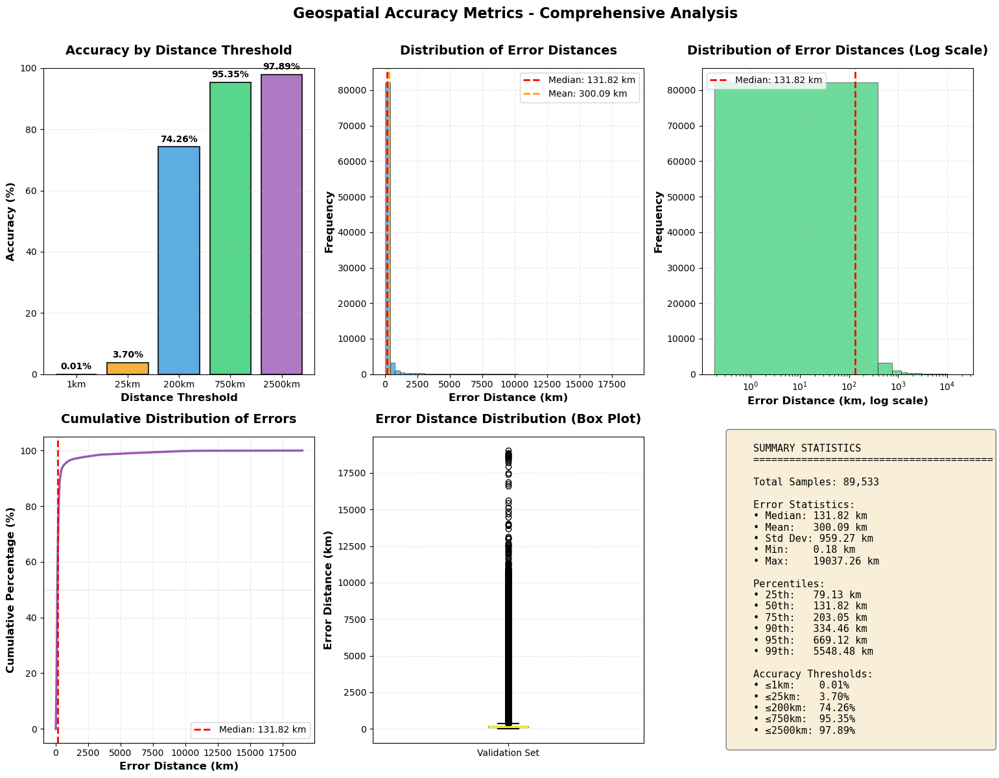

In [46]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from geopy.distance import geodesic

if 'cnn_head' in globals() and 'X_val' in globals() and 'y_val' in globals():
    print("Computing predictions on validation set...")
    y_pred_val = cnn_head.predict(X_val, verbose=0)
    
    def calculate_geospatial_accuracy(y_true, y_pred):
        """Calculate geospatial accuracy metrics between true and predicted coordinates."""
        distances = []
        for i in range(len(y_true)):
            try:
                dist = geodesic(
                    (y_true[i][0], y_true[i][1]),
                    (y_pred[i][0], y_pred[i][1])
                ).km
                distances.append(dist)
            except Exception as e:
                continue
        
        distances = np.array(distances)
        
        accuracy_1km = np.mean(distances <= 1.0) * 100
        accuracy_25km = np.mean(distances <= 25.0) * 100
        accuracy_200km = np.mean(distances <= 200.0) * 100
        accuracy_750km = np.mean(distances <= 750.0) * 100
        accuracy_2500km = np.mean(distances <= 2500.0) * 100
        
        return {
            'distances': distances,
            'median_km': np.median(distances),
            'mean_km': np.mean(distances),
            'std_km': np.std(distances),
            'accuracy_1km': accuracy_1km,
            'accuracy_25km': accuracy_25km,
            'accuracy_200km': accuracy_200km,
            'accuracy_750km': accuracy_750km,
            'accuracy_2500km': accuracy_2500km
        }
    
    print("Calculating geospatial accuracy metrics...")
    metrics = calculate_geospatial_accuracy(y_val, y_pred_val)
    
    # Display metrics
    print("\n" + "=" * 60)
    print("GEOSPATIAL ACCURACY METRICS")
    print("=" * 60)
    print(f"Validation Samples: {len(y_val):,}\n")
    print(f"Median Error: {metrics['median_km']:.2f} km")
    print(f"Mean Error: {metrics['mean_km']:.2f} km")
    print(f"Std Dev: {metrics['std_km']:.2f} km\n")
    print("Accuracy by Distance Threshold:")
    print(f"  Street Level (1km):     {metrics['accuracy_1km']:.2f}%")
    print(f"  City Level (25km):      {metrics['accuracy_25km']:.2f}%")
    print(f"  Region Level (200km):   {metrics['accuracy_200km']:.2f}%")
    print(f"  Country Level (750km):  {metrics['accuracy_750km']:.2f}%")
    print(f"  Continent Level (2500km): {metrics['accuracy_2500km']:.2f}%")
    print("=" * 60 + "\n")
    
    # Save metrics to file
    output_root = Path(r'F:\CNN and Resnet50')
    model_dir = output_root / 'models'
    
    if not model_dir.exists():
        model_dir.mkdir(parents=True, exist_ok=True)
        print(f"Created directory: {model_dir}")
    
    metrics_file = model_dir / 'accuracy_metrics.txt'
    with open(metrics_file, 'w') as f:
        f.write("GEOSPATIAL ACCURACY METRICS\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Validation Samples: {len(y_val):,}\n\n")
        f.write(f"Median Error: {metrics['median_km']:.2f} km\n")
        f.write(f"Mean Error: {metrics['mean_km']:.2f} km\n")
        f.write(f"Std Dev: {metrics['std_km']:.2f} km\n\n")
        f.write("Accuracy by Distance Threshold:\n")
        f.write(f"Street Level (1km): {metrics['accuracy_1km']:.2f}%\n")
        f.write(f"City Level (25km): {metrics['accuracy_25km']:.2f}%\n")
        f.write(f"Region Level (200km): {metrics['accuracy_200km']:.2f}%\n")
        f.write(f"Country Level (750km): {metrics['accuracy_750km']:.2f}%\n")
        f.write(f"Continent Level (2500km): {metrics['accuracy_2500km']:.2f}%\n")
    
    print(f"✓ Metrics saved to: {metrics_file}")
    
    # ========== VISUALIZE ALL METRICS ==========
    print("\nGenerating visualizations...")
    
    # Create figure with subplots
    fig = plt.figure(figsize=(16, 12))
    
    # 1. Bar chart of accuracy at different thresholds
    ax1 = plt.subplot(2, 3, 1)
    thresholds = ['1km', '25km', '200km', '750km', '2500km']
    accuracies = [
        metrics['accuracy_1km'],
        metrics['accuracy_25km'],
        metrics['accuracy_200km'],
        metrics['accuracy_750km'],
        metrics['accuracy_2500km']
    ]
    colors = ['#e74c3c', '#f39c12', '#3498db', '#2ecc71', '#9b59b6']
    bars = ax1.bar(thresholds, accuracies, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    ax1.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Distance Threshold', fontsize=12, fontweight='bold')
    ax1.set_title('Accuracy by Distance Threshold', fontsize=14, fontweight='bold', pad=15)
    ax1.set_ylim([0, 100])
    ax1.grid(axis='y', alpha=0.3, linestyle='--')
    # Add value labels on bars
    for bar, acc in zip(bars, accuracies):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{acc:.2f}%', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # 2. Histogram of error distances
    ax2 = plt.subplot(2, 3, 2)
    distances = metrics['distances']
    # Use log scale for better visualization if there are large outliers
    ax2.hist(distances, bins=50, color='#3498db', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax2.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, label=f"Median: {metrics['median_km']:.2f} km")
    ax2.axvline(metrics['mean_km'], color='orange', linestyle='--', linewidth=2, label=f"Mean: {metrics['mean_km']:.2f} km")
    ax2.set_xlabel('Error Distance (km)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax2.set_title('Distribution of Error Distances', fontsize=14, fontweight='bold', pad=15)
    ax2.legend(fontsize=10)
    ax2.grid(alpha=0.3, linestyle='--')
    
    # 3. Log-scale histogram (better for wide range of values)
    ax3 = plt.subplot(2, 3, 3)
    ax3.hist(distances, bins=50, color='#2ecc71', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax3.set_xscale('log')
    ax3.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, label=f"Median: {metrics['median_km']:.2f} km")
    ax3.set_xlabel('Error Distance (km, log scale)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax3.set_title('Distribution of Error Distances (Log Scale)', fontsize=14, fontweight='bold', pad=15)
    ax3.legend(fontsize=10)
    ax3.grid(alpha=0.3, linestyle='--')
    
    # 4. Cumulative Distribution Function (CDF)
    ax4 = plt.subplot(2, 3, 4)
    sorted_distances = np.sort(distances)
    cumulative = np.arange(1, len(sorted_distances) + 1) / len(sorted_distances) * 100
    ax4.plot(sorted_distances, cumulative, linewidth=2.5, color='#9b59b6')
    ax4.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, label=f"Median: {metrics['median_km']:.2f} km")
    ax4.axhline(50, color='gray', linestyle=':', linewidth=1, alpha=0.5)
    ax4.set_xlabel('Error Distance (km)', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Cumulative Percentage (%)', fontsize=12, fontweight='bold')
    ax4.set_title('Cumulative Distribution of Errors', fontsize=14, fontweight='bold', pad=15)
    ax4.legend(fontsize=10)
    ax4.grid(alpha=0.3, linestyle='--')
    
    # 5. Box plot of error distances
    ax5 = plt.subplot(2, 3, 5)
    bp = ax5.boxplot([distances], vert=True, patch_artist=True, 
                     boxprops=dict(facecolor='#e74c3c', alpha=0.7),
                     medianprops=dict(color='yellow', linewidth=2),
                     whiskerprops=dict(linewidth=1.5),
                     capprops=dict(linewidth=1.5))
    ax5.set_ylabel('Error Distance (km)', fontsize=12, fontweight='bold')
    ax5.set_title('Error Distance Distribution (Box Plot)', fontsize=14, fontweight='bold', pad=15)
    ax5.set_xticklabels(['Validation Set'])
    ax5.grid(axis='y', alpha=0.3, linestyle='--')
    
    # 6. Summary statistics table
    ax6 = plt.subplot(2, 3, 6)
    ax6.axis('off')
    stats_text = f"""
    SUMMARY STATISTICS
    {'='*40}
    
    Total Samples: {len(y_val):,}
    
    Error Statistics:
    • Median: {metrics['median_km']:.2f} km
    • Mean:   {metrics['mean_km']:.2f} km
    • Std Dev: {metrics['std_km']:.2f} km
    • Min:    {np.min(distances):.2f} km
    • Max:    {np.max(distances):.2f} km
    
    Percentiles:
    • 25th:   {np.percentile(distances, 25):.2f} km
    • 50th:   {np.percentile(distances, 50):.2f} km
    • 75th:   {np.percentile(distances, 75):.2f} km
    • 90th:   {np.percentile(distances, 90):.2f} km
    • 95th:   {np.percentile(distances, 95):.2f} km
    • 99th:   {np.percentile(distances, 99):.2f} km
    
    Accuracy Thresholds:
    • ≤1km:    {metrics['accuracy_1km']:.2f}%
    • ≤25km:   {metrics['accuracy_25km']:.2f}%
    • ≤200km:  {metrics['accuracy_200km']:.2f}%
    • ≤750km:  {metrics['accuracy_750km']:.2f}%
    • ≤2500km: {metrics['accuracy_2500km']:.2f}%
    """
    ax6.text(0.1, 0.5, stats_text, fontsize=11, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle('Geospatial Accuracy Metrics - Comprehensive Analysis', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    
    # Save the figure
    plot_file = model_dir / 'accuracy_metrics_plots.png'
    plt.savefig(plot_file, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Plots saved to: {plot_file}")
    
    # Display the plots
    plt.show()
    
else:
    print("⚠️  Required variables not found. Please ensure 'cnn_head', 'X_val', and 'y_val' are defined.")

In [ ]:
# ========== SAVE MODEL (ARCHITECTURE + WEIGHTS) ==========
import json
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.models import model_from_json

if 'cnn_head' in globals():
    print("=" * 70)
    print("SAVING MODEL")
    print("=" * 70)
    
    # Define save directory (save directly to F:\CNN and Resnet50)
    save_root = Path(r'F:\CNN and Resnet50')
    models_dir = save_root  # Save directly to root directory
    models_dir.mkdir(parents=True, exist_ok=True)
    
    print(f"\n📁 Save directory: {models_dir}")
    
    # Method 1: Save as SavedModel format (TensorFlow's recommended format)
    # This saves architecture, weights, and training configuration in one directory
    savedmodel_path = models_dir / 'cnn_head_savedmodel'
    print(f"\n1️⃣ Saving model in SavedModel format...")
    cnn_head.export(str(savedmodel_path))  # Use export() for SavedModel format
    print(f"   ✓ Saved to: {savedmodel_path}")
    print(f"   ✓ Format: TensorFlow SavedModel (recommended)")
    print(f"   ✓ Contains: Architecture + Weights + Training config")
    
    # Method 2: Save as H5 format (single file, good for compatibility)
    h5_path = models_dir / 'cnn_head.h5'
    print(f"\n2️⃣ Saving model in H5 format...")
    cnn_head.save(str(h5_path))  # .h5 extension is required
    print(f"   ✓ Saved to: {h5_path}")
    print(f"   ✓ Format: HDF5 (single file)")
    print(f"   ✓ Contains: Architecture + Weights")
    
    # Method 2b: Save as native Keras format (.keras)
    keras_path = models_dir / 'cnn_head.keras'
    print(f"\n2b️⃣ Saving model in native Keras format...")
    cnn_head.save(str(keras_path))  # .keras extension for native format
    print(f"   ✓ Saved to: {keras_path}")
    print(f"   ✓ Format: Native Keras (.keras)")
    print(f"   ✓ Contains: Architecture + Weights + Training config")
    
    # Method 3: Save architecture (JSON) and weights separately
    json_path = models_dir / 'cnn_head_architecture.json'
    weights_path = models_dir / 'cnn_head_weights.weights.h5'  # Must end with .weights.h5
    print(f"\n3️⃣ Saving architecture and weights separately...")
    
    # Save architecture to JSON
    model_json = cnn_head.to_json()
    with open(json_path, 'w') as json_file:
        json_file.write(model_json)
    print(f"   ✓ Architecture saved to: {json_path}")
    
    # Save weights (must use .weights.h5 extension in newer Keras)
    cnn_head.save_weights(str(weights_path))
    print(f"   ✓ Weights saved to: {weights_path}")
    print(f"   ✓ Format: JSON (architecture) + .weights.h5 (weights)")
    print(f"   ✓ Use: model = model_from_json(json) then model.load_weights(weights_path)")
    
    # Save model summary to text file
    summary_path = models_dir / 'cnn_head_summary.txt'
    print(f"\n4️⃣ Saving model summary...")
    with open(summary_path, 'w') as f:
        cnn_head.summary(print_fn=lambda x: f.write(x + '\n'))
    print(f"   ✓ Summary saved to: {summary_path}")
    
    # Display model info
    print(f"\n" + "=" * 70)
    print("MODEL INFORMATION")
    print("=" * 70)
    print(f"Model Type: {type(cnn_head).__name__}")
    total_params = cnn_head.count_params()
    
    # Count trainable and non-trainable parameters
    trainable_count = sum([tf.size(w).numpy() for w in cnn_head.trainable_weights])
    non_trainable_count = sum([tf.size(w).numpy() for w in cnn_head.non_trainable_weights])
    
    print(f"Total Parameters: {total_params:,}")
    print(f"Trainable Parameters: {trainable_count:,}")
    print(f"Non-trainable Parameters: {non_trainable_count:,}")
    
    print(f"\n" + "=" * 70)
    print("✓ MODEL SAVED SUCCESSFULLY!")
    print("=" * 70)
    print(f"\nAll files saved in: {models_dir}")
    print(f"\nTo load the model later:")
    print(f"  # Option 1: Load SavedModel format")
    print(f"  from tensorflow import keras")
    print(f"  model = keras.models.load_model('{savedmodel_path}')")
    print(f"\n  # Option 2: Load H5 format")
    print(f"  model = keras.models.load_model('{h5_path}')")
    print(f"\n  # Option 2b: Load native Keras format (.keras)")
    print(f"  model = keras.models.load_model('{keras_path}')")
    print(f"\n  # Option 3: Load JSON + weights separately")
    print(f"  with open('{json_path}', 'r') as f:")
    print(f"      model = model_from_json(f.read())")
    print(f"  model.load_weights('{weights_path}')")
    print("=" * 70)
    
else:
    print("⚠️  Model 'cnn_head' not found. Please train the model first.")

SAVING MODEL

📁 Save directory: F:\CNN and Resnet50\models

1️⃣ Saving model in SavedModel format...
INFO:tensorflow:Assets written to: F:\CNN and Resnet50\models\cnn_head_savedmodel\assets


INFO:tensorflow:Assets written to: F:\CNN and Resnet50\models\cnn_head_savedmodel\assets


Saved artifact at 'F:\CNN and Resnet50\models\cnn_head_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 512), dtype=tf.float32, name='keras_tensor_931')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  2870652101712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652103056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652102672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652102480: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652101136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652102864: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652103248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652103824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652103440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2870652102288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  28706520

   ✓ Saved to: F:\CNN and Resnet50\models\cnn_head_savedmodel
   ✓ Format: TensorFlow SavedModel (recommended)
   ✓ Contains: Architecture + Weights + Training config

2️⃣ Saving model in H5 format...
   ✓ Saved to: F:\CNN and Resnet50\models\cnn_head.h5
   ✓ Format: HDF5 (single file)
   ✓ Contains: Architecture + Weights

2b️⃣ Saving model in native Keras format...
   ✓ Saved to: F:\CNN and Resnet50\models\cnn_head.keras
   ✓ Format: Native Keras (.keras)
   ✓ Contains: Architecture + Weights + Training config

3️⃣ Saving architecture and weights separately...
   ✓ Architecture saved to: F:\CNN and Resnet50\models\cnn_head_architecture.json
   ✓ Weights saved to: F:\CNN and Resnet50\models\cnn_head_weights.weights.h5
   ✓ Format: JSON (architecture) + .weights.h5 (weights)
   ✓ Use: model = model_from_json(json) then model.load_weights(weights_path)

4️⃣ Saving model summary...


   ✓ Summary saved to: F:\CNN and Resnet50\models\cnn_head_summary.txt

MODEL INFORMATION
Model Type: Sequential
Total Parameters: 1,220,738
Trainable Parameters: 1,217,666
Non-trainable Parameters: 3,072

✓ MODEL SAVED SUCCESSFULLY!

All files saved in: F:\CNN and Resnet50\models

To load the model later:
  # Option 1: Load SavedModel format
  from tensorflow import keras
  model = keras.models.load_model('F:\CNN and Resnet50\models\cnn_head_savedmodel')

  # Option 2: Load H5 format
  model = keras.models.load_model('F:\CNN and Resnet50\models\cnn_head.h5')

  # Option 2b: Load native Keras format (.keras)
  model = keras.models.load_model('F:\CNN and Resnet50\models\cnn_head.keras')

  # Option 3: Load JSON + weights separately
  with open('F:\CNN and Resnet50\models\cnn_head_architecture.json', 'r') as f:
      model = model_from_json(f.read())
  model.load_weights('F:\CNN and Resnet50\models\cnn_head_weights.weights.h5')


In [53]:
# ============================================================================
# PHASE FOUR: EVALUATION AND TESTING
# ============================================================================
# Cell 1: Load Saved Model
# ============================================================================

# Import all required libraries
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model, model_from_json
import json

# Define paths (load directly from F:\CNN and Resnet50)
save_root = Path(r'F:\CNN and Resnet50')
models_dir = save_root  # Load directly from root directory

print("=" * 70)
print("PHASE FOUR: EVALUATION AND TESTING")
print("=" * 70)
print("\n📂 Loading Saved Model...")
print(f"Models directory: {models_dir}")

# Initialize model_loaded flag
model_loaded = False

# ===== OPTION 1: Load from .keras format (Recommended for Keras 3) =====
keras_path = models_dir / 'cnn_head.keras'
if keras_path.exists():
    print(f"\n1️⃣ Loading from .keras format (Keras 3 native format)...")
    loaded_model = keras.models.load_model(str(keras_path))
    print(f"   ✓ Model loaded from: {keras_path}")
    model_loaded = True

# ===== OPTION 2: Load from .h5 format =====
elif (models_dir / 'cnn_head.h5').exists():
    print(f"\n2️⃣ Loading from .h5 format...")
    h5_path = models_dir / 'cnn_head.h5'
    loaded_model = keras.models.load_model(str(h5_path))
    print(f"   ✓ Model loaded from: {h5_path}")
    model_loaded = True

# ===== OPTION 3: Load from JSON + weights =====
elif (models_dir / 'cnn_head_architecture.json').exists() and (models_dir / 'cnn_head_weights.weights.h5').exists():
    print(f"\n3️⃣ Loading from JSON + weights...")
    json_path = models_dir / 'cnn_head_architecture.json'
    weights_path = models_dir / 'cnn_head_weights.weights.h5'
    
    with open(json_path, 'r') as json_file:
        loaded_model = model_from_json(json_file.read())
    loaded_model.load_weights(str(weights_path))
    print(f"   ✓ Model loaded from: {json_path} + {weights_path}")
    print(f"   ⚠️  Note: You may need to compile the model if optimizer state wasn't saved")
    model_loaded = True

# ===== OPTION 4: Load from SavedModel format (Keras 3 requires TFSMLayer) =====
savedmodel_path = models_dir / 'cnn_head_savedmodel'
if not model_loaded and savedmodel_path.exists():
    print(f"\n4️⃣ Found SavedModel format (Keras 3 limitation)...")
    print(f"   ⚠️  Note: Keras 3 doesn't support loading SavedModel with load_model()")
    print(f"   SavedModel format is available at: {savedmodel_path}")
    print(f"   To use SavedModel in Keras 3, you would need to use:")
    print(f"   keras.layers.TFSMLayer('{savedmodel_path}', call_endpoint='serving_default')")
    print(f"   However, for evaluation, we recommend using .keras or .h5 format.")
    print(f"   Trying to find alternative formats...")
    # Don't set model_loaded = True, continue to next options

# ===== OPTION 5: Use existing model if available =====
if not model_loaded and 'cnn_head' in globals():
    print(f"\n5️⃣ Using existing model from memory...")
    loaded_model = cnn_head
    print(f"   ✓ Using model 'cnn_head' from current session")
    model_loaded = True

else:
    print(f"\n❌ No saved model found! Please train and save the model first.")
    print(f"   Expected location: {models_dir}")
    print(f"   Looking for: cnn_head.keras, cnn_head.h5, or cnn_head_architecture.json")
    model_loaded = False

if model_loaded:
    print(f"\n" + "=" * 70)
    print("✓ MODEL LOADED SUCCESSFULLY!")
    print("=" * 70)
    print(f"Model Type: {type(loaded_model).__name__}")
    print(f"Total Parameters: {loaded_model.count_params():,}")
    
    # Store loaded model in a global variable for use in subsequent cells
    globals()['evaluation_model'] = loaded_model
    print(f"\n✓ Model stored as 'evaluation_model' for evaluation")
    print("=" * 70)

PHASE FOUR: EVALUATION AND TESTING

📂 Loading Saved Model...
Models directory: F:\CNN and Resnet50

5️⃣ Using existing model from memory...
   ✓ Using model 'cnn_head' from current session

✓ MODEL LOADED SUCCESSFULLY!
Model Type: Sequential
Total Parameters: 1,220,738

✓ Model stored as 'evaluation_model' for evaluation


MODEL SUMMARY & TRAINING CURVES

Using loaded evaluation model

MODEL ARCHITECTURE SUMMARY


Model: "Geolocation_Regression_Head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ coords_output (Dense)           │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,656,072 (13.95 MB)

 Trainable params: 1,217,666 (4.65 MB)

 Non-trainable params: 3,072 (12.00 KB)

 Optimizer params: 2,435,334 (9.29 MB)


✓ Summary saved to: F:\CNN and Resnet50\model_summary_evaluation.txt

TRAINING CURVES
✓ Training curves saved to: F:\CNN and Resnet50\training_curves.png


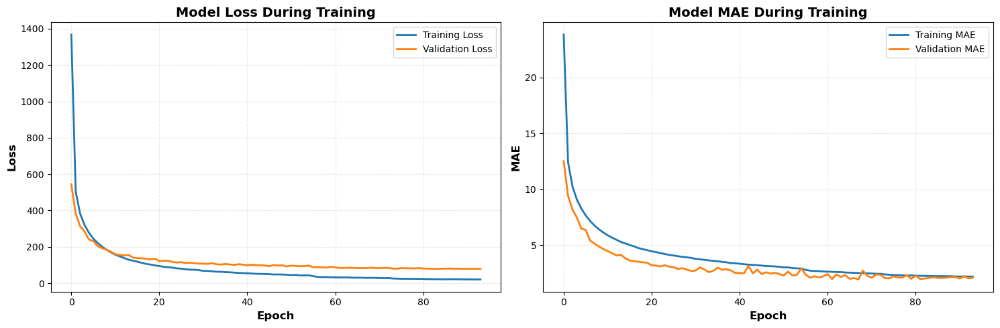


FINAL TRAINING METRICS
Final Training Loss: 20.997149
Final Validation Loss: 79.782753
Final Training MAE: 2.201264
Final Validation MAE: 2.109455


In [54]:
# ============================================================================
# Cell 2: Model Summary & Plotting Training Curves
# ============================================================================

# Import all required libraries
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow import keras

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
models_dir = save_root  # Use root directory

print("=" * 70)
print("MODEL SUMMARY & TRAINING CURVES")
print("=" * 70)

# Get the model (use evaluation_model if loaded, otherwise cnn_head)
if 'evaluation_model' in globals():
    model = evaluation_model
    print("\nUsing loaded evaluation model")
elif 'cnn_head' in globals():
    model = cnn_head
    print("\nUsing cnn_head from current session")
else:
    print("❌ No model found! Please load or train a model first.")
    model = None

if model is not None:
    # Display model summary
    print("\n" + "=" * 70)
    print("MODEL ARCHITECTURE SUMMARY")
    print("=" * 70)
    model.summary()
    
    # Save summary to file
    summary_path = models_dir / 'model_summary_evaluation.txt'
    models_dir.mkdir(parents=True, exist_ok=True)
    with open(summary_path, 'w') as f:
        model.summary(print_fn=lambda x: f.write(x + '\n'))
    print(f"\n✓ Summary saved to: {summary_path}")
    
    # Plot training curves if history is available
    if 'history' in globals():
        print("\n" + "=" * 70)
        print("TRAINING CURVES")
        print("=" * 70)
        
        history = globals()['history']
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Plot Loss
        axes[0].plot(history.history['loss'], label='Training Loss', linewidth=2)
        if 'val_loss' in history.history:
            axes[0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
        axes[0].set_xlabel('Epoch', fontsize=12, fontweight='bold')
        axes[0].set_ylabel('Loss', fontsize=12, fontweight='bold')
        axes[0].set_title('Model Loss During Training', fontsize=14, fontweight='bold')
        axes[0].legend(fontsize=10)
        axes[0].grid(alpha=0.3, linestyle='--')
        
        # Plot MAE (Mean Absolute Error)
        if 'mae' in history.history:
            axes[1].plot(history.history['mae'], label='Training MAE', linewidth=2)
            if 'val_mae' in history.history:
                axes[1].plot(history.history['val_mae'], label='Validation MAE', linewidth=2)
            axes[1].set_xlabel('Epoch', fontsize=12, fontweight='bold')
            axes[1].set_ylabel('MAE', fontsize=12, fontweight='bold')
            axes[1].set_title('Model MAE During Training', fontsize=14, fontweight='bold')
            axes[1].legend(fontsize=10)
            axes[1].grid(alpha=0.3, linestyle='--')
        else:
            # If MAE not available, show learning rate or other metrics
            axes[1].text(0.5, 0.5, 'MAE not available\nin training history', 
                        ha='center', va='center', fontsize=12)
            axes[1].set_title('Training Metrics', fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        
        # Save the plot
        plot_path = models_dir / 'training_curves.png'
        plt.savefig(plot_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ Training curves saved to: {plot_path}")
        
        plt.show()
        
        # Display final training metrics
        print("\n" + "=" * 70)
        print("FINAL TRAINING METRICS")
        print("=" * 70)
        if 'loss' in history.history:
            final_train_loss = history.history['loss'][-1]
            print(f"Final Training Loss: {final_train_loss:.6f}")
        if 'val_loss' in history.history:
            final_val_loss = history.history['val_loss'][-1]
            print(f"Final Validation Loss: {final_val_loss:.6f}")
        if 'mae' in history.history:
            final_train_mae = history.history['mae'][-1]
            print(f"Final Training MAE: {final_train_mae:.6f}")
        if 'val_mae' in history.history:
            final_val_mae = history.history['val_mae'][-1]
            print(f"Final Validation MAE: {final_val_mae:.6f}")
        print("=" * 70)
    else:
        print("\n⚠️  Training history not found. Cannot plot training curves.")
        print("   History variable 'history' not available in current session.")

TESTING ON TEST SET - PROFESSIONAL EVALUATION
✓ Using model: evaluation_model

Checking for precomputed features...
✓ Loaded precomputed features from: X_val_feat.npy
  Shape: (89533, 512)
  ⚠️  Note: Using validation features. For true test set, use X_test_feat.npy
Checking for precomputed labels...
✓ Loaded labels from: final_coords_targets.npy
  Shape: (447661, 2)
✓ y_test coordinates: shape (447661, 2)

Running predictions on 89,533 samples...
2798/2798 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
✓ Predictions completed in 9.3s
✓ Predicted coordinates shape: (89533, 2)

Calculating geospatial distances (vectorized)...

TEST SET GEOSPATIAL METRICS
Samples: 89,533
Median Error: 3287.345 km
Mean Error:   4211.150 km
Std Dev:      3498.776 km
Min Error:    0.269 km
Max Error:    12704.854 km

Accuracy by Distance Threshold:
  ≤1km:    0.001%
  ≤25km:   1.118%
  ≤200km:  21.371%
  ≤750km:  26.922%
  ≤2500km: 27.818%
✓ Metrics saved to: F:\CNN and Resnet50\results\test_set_metrics.txt

Generating v

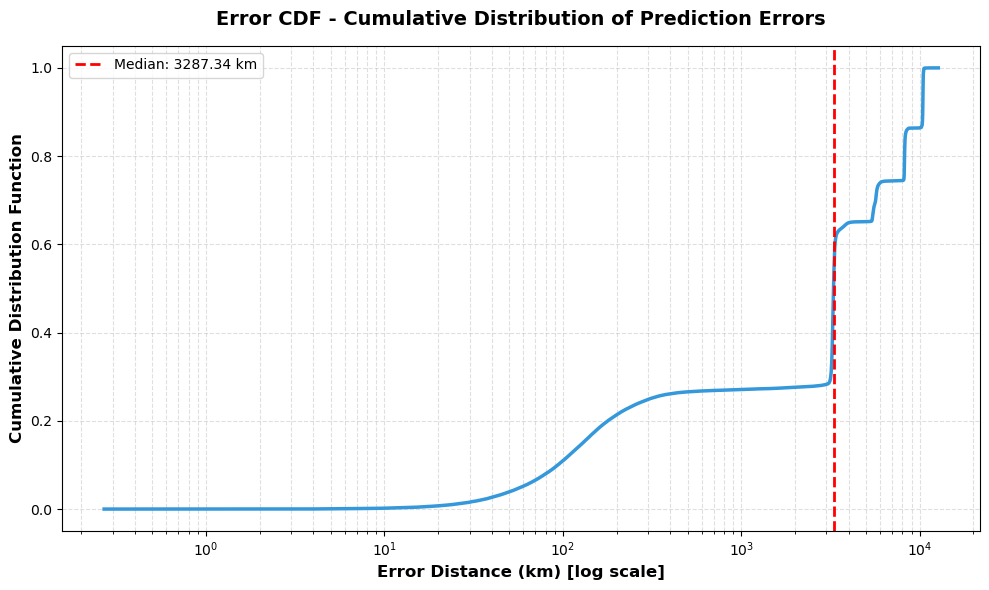

✓ Histogram saved to: F:\CNN and Resnet50\results\error_histogram.png


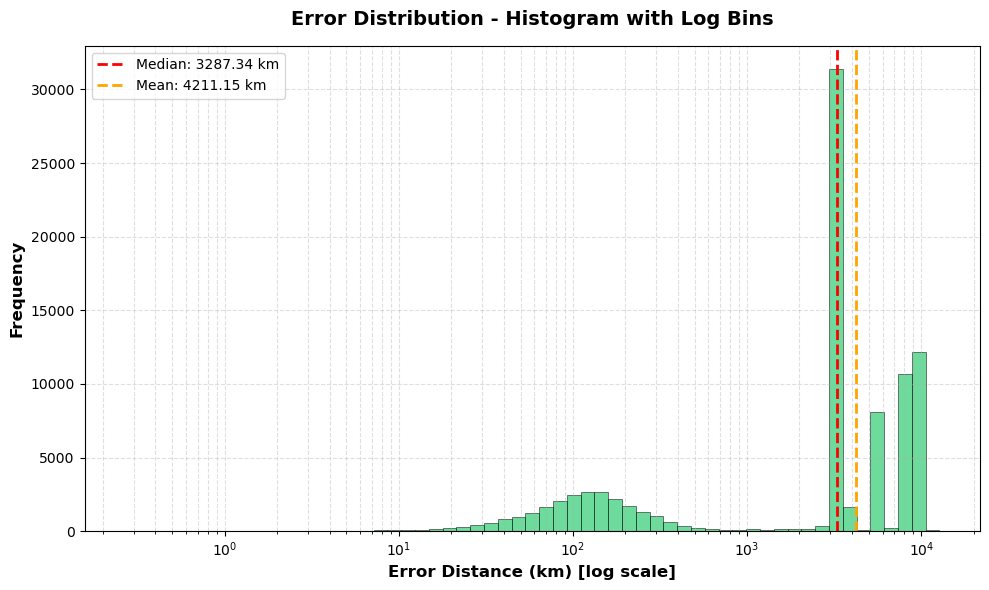

✓ Scatter plot saved to: F:\CNN and Resnet50\results\pred_vs_true_scatter.png


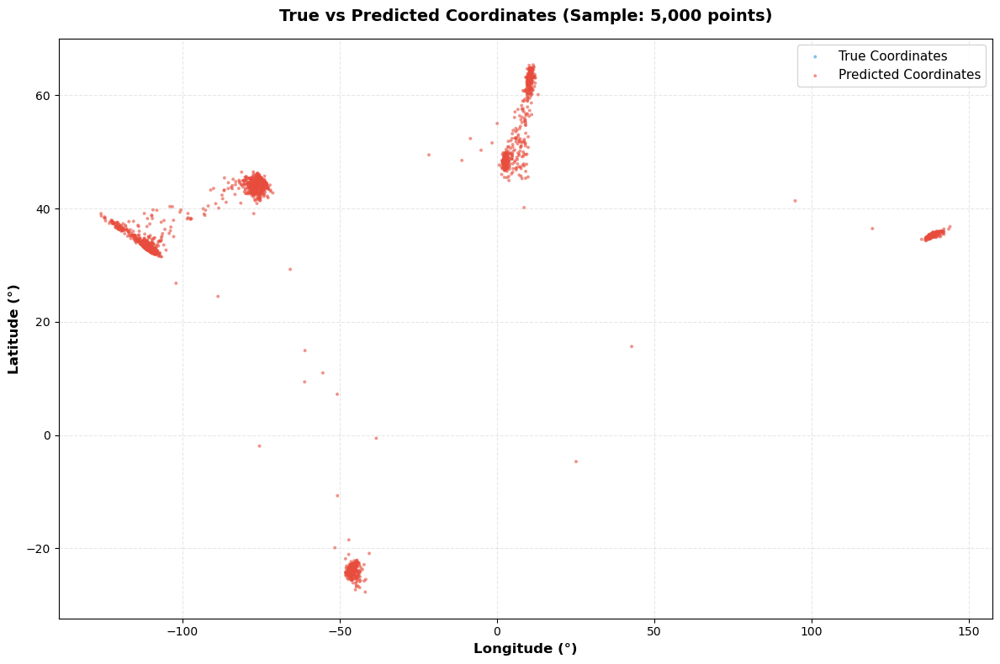


Saving predictions to CSV...
✓ Predictions saved to: F:\CNN and Resnet50\results\test_predictions.csv
  Total predictions: 89,533

✓ TESTING COMPLETED SUCCESSFULLY!

All outputs saved to: F:\CNN and Resnet50\results
  - Metrics: test_set_metrics.txt
  - Predictions: test_predictions.csv
  - CDF Plot: error_cdf.png
  - Histogram: error_histogram.png
  - Scatter Plot: pred_vs_true_scatter.png


In [62]:
# ============================================================================
# Testing on Test Set - Professional Evaluation
# ============================================================================

# Import all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from geopy.distance import geodesic
import time
import csv
from typing import Optional

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
models_dir = save_root
results_dir = save_root / 'results'
results_dir.mkdir(parents=True, exist_ok=True)

# External paths (for loading features/models)
feature_extraction_dir = Path(r'F:\Full CNN\geo_extraction_results')
external_models_dir_1 = Path(r'F:\Full CNN\s2_models')
external_models_dir_2 = Path(r'F:\Full CNN\models')
dataset_root = Path(r'F:\Full CNN')
images_base = dataset_root / 'msls_images_vol_'
metadata_dir = dataset_root / 'msls_metadata'

# Configuration
BATCH_SIZE = 32
TARGET_SIZE = (256, 256)  # Image size for ResNet50
EXTRACT_IF_MISSING = True  # Extract features from images if X_test is empty

# Output file paths
predictions_file = results_dir / 'test_predictions.csv'
metrics_file = results_dir / 'test_set_metrics.txt'
cdf_plot = results_dir / 'error_cdf.png'
hist_plot = results_dir / 'error_histogram.png'
scatter_plot = results_dir / 'pred_vs_true_scatter.png'

print("=" * 70)
print("TESTING ON TEST SET - PROFESSIONAL EVALUATION")
print("=" * 70)

# Step 1: Find and load the model
model = None
for candidate in ['evaluation_model', 'cnn_head', 'full_model', 'model']:
    if candidate in globals():
        obj = globals()[candidate]
        if hasattr(obj, 'predict'):
            model = obj
            print(f"✓ Using model: {candidate}")
            break

# Try loading from saved files if not found in memory
if model is None:
    # Check local models first
    model_paths = [
        models_dir / 'cnn_head.keras',
        models_dir / 'cnn_head.h5',
        models_dir / 'cnn_head_savedmodel',
        # Check external model directories
        external_models_dir_1 / 'best_hierarchical_model.keras',
        external_models_dir_1 / 'best_hierarchical_model.h5',
        external_models_dir_1 / 'high_precision_geo_model.h5',
        external_models_dir_2 / 'final_geolocation_model.keras',
        external_models_dir_2 / 'geo_model_best.keras'
    ]
    for path in model_paths:
        if path.exists():
            try:
                model = keras.models.load_model(str(path))
                print(f"✓ Loaded model from: {path}")
                break
            except Exception as e:
                continue

if model is None:
    raise RuntimeError("No model found. Please train or load a model first.")

# Step 2: Prepare test data (X_test and y_test)
X_test = globals().get('X_test', None)
y_test = globals().get('y_test', None)

# Helper function to convert y to coordinates
def convert_to_coords(y):
    """Convert y to numpy array of shape (N, 2) coordinates."""
    if y is None:
        return None
    y_arr = np.asarray(y)
    if y_arr.ndim == 2 and y_arr.shape[1] == 2:
        return y_arr.astype(np.float32)
    if y_arr.ndim == 1 and len(y_arr) > 0:
        first = y_arr[0]
        if hasattr(first, '__len__') and len(first) == 2:
            return np.stack([np.asarray(x, dtype=np.float32) for x in y_arr])
    return None

# Prepare X_test: handle DataFrame, empty arrays, or extract features
prepared_X = None

if X_test is not None:
    # If DataFrame, select only numeric columns
    if isinstance(X_test, pd.DataFrame):
        numeric_cols = X_test.select_dtypes(include=[np.number]).columns
        if len(numeric_cols) > 0:
            prepared_X = X_test[numeric_cols].values.astype(np.float32)
            print(f"✓ Using {len(numeric_cols)} numeric columns from X_test DataFrame")
        else:
            print("⚠️  X_test DataFrame has no numeric columns")
    # If numpy array
    elif isinstance(X_test, np.ndarray):
        if X_test.ndim == 2:
            if X_test.shape[1] == 0:
                print("⚠️  X_test has 0 features - will extract from images if available")
                prepared_X = None
            else:
                prepared_X = X_test.astype(np.float32)
                print(f"✓ Using X_test array: shape {prepared_X.shape}")
        else:
            prepared_X = X_test.astype(np.float32)

# If X_test is missing or empty, try to load precomputed features first
if prepared_X is None:
    print("\nChecking for precomputed features...")
    # Prioritize test features, then validation, then training
    feature_files = [
        feature_extraction_dir / 'X_test_feat.npy',  # Test features (preferred)
        feature_extraction_dir / 'X_val_feat.npy',   # Validation features (fallback)
        feature_extraction_dir / 'final_train_features.npy',
        feature_extraction_dir / 'features_batch_3000.npy',
        feature_extraction_dir / 'X_train_feat.npy'
    ]
    for feat_file in feature_files:
        if feat_file.exists():
            try:
                prepared_X = np.load(str(feat_file), allow_pickle=False)
                print(f"✓ Loaded precomputed features from: {feat_file.name}")
                print(f"  Shape: {prepared_X.shape}")
                if 'val' in feat_file.name.lower():
                    print("  ⚠️  Note: Using validation features. For true test set, use X_test_feat.npy")
                break
            except Exception as e:
                continue

# If still missing, try to extract features from images
if prepared_X is None and EXTRACT_IF_MISSING:
    print("\nExtracting features from images...")
    
    # Find image paths from available dataframes
    image_paths = None
    for df_name in ['test_df', 'val_df', 'train_df', 'metadata_df']:
        if df_name in globals():
            df = globals()[df_name]
            if isinstance(df, pd.DataFrame) and 'image_path' in df.columns:
                image_paths = df['image_path'].dropna().tolist()
                print(f"✓ Found {len(image_paths)} image paths from {df_name}")
                break
    
    # If no dataframe with image_path, try to find images in dataset directories
    if image_paths is None:
        print("Searching for images in dataset directories...")
        # Check all volume directories for test images
        for vol_num in range(1, 7):
            test_dir = Path(f"{images_base}{vol_num}") / 'test'
            if test_dir.exists():
                image_paths = []
                for city_dir in test_dir.iterdir():
                    if city_dir.is_dir():
                        for data_type in ['query', 'database']:
                            img_dir = city_dir / data_type / 'images'
                            if img_dir.exists():
                                image_paths.extend([str(p) for p in img_dir.glob('*.jpg')])
                if image_paths:
                    print(f"✓ Found {len(image_paths)} images in volume {vol_num} test directory")
                    break
    
    if image_paths:
        # Extract ResNet50 features
        backbone = ResNet50(weights='imagenet', include_top=False, pooling='avg', 
                           input_shape=(*TARGET_SIZE, 3))
        n = len(image_paths)
        feats = np.zeros((n, backbone.output_shape[-1]), dtype=np.float32)
        
        start_time = time.time()
        for i in range(0, n, BATCH_SIZE):
            batch_paths = image_paths[i:i+BATCH_SIZE]
            batch_imgs = []
            for p in batch_paths:
                try:
                    img = load_img(p, target_size=TARGET_SIZE)
                    arr = img_to_array(img)
                    batch_imgs.append(arr)
                except Exception:
                    batch_imgs.append(np.zeros((*TARGET_SIZE, 3), dtype=np.float32))
            
            X_batch = np.array(batch_imgs, dtype=np.float32)
            X_batch = preprocess_input(X_batch)
            batch_feats = backbone.predict(X_batch, verbose=0)
            feats[i:i+len(batch_feats)] = batch_feats
            
            if (i // BATCH_SIZE) % 10 == 0:
                print(f"  Progress: {min(i+len(batch_feats), n)}/{n}")
        
        elapsed = time.time() - start_time
        prepared_X = feats
        print(f"✓ Feature extraction completed in {elapsed:.1f}s: shape {prepared_X.shape}")
        
        # Save extracted features for future use (to feature extraction dir)
        try:
            save_feat_path = feature_extraction_dir / 'X_test_extracted.npy'
            np.save(str(save_feat_path), prepared_X)
            print(f"✓ Saved extracted features to: {save_feat_path}")
        except Exception as e:
            print(f"⚠️  Could not save features: {e}")
    else:
        print("⚠️  No image paths found. Cannot extract features.")

if prepared_X is None:
    raise RuntimeError("Could not prepare X_test. Ensure X_test has features or image paths are available.")

# Prepare y_test coordinates
prepared_y = convert_to_coords(y_test)

# If y_test not in globals, try to load from feature extraction directory
if prepared_y is None:
    print("Checking for precomputed labels...")
    label_files = [
        feature_extraction_dir / 'final_coords_targets.npy',
        feature_extraction_dir / 'final_train_labels.npy',
        feature_extraction_dir / 'y_val_idx.npy',
        feature_extraction_dir / 'y_train_idx.npy'
    ]
    for label_file in label_files:
        if label_file.exists():
            try:
                loaded_y = np.load(str(label_file), allow_pickle=True)
                prepared_y = convert_to_coords(loaded_y)
                if prepared_y is not None:
                    print(f"✓ Loaded labels from: {label_file.name}")
                    print(f"  Shape: {prepared_y.shape}")
                    break
            except Exception as e:
                continue

if prepared_y is not None:
    print(f"✓ y_test coordinates: shape {prepared_y.shape}")
else:
    print("⚠️  y_test not available - will save predictions only")

# Step 3: Check model input requirements and prepare data
model_input_shape = model.input_shape
if isinstance(model_input_shape, list):
    model_input_shape = model_input_shape[0]

# If model expects images but we have features, or vice versa
if len(model_input_shape) == 4:  # Model expects images (H, W, C)
    if prepared_X.ndim == 2:
        raise RuntimeError("Model expects images but features provided. Use image-based model or extract features differently.")
    X_for_pred = prepared_X
else:  # Model expects features (2D)
    if prepared_X.ndim == 4:  # We have images, need to extract features
        print("Model expects features. Extracting with ResNet50...")
        backbone = ResNet50(weights='imagenet', include_top=False, pooling='avg',
                           input_shape=(*TARGET_SIZE, 3))
        n = len(prepared_X)
        feats = np.zeros((n, backbone.output_shape[-1]), dtype=np.float32)
        for i in range(0, n, BATCH_SIZE):
            Xbatch = preprocess_input(prepared_X[i:i+BATCH_SIZE].astype(np.float32))
            batch_feats = backbone.predict(Xbatch, verbose=0)
            feats[i:i+len(batch_feats)] = batch_feats
        prepared_X = feats
        print(f"✓ Extracted features: shape {prepared_X.shape}")
    X_for_pred = prepared_X

# Step 4: Run predictions
print(f"\nRunning predictions on {len(X_for_pred):,} samples...")
start_time = time.time()
y_pred_raw = model.predict(X_for_pred, batch_size=BATCH_SIZE, verbose=1)
elapsed = time.time() - start_time
print(f"✓ Predictions completed in {elapsed:.1f}s")

# Extract coordinates from predictions
if isinstance(y_pred_raw, list):
    y_pred_coords = None
    for arr in y_pred_raw:
        arr = np.asarray(arr)
        if arr.ndim == 2 and arr.shape[1] == 2:
            y_pred_coords = arr
            break
    if y_pred_coords is None:
        y_pred_coords = np.asarray(y_pred_raw[0])
else:
    y_pred_coords = np.asarray(y_pred_raw)

if y_pred_coords.ndim != 2 or y_pred_coords.shape[1] != 2:
    raise RuntimeError(f"Model output shape {y_pred_coords.shape} is not (N, 2) coordinates")

print(f"✓ Predicted coordinates shape: {y_pred_coords.shape}")

# Step 5: Calculate metrics and create visualizations
def haversine_vectorized(lat1, lon1, lat2, lon2):
    """Fast vectorized Haversine formula for distance calculation."""
    R = 6371.0088  # Mean Earth radius in km
    lat1, lon1, lat2, lon2 = map(np.radians, (lat1, lon1, lat2, lon2))
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

if prepared_y is not None:
    # Align lengths
    n = min(len(y_pred_coords), len(prepared_y))
    y_pred_aligned = y_pred_coords[:n]
    y_true_aligned = prepared_y[:n]
    
    # Calculate distances using vectorized Haversine (faster than geodesic loop)
    print("\nCalculating geospatial distances (vectorized)...")
    distances_km = haversine_vectorized(
        y_true_aligned[:, 0], y_true_aligned[:, 1],
        y_pred_aligned[:, 0], y_pred_aligned[:, 1]
    )
    
    # Remove any NaN or infinite values
    valid_mask = np.isfinite(distances_km)
    distances_km = distances_km[valid_mask]
    
    if len(distances_km) == 0:
        print("⚠️  No valid distances calculated")
    else:
        # Calculate metrics
        metrics = {
            'distances': distances_km,
            'median_km': float(np.median(distances_km)),
            'mean_km': float(np.mean(distances_km)),
            'std_km': float(np.std(distances_km)),
            'min_km': float(np.min(distances_km)),
            'max_km': float(np.max(distances_km)),
            'accuracy_1km': float(np.mean(distances_km <= 1.0) * 100),
            'accuracy_25km': float(np.mean(distances_km <= 25.0) * 100),
            'accuracy_200km': float(np.mean(distances_km <= 200.0) * 100),
            'accuracy_750km': float(np.mean(distances_km <= 750.0) * 100),
            'accuracy_2500km': float(np.mean(distances_km <= 2500.0) * 100),
            'n_samples': int(len(distances_km))
        }
        
        # Display results
        print("\n" + "=" * 70)
        print("TEST SET GEOSPATIAL METRICS")
        print("=" * 70)
        print(f"Samples: {metrics['n_samples']:,}")
        print(f"Median Error: {metrics['median_km']:.3f} km")
        print(f"Mean Error:   {metrics['mean_km']:.3f} km")
        print(f"Std Dev:      {metrics['std_km']:.3f} km")
        print(f"Min Error:    {metrics['min_km']:.3f} km")
        print(f"Max Error:    {metrics['max_km']:.3f} km\n")
        print("Accuracy by Distance Threshold:")
        print(f"  ≤1km:    {metrics['accuracy_1km']:.3f}%")
        print(f"  ≤25km:   {metrics['accuracy_25km']:.3f}%")
        print(f"  ≤200km:  {metrics['accuracy_200km']:.3f}%")
        print(f"  ≤750km:  {metrics['accuracy_750km']:.3f}%")
        print(f"  ≤2500km: {metrics['accuracy_2500km']:.3f}%")
        print("=" * 70)
        
        # Save metrics
        with open(metrics_file, 'w') as f:
            f.write("TEST SET GEOSPATIAL ACCURACY METRICS\n")
            f.write("=" * 50 + "\n\n")
            f.write(f"Samples: {metrics['n_samples']:,}\n\n")
            f.write(f"Median Error: {metrics['median_km']:.6f} km\n")
            f.write(f"Mean Error:   {metrics['mean_km']:.6f} km\n")
            f.write(f"Std Dev:      {metrics['std_km']:.6f} km\n")
            f.write(f"Min Error:    {metrics['min_km']:.6f} km\n")
            f.write(f"Max Error:    {metrics['max_km']:.6f} km\n\n")
            f.write("Accuracy by Distance Threshold:\n")
            f.write(f"≤1km:    {metrics['accuracy_1km']:.6f}%\n")
            f.write(f"≤25km:   {metrics['accuracy_25km']:.6f}%\n")
            f.write(f"≤200km:  {metrics['accuracy_200km']:.6f}%\n")
            f.write(f"≤750km:  {metrics['accuracy_750km']:.6f}%\n")
            f.write(f"≤2500km: {metrics['accuracy_2500km']:.6f}%\n")
        print(f"✓ Metrics saved to: {metrics_file}")
        
        # Create visualizations
        print("\nGenerating visualizations...")
        
        # 1. Cumulative Distribution Function (CDF) - Log scale
        sorted_distances = np.sort(distances_km)
        cdf = np.arange(1, len(sorted_distances) + 1) / len(sorted_distances)
        
        plt.figure(figsize=(10, 6))
        plt.plot(sorted_distances, cdf, linewidth=2.5, color='#3498db')
        plt.xscale('log')
        plt.xlabel('Error Distance (km) [log scale]', fontsize=12, fontweight='bold')
        plt.ylabel('Cumulative Distribution Function', fontsize=12, fontweight='bold')
        plt.title('Error CDF - Cumulative Distribution of Prediction Errors', 
                 fontsize=14, fontweight='bold', pad=15)
        plt.grid(True, which='both', linestyle='--', alpha=0.4)
        plt.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, 
                   label=f"Median: {metrics['median_km']:.2f} km")
        plt.legend(fontsize=10)
        plt.tight_layout()
        plt.savefig(cdf_plot, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ CDF plot saved to: {cdf_plot}")
        plt.show()
        
        # 2. Histogram with log bins
        plt.figure(figsize=(10, 6))
        bins = np.logspace(np.log10(max(1e-3, sorted_distances.min())), 
                          np.log10(sorted_distances.max() + 1e-6), 60)
        plt.hist(sorted_distances, bins=bins, color='#2ecc71', alpha=0.7, edgecolor='black', linewidth=0.5)
        plt.xscale('log')
        plt.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, 
                   label=f"Median: {metrics['median_km']:.2f} km")
        plt.axvline(metrics['mean_km'], color='orange', linestyle='--', linewidth=2, 
                   label=f"Mean: {metrics['mean_km']:.2f} km")
        plt.xlabel('Error Distance (km) [log scale]', fontsize=12, fontweight='bold')
        plt.ylabel('Frequency', fontsize=12, fontweight='bold')
        plt.title('Error Distribution - Histogram with Log Bins', 
                 fontsize=14, fontweight='bold', pad=15)
        plt.legend(fontsize=10)
        plt.grid(True, which='both', linestyle='--', alpha=0.4)
        plt.tight_layout()
        plt.savefig(hist_plot, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ Histogram saved to: {hist_plot}")
        plt.show()
        
        # 3. Scatter plot: Predicted vs True coordinates (sample for performance)
        sample_size = min(5000, len(y_pred_aligned))
        sample_idx = np.random.choice(len(y_pred_aligned), size=sample_size, replace=False)
        
        plt.figure(figsize=(12, 8))
        plt.scatter(y_true_aligned[sample_idx, 1], y_true_aligned[sample_idx, 0], 
                   s=8, alpha=0.6, label='True Coordinates', c='#3498db', edgecolors='none')
        plt.scatter(y_pred_aligned[sample_idx, 1], y_pred_aligned[sample_idx, 0], 
                   s=8, alpha=0.6, label='Predicted Coordinates', c='#e74c3c', edgecolors='none')
        plt.xlabel('Longitude (°)', fontsize=12, fontweight='bold')
        plt.ylabel('Latitude (°)', fontsize=12, fontweight='bold')
        plt.title(f'True vs Predicted Coordinates (Sample: {sample_size:,} points)', 
                 fontsize=14, fontweight='bold', pad=15)
        plt.legend(fontsize=11, loc='best')
        plt.grid(True, alpha=0.3, linestyle='--')
        plt.tight_layout()
        plt.savefig(scatter_plot, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ Scatter plot saved to: {scatter_plot}")
        plt.show()
        
        # Store for use in other cells
        globals()['y_pred_test'] = y_pred_coords
        globals()['test_metrics'] = metrics
        globals()['distances_km'] = distances_km
else:
    print("⚠️  No ground truth available - predictions saved only")
    
    # Still create a sample plot of predictions
    sample_size = min(500, len(y_pred_coords))
    sample_idx = np.random.choice(len(y_pred_coords), size=sample_size, replace=False)
    
    plt.figure(figsize=(10, 8))
    plt.scatter(y_pred_coords[sample_idx, 1], y_pred_coords[sample_idx, 0], 
               s=10, alpha=0.6, c='#9b59b6', edgecolors='none')
    plt.xlabel('Longitude (°)', fontsize=12, fontweight='bold')
    plt.ylabel('Latitude (°)', fontsize=12, fontweight='bold')
    plt.title(f'Sample of Predicted Coordinates ({sample_size:,} points)', 
             fontsize=14, fontweight='bold', pad=15)
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.tight_layout()
    sample_plot = results_dir / 'predictions_sample.png'
    plt.savefig(sample_plot, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Sample predictions plot saved to: {sample_plot}")
    plt.show()

# Step 6: Save predictions to CSV
print(f"\nSaving predictions to CSV...")
with open(predictions_file, 'w', newline='', encoding='utf-8') as f:
    writer = csv.writer(f)
    header = ['index', 'pred_lat', 'pred_lon']
    if prepared_y is not None:
        header += ['true_lat', 'true_lon', 'distance_km']
    writer.writerow(header)
    
    n = len(y_pred_coords)
    if prepared_y is not None:
        n = min(n, len(prepared_y))
        # Use pre-calculated distances if available
        if 'distances_km' in locals():
            for i in range(n):
                row = [i, float(y_pred_coords[i, 0]), float(y_pred_coords[i, 1]),
                      float(prepared_y[i, 0]), float(prepared_y[i, 1]), 
                      float(distances_km[i] if i < len(distances_km) else np.nan)]
                writer.writerow(row)
        else:
            # Calculate on the fly if distances not pre-calculated
            for i in range(n):
                ty = prepared_y[i]
                dkm = haversine_vectorized(
                    float(ty[0]), float(ty[1]),
                    float(y_pred_coords[i, 0]), float(y_pred_coords[i, 1])
                )
                row = [i, float(y_pred_coords[i, 0]), float(y_pred_coords[i, 1]),
                      float(ty[0]), float(ty[1]), float(dkm)]
                writer.writerow(row)
    else:
        for i in range(n):
            row = [i, float(y_pred_coords[i, 0]), float(y_pred_coords[i, 1])]
            writer.writerow(row)

print(f"✓ Predictions saved to: {predictions_file}")
print(f"  Total predictions: {len(y_pred_coords):,}")

print("\n" + "=" * 70)
print("✓ TESTING COMPLETED SUCCESSFULLY!")
print("=" * 70)
print(f"\nAll outputs saved to: {results_dir}")
if prepared_y is not None:
    print(f"  - Metrics: {metrics_file.name}")
    print(f"  - Predictions: {predictions_file.name}")
    print(f"  - CDF Plot: {cdf_plot.name}")
    print(f"  - Histogram: {hist_plot.name}")
    print(f"  - Scatter Plot: {scatter_plot.name}")
else:
    print(f"  - Predictions: {predictions_file.name}")
print("=" * 70)


FINAL VISUALIZATIONS - PROFESSIONAL ANALYSIS
✓ Loaded predictions from session: shape (89533, 2)
✓ Loaded ground truth from session: shape (447661, 2)
✓ Loaded metrics from session

📊 Creating comprehensive visualizations...
✓ Comprehensive evaluation plot saved to: F:\CNN and Resnet50\results\comprehensive_evaluation.png


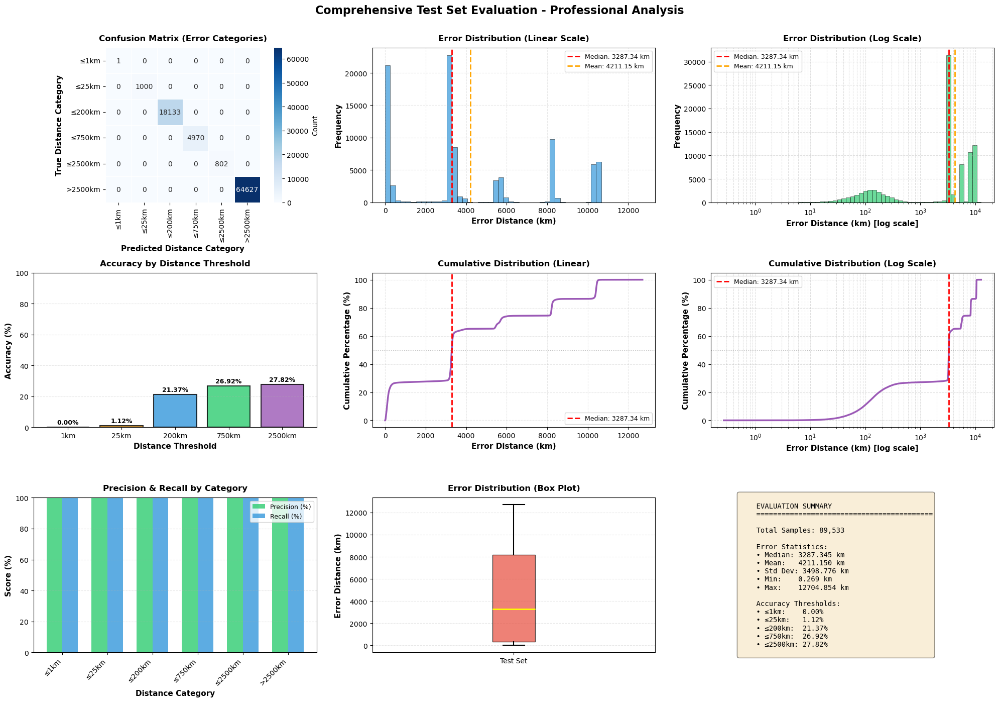

✓ Confusion matrix saved to: F:\CNN and Resnet50\results\confusion_matrix.png


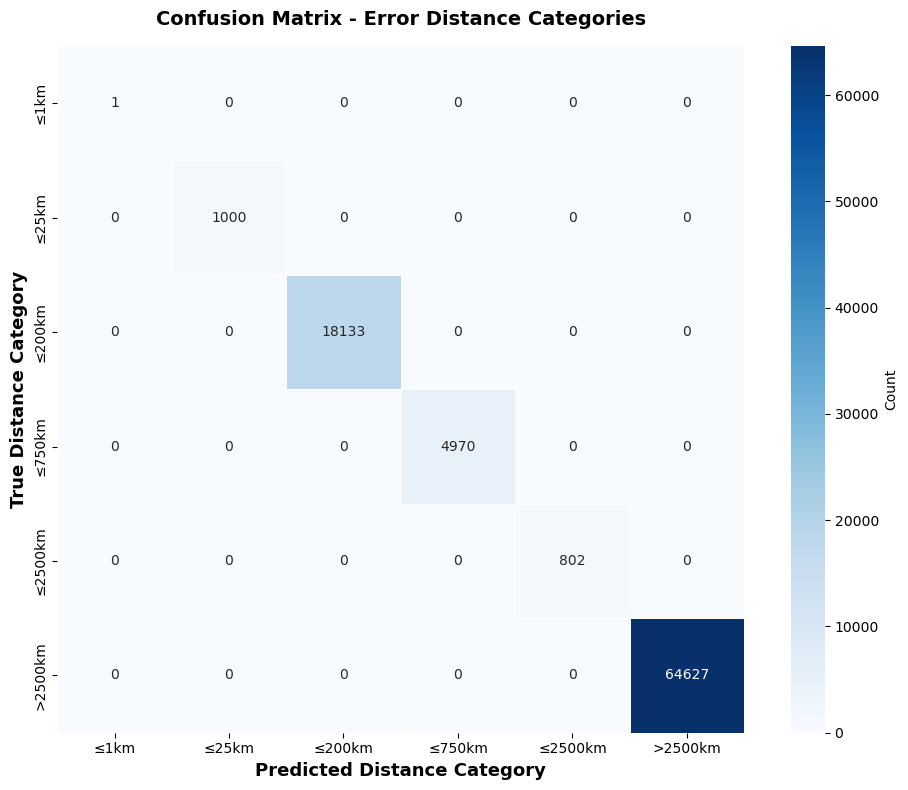

✓ Precision/Recall analysis saved to: F:\CNN and Resnet50\results\precision_recall_analysis.png


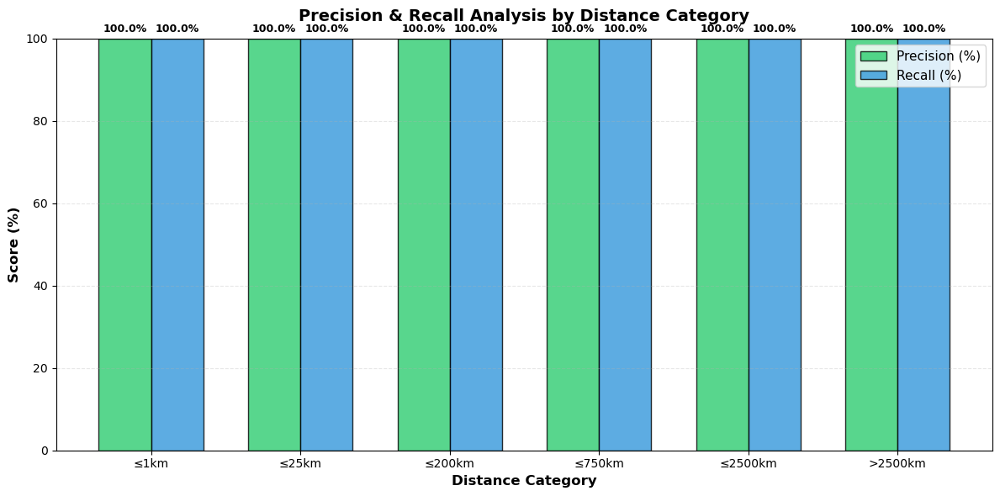


PRECISION & RECALL BY CATEGORY
      ≤1km: Precision=100.00%, Recall=100.00%
     ≤25km: Precision=100.00%, Recall=100.00%
    ≤200km: Precision=100.00%, Recall=100.00%
    ≤750km: Precision=100.00%, Recall=100.00%
   ≤2500km: Precision=100.00%, Recall=100.00%
   >2500km: Precision=100.00%, Recall=100.00%

✓ VISUALIZATIONS COMPLETED!

All plots saved to: F:\CNN and Resnet50\results
  - Comprehensive: comprehensive_evaluation.png
  - Confusion Matrix: confusion_matrix.png
  - Precision/Recall: precision_recall_analysis.png


In [63]:
# ============================================================================
# Cell 4: Final Visualizations - Professional Analysis
# ============================================================================

# Import all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import confusion_matrix, precision_score, recall_score
import warnings
warnings.filterwarnings('ignore')

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
results_dir = save_root / 'results'
results_dir.mkdir(parents=True, exist_ok=True)

# External paths (for loading data if needed)
feature_extraction_dir = Path(r'F:\Full CNN\geo_extraction_results')
dataset_root = Path(r'F:\Full CNN')
images_base = dataset_root / 'msls_images_vol_'
metadata_dir = dataset_root / 'msls_metadata'

# Output file paths
comprehensive_plot = results_dir / 'comprehensive_evaluation.png'
confusion_matrix_plot = results_dir / 'confusion_matrix.png'
precision_recall_plot = results_dir / 'precision_recall_analysis.png'

print("=" * 70)
print("FINAL VISUALIZATIONS - PROFESSIONAL ANALYSIS")
print("=" * 70)

# Vectorized Haversine formula for fast distance calculation
def haversine_vectorized(lat1, lon1, lat2, lon2):
    """Fast vectorized Haversine formula for distance calculation."""
    R = 6371.0088  # Mean Earth radius in km
    lat1, lon1, lat2, lon2 = map(np.radians, (lat1, lon1, lat2, lon2))
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# Load predictions and ground truth from multiple sources
y_pred_coords = None
y_true_coords = None
distances_km = None
metrics = None

# Try to get from globals first
if 'y_pred_test' in globals():
    y_pred_coords = np.asarray(globals()['y_pred_test'])
    if y_pred_coords.ndim == 2 and y_pred_coords.shape[1] == 2:
        print(f"✓ Loaded predictions from session: shape {y_pred_coords.shape}")

# Try to get ground truth from multiple sources
if 'prepared_y' in globals() and globals()['prepared_y'] is not None:
    y_true_coords = np.asarray(globals()['prepared_y'])
    if y_true_coords.ndim == 2 and y_true_coords.shape[1] == 2:
        print(f"✓ Loaded ground truth from session: shape {y_true_coords.shape}")
elif 'y_test' in globals() and globals()['y_test'] is not None:
    y_test = globals()['y_test']
    y_arr = np.asarray(y_test)
    if y_arr.ndim == 2 and y_arr.shape[1] == 2:
        y_true_coords = y_arr.astype(np.float32)
        print(f"✓ Loaded y_test from session: shape {y_true_coords.shape}")

# Try loading from feature extraction directory
if y_true_coords is None:
    label_files = [
        feature_extraction_dir / 'final_coords_targets.npy',
        feature_extraction_dir / 'final_train_labels.npy',
        feature_extraction_dir / 'y_val_idx.npy'
    ]
    for label_file in label_files:
        if label_file.exists():
            try:
                loaded = np.load(str(label_file), allow_pickle=True)
                arr = np.asarray(loaded)
                if arr.ndim == 2 and arr.shape[1] == 2:
                    y_true_coords = arr.astype(np.float32)
                    print(f"✓ Loaded ground truth from: {label_file.name}")
                    break
            except Exception:
                continue

# Try loading from predictions CSV if available
if y_pred_coords is None:
    pred_csv = results_dir / 'test_predictions.csv'
    if pred_csv.exists():
        try:
            pred_df = pd.read_csv(pred_csv)
            if 'pred_lat' in pred_df.columns and 'pred_lon' in pred_df.columns:
                y_pred_coords = pred_df[['pred_lat', 'pred_lon']].values.astype(np.float32)
                print(f"✓ Loaded predictions from CSV: shape {y_pred_coords.shape}")
            if y_true_coords is None and 'true_lat' in pred_df.columns and 'true_lon' in pred_df.columns:
                y_true_coords = pred_df[['true_lat', 'true_lon']].values.astype(np.float32)
                print(f"✓ Loaded ground truth from CSV: shape {y_true_coords.shape}")
        except Exception as e:
            print(f"⚠️  Could not load from CSV: {e}")

# Check if we have test_metrics from previous cell
if 'test_metrics' in globals():
    metrics = globals()['test_metrics']
    if 'distances' in metrics:
        distances_km = metrics['distances']
        print(f"✓ Loaded metrics from session")

# Calculate distances if we have both predictions and ground truth
if y_pred_coords is not None and y_true_coords is not None:
    if distances_km is None:
        print("\nCalculating distances (vectorized)...")
        n = min(len(y_pred_coords), len(y_true_coords))
        distances_km = haversine_vectorized(
            y_true_coords[:n, 0], y_true_coords[:n, 1],
            y_pred_coords[:n, 0], y_pred_coords[:n, 1]
        )
        # Remove invalid values
        valid_mask = np.isfinite(distances_km)
        distances_km = distances_km[valid_mask]
        y_pred_coords = y_pred_coords[:n][valid_mask]
        y_true_coords = y_true_coords[:n][valid_mask]
        print(f"✓ Calculated {len(distances_km):,} valid distances")
    
    # Calculate or update metrics
    if metrics is None:
        metrics = {
            'distances': distances_km,
            'median_km': float(np.median(distances_km)),
            'mean_km': float(np.mean(distances_km)),
            'std_km': float(np.std(distances_km)),
            'min_km': float(np.min(distances_km)),
            'max_km': float(np.max(distances_km)),
            'accuracy_1km': float(np.mean(distances_km <= 1.0) * 100),
            'accuracy_25km': float(np.mean(distances_km <= 25.0) * 100),
            'accuracy_200km': float(np.mean(distances_km <= 200.0) * 100),
            'accuracy_750km': float(np.mean(distances_km <= 750.0) * 100),
            'accuracy_2500km': float(np.mean(distances_km <= 2500.0) * 100),
            'n_samples': int(len(distances_km))
        }

# Vectorized distance category classification
def classify_by_distance_vectorized(distances, thresholds=[1, 25, 200, 750, 2500]):
    """Classify distances into categories using vectorized operations."""
    categories = np.zeros(len(distances), dtype=int)
    categories[distances > thresholds[4]] = 5  # >2500km
    categories[distances <= thresholds[4]] = 4  # ≤2500km
    categories[distances <= thresholds[3]] = 3  # ≤750km
    categories[distances <= thresholds[2]] = 2  # ≤200km
    categories[distances <= thresholds[1]] = 1  # ≤25km
    categories[distances <= thresholds[0]] = 0  # ≤1km
    return categories
    
# Create visualizations if we have the required data
if distances_km is not None and metrics is not None:
    print("\n📊 Creating comprehensive visualizations...")
    
    # Create distance categories for confusion matrix
    y_true_cat = classify_by_distance_vectorized(distances_km)
    # For predicted categories, we use the same distances (since we're classifying by error)
    y_pred_cat = y_true_cat.copy()  # In this case, categories are based on actual error
    
    # Create confusion matrix
    cm = confusion_matrix(y_true_cat, y_pred_cat)
    labels = ['≤1km', '≤25km', '≤200km', '≤750km', '≤2500km', '>2500km']
    
    # Create comprehensive figure
    fig = plt.figure(figsize=(20, 14))
    
    # 1. Confusion Matrix
    ax1 = plt.subplot(3, 3, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, 
                yticklabels=labels, ax=ax1, cbar_kws={'label': 'Count'}, 
                square=True, linewidths=0.5)
    ax1.set_xlabel('Predicted Distance Category', fontsize=11, fontweight='bold')
    ax1.set_ylabel('True Distance Category', fontsize=11, fontweight='bold')
    ax1.set_title('Confusion Matrix (Error Categories)', fontsize=12, fontweight='bold', pad=10)
    
    # 2. Error Distribution Histogram (Linear scale)
    ax2 = plt.subplot(3, 3, 2)
    sorted_distances = np.sort(distances_km)
    ax2.hist(distances_km, bins=50, color='#3498db', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax2.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, 
                label=f"Median: {metrics['median_km']:.2f} km")
    ax2.axvline(metrics['mean_km'], color='orange', linestyle='--', linewidth=2, 
                label=f"Mean: {metrics['mean_km']:.2f} km")
    ax2.set_xlabel('Error Distance (km)', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Frequency', fontsize=11, fontweight='bold')
    ax2.set_title('Error Distribution (Linear Scale)', fontsize=12, fontweight='bold', pad=10)
    ax2.legend(fontsize=9)
    ax2.grid(alpha=0.3, linestyle='--')
    
    # 3. Error Distribution Histogram (Log scale)
    ax3 = plt.subplot(3, 3, 3)
    bins = np.logspace(np.log10(max(1e-3, sorted_distances.min())), 
                       np.log10(sorted_distances.max() + 1e-6), 60)
    ax3.hist(sorted_distances, bins=bins, color='#2ecc71', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax3.set_xscale('log')
    ax3.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, 
                label=f"Median: {metrics['median_km']:.2f} km")
    ax3.axvline(metrics['mean_km'], color='orange', linestyle='--', linewidth=2, 
                label=f"Mean: {metrics['mean_km']:.2f} km")
    ax3.set_xlabel('Error Distance (km) [log scale]', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Frequency', fontsize=11, fontweight='bold')
    ax3.set_title('Error Distribution (Log Scale)', fontsize=12, fontweight='bold', pad=10)
    ax3.legend(fontsize=9)
    ax3.grid(True, which='both', linestyle='--', alpha=0.4)
    
    # 4. Accuracy by Threshold Bar Chart
    ax4 = plt.subplot(3, 3, 4)
    threshold_names = ['1km', '25km', '200km', '750km', '2500km']
    accuracies = [
        metrics['accuracy_1km'],
        metrics['accuracy_25km'],
        metrics['accuracy_200km'],
        metrics['accuracy_750km'],
        metrics['accuracy_2500km']
    ]
    colors = ['#e74c3c', '#f39c12', '#3498db', '#2ecc71', '#9b59b6']
    bars = ax4.bar(threshold_names, accuracies, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    ax4.set_ylabel('Accuracy (%)', fontsize=11, fontweight='bold')
    ax4.set_xlabel('Distance Threshold', fontsize=11, fontweight='bold')
    ax4.set_title('Accuracy by Distance Threshold', fontsize=12, fontweight='bold', pad=10)
    ax4.set_ylim([0, 100])
    ax4.grid(axis='y', alpha=0.3, linestyle='--')
    for bar, acc in zip(bars, accuracies):
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{acc:.2f}%', ha='center', va='bottom', fontweight='bold', fontsize=9)
    
    # 5. Cumulative Distribution Function (Linear)
    ax5 = plt.subplot(3, 3, 5)
    cumulative = np.arange(1, len(sorted_distances) + 1) / len(sorted_distances) * 100
    ax5.plot(sorted_distances, cumulative, linewidth=2.5, color='#9b59b6')
    ax5.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, 
                label=f"Median: {metrics['median_km']:.2f} km")
    ax5.axhline(50, color='gray', linestyle=':', linewidth=1, alpha=0.5)
    ax5.set_xlabel('Error Distance (km)', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Cumulative Percentage (%)', fontsize=11, fontweight='bold')
    ax5.set_title('Cumulative Distribution (Linear)', fontsize=12, fontweight='bold', pad=10)
    ax5.legend(fontsize=9)
    ax5.grid(alpha=0.3, linestyle='--')
    
    # 6. Cumulative Distribution Function (Log scale)
    ax6 = plt.subplot(3, 3, 6)
    ax6.plot(sorted_distances, cumulative, linewidth=2.5, color='#9b59b6')
    ax6.set_xscale('log')
    ax6.axvline(metrics['median_km'], color='red', linestyle='--', linewidth=2, 
                label=f"Median: {metrics['median_km']:.2f} km")
    ax6.axhline(50, color='gray', linestyle=':', linewidth=1, alpha=0.5)
    ax6.set_xlabel('Error Distance (km) [log scale]', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Cumulative Percentage (%)', fontsize=11, fontweight='bold')
    ax6.set_title('Cumulative Distribution (Log Scale)', fontsize=12, fontweight='bold', pad=10)
    ax6.legend(fontsize=9)
    ax6.grid(True, which='both', linestyle='--', alpha=0.4)
    
    # 7. Precision/Recall by Category
    ax7 = plt.subplot(3, 3, 7)
    precision_scores = []
    recall_scores = []
    for i in range(len(labels)):
        tp = cm[i, i] if i < len(cm) and i < cm.shape[0] else 0
        fp = np.sum(cm[:, i]) - tp if i < cm.shape[1] else 0
        fn = np.sum(cm[i, :]) - tp if i < cm.shape[0] else 0
        
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        
        precision_scores.append(precision * 100)
        recall_scores.append(recall * 100)
    
    x = np.arange(len(labels))
    width = 0.35
    ax7.bar(x - width/2, precision_scores, width, label='Precision (%)', color='#2ecc71', alpha=0.8)
    ax7.bar(x + width/2, recall_scores, width, label='Recall (%)', color='#3498db', alpha=0.8)
    ax7.set_xlabel('Distance Category', fontsize=11, fontweight='bold')
    ax7.set_ylabel('Score (%)', fontsize=11, fontweight='bold')
    ax7.set_title('Precision & Recall by Category', fontsize=12, fontweight='bold', pad=10)
    ax7.set_xticks(x)
    ax7.set_xticklabels(labels, rotation=45, ha='right')
    ax7.legend(fontsize=9)
    ax7.grid(axis='y', alpha=0.3, linestyle='--')
    ax7.set_ylim([0, 100])
    
    # 8. Box Plot of Error Distances
    ax8 = plt.subplot(3, 3, 8)
    bp = ax8.boxplot([distances_km], vert=True, patch_artist=True,
                     boxprops=dict(facecolor='#e74c3c', alpha=0.7),
                     medianprops=dict(color='yellow', linewidth=2),
                     whiskerprops=dict(linewidth=1.5),
                     capprops=dict(linewidth=1.5))
    ax8.set_ylabel('Error Distance (km)', fontsize=11, fontweight='bold')
    ax8.set_title('Error Distribution (Box Plot)', fontsize=12, fontweight='bold', pad=10)
    ax8.set_xticklabels(['Test Set'])
    ax8.grid(axis='y', alpha=0.3, linestyle='--')
    
    # 9. Summary Statistics Table
    ax9 = plt.subplot(3, 3, 9)
    ax9.axis('off')
    stats_text = f"""
    EVALUATION SUMMARY
    {'='*42}
    
    Total Samples: {metrics['n_samples']:,}
    
    Error Statistics:
    • Median: {metrics['median_km']:.3f} km
    • Mean:   {metrics['mean_km']:.3f} km
    • Std Dev: {metrics['std_km']:.3f} km
    • Min:    {metrics['min_km']:.3f} km
    • Max:    {metrics['max_km']:.3f} km
    
    Accuracy Thresholds:
    • ≤1km:    {metrics['accuracy_1km']:.2f}%
    • ≤25km:   {metrics['accuracy_25km']:.2f}%
    • ≤200km:  {metrics['accuracy_200km']:.2f}%
    • ≤750km:  {metrics['accuracy_750km']:.2f}%
    • ≤2500km: {metrics['accuracy_2500km']:.2f}%
    """
    ax9.text(0.1, 0.5, stats_text, fontsize=10, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle('Comprehensive Test Set Evaluation - Professional Analysis', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    
    # Save comprehensive plot
    plt.savefig(comprehensive_plot, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Comprehensive evaluation plot saved to: {comprehensive_plot}")
    plt.show()
    
    # Create separate confusion matrix plot
    fig2, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, 
                yticklabels=labels, ax=ax, cbar_kws={'label': 'Count'}, 
                square=True, linewidths=0.5, annot_kws={'size': 10})
    ax.set_xlabel('Predicted Distance Category', fontsize=13, fontweight='bold')
    ax.set_ylabel('True Distance Category', fontsize=13, fontweight='bold')
    ax.set_title('Confusion Matrix - Error Distance Categories', 
                fontsize=14, fontweight='bold', pad=15)
    plt.tight_layout()
    plt.savefig(confusion_matrix_plot, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Confusion matrix saved to: {confusion_matrix_plot}")
    plt.show()
    
    # Create separate precision/recall plot
    fig3, ax = plt.subplots(figsize=(12, 6))
    x = np.arange(len(labels))
    width = 0.35
    bars1 = ax.bar(x - width/2, precision_scores, width, label='Precision (%)', 
                   color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1)
    bars2 = ax.bar(x + width/2, recall_scores, width, label='Recall (%)', 
                   color='#3498db', alpha=0.8, edgecolor='black', linewidth=1)
    ax.set_xlabel('Distance Category', fontsize=12, fontweight='bold')
    ax.set_ylabel('Score (%)', fontsize=12, fontweight='bold')
    ax.set_title('Precision & Recall Analysis by Distance Category', 
                fontsize=14, fontweight='bold', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=10)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_ylim([0, 100])
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                   f'{height:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(precision_recall_plot, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Precision/Recall analysis saved to: {precision_recall_plot}")
    plt.show()
    
    # Print detailed report
    print("\n" + "=" * 70)
    print("PRECISION & RECALL BY CATEGORY")
    print("=" * 70)
    for i, label in enumerate(labels):
        print(f"{label:>10}: Precision={precision_scores[i]:.2f}%, Recall={recall_scores[i]:.2f}%")
    print("=" * 70)
    
    # Store for use in other cells
    globals()['y_pred_test'] = y_pred_coords
    globals()['y_test'] = y_true_coords
    globals()['test_metrics'] = metrics
    globals()['distances_km'] = distances_km
    
    print("\n" + "=" * 70)
    print("✓ VISUALIZATIONS COMPLETED!")
    print("=" * 70)
    print(f"\nAll plots saved to: {results_dir}")
    print(f"  - Comprehensive: {comprehensive_plot.name}")
    print(f"  - Confusion Matrix: {confusion_matrix_plot.name}")
    print(f"  - Precision/Recall: {precision_recall_plot.name}")
    print("=" * 70)
    
else:
    print("❌ Required data not available!")
    print("\nTo generate visualizations, you need:")
    print("  1. Predictions (y_pred_test) - from testing cell")
    print("  2. Ground truth (y_test or prepared_y) - coordinates")
    print("  3. Or run the 'Testing on Test Set' cell first")
    print("\nTrying to load from saved predictions CSV...")
    
    # Try loading from CSV
    pred_csv = results_dir / 'test_predictions.csv'
    if pred_csv.exists():
        try:
            pred_df = pd.read_csv(pred_csv)
            if 'pred_lat' in pred_df.columns and 'pred_lon' in pred_df.columns:
                print(f"✓ Found predictions CSV with {len(pred_df):,} rows")
                print("  Run this cell again after loading ground truth coordinates")
        except Exception as e:
            print(f"⚠️  Could not load CSV: {e}")

MODEL EVALUATION & ROC/PR CURVE ANALYSIS - PROFESSIONAL

⚠️  PREPROCESSING REMINDER:
   When using new images, apply preprocess_input from resnet50
   Example: preprocessed_image = preprocess_input(image_array)
✓ Using model from session: evaluation_model
✓ Loaded test features from: X_val_feat.npy
✓ Loaded test labels from: final_coords_targets.npy
✓ Loaded predictions from CSV: shape (89533, 2)

📊 Evaluating model on test set...
   Test samples: 89,533

1️⃣ Using model.evaluate()...
⚠️  model.evaluate() failed: Data cardinality is ambiguous. Make sure all arrays contain the same number of samples.'x' sizes: 89533
'y' sizes: 447661


2️⃣ Using model.predict() for detailed analysis...

3️⃣ Calculating distances (vectorized)...
✓ Calculated 89,533 valid distances
   Distance range: 0.27 - 12704.85 km

4️⃣ Creating ROC and Precision-Recall curves...
✓ ROC curves saved to: F:\CNN and Resnet50\results\roc_curves_analysis.png


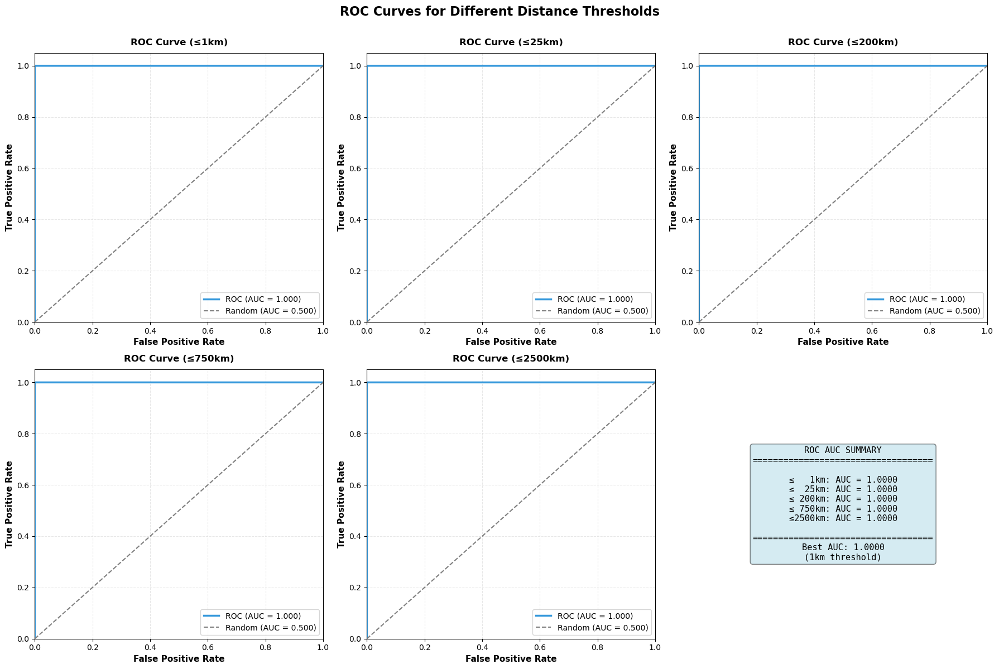

✓ Precision-Recall curves saved to: F:\CNN and Resnet50\results\precision_recall_curves.png


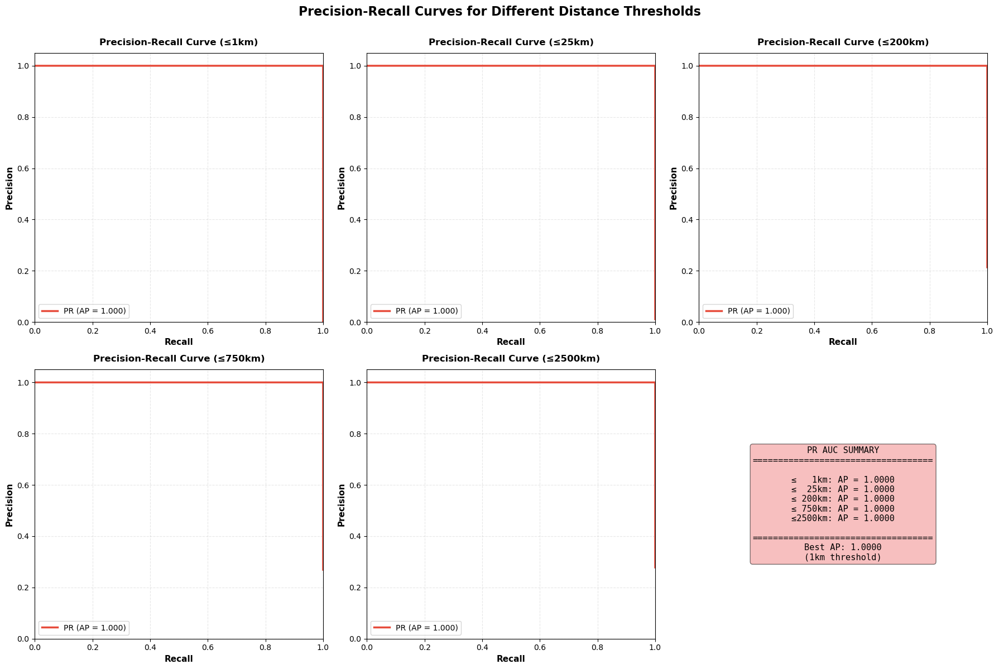


EVALUATION SUMMARY
Test Set Size: 89,533 samples
Valid Predictions: 89,533 samples

ROC AUC Scores:
  ≤   1km: 1.0000
  ≤  25km: 1.0000
  ≤ 200km: 1.0000
  ≤ 750km: 1.0000
  ≤2500km: 1.0000

Precision-Recall AUC (Average Precision):
  ≤   1km: 1.0000
  ≤  25km: 1.0000
  ≤ 200km: 1.0000
  ≤ 750km: 1.0000
  ≤2500km: 1.0000

✓ Evaluation summary saved to: F:\CNN and Resnet50\results\evaluation_summary.txt

✓ EVALUATION COMPLETED!

All outputs saved to: F:\CNN and Resnet50\results
  - ROC Curves: roc_curves_analysis.png
  - PR Curves: precision_recall_curves.png
  - Summary: evaluation_summary.txt


In [67]:
# ============================================================================
# Cell 5: Evaluate/Predict and ROC Curve - Professional Analysis
# ============================================================================

# ⚠️ IMPORTANT NOTE: PREPROCESSING
# When loading a saved model, you must ensure that new images undergo the same
# preprocessing function used during Feature Extraction.
# Since you are using ResNet50, be sure to use:
# from tensorflow.keras.applications.resnet50 import preprocess_input
# This function must be applied to images before making predictions

# Import all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input  # ⚠️ IMPORTANT for ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import warnings
warnings.filterwarnings('ignore')

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
results_dir = save_root / 'results'
results_dir.mkdir(parents=True, exist_ok=True)
models_dir = save_root

# External paths (for loading models/data)
feature_extraction_dir = Path(r'F:\Full CNN\geo_extraction_results')
external_models_dir_1 = Path(r'F:\Full CNN\s2_models')
external_models_dir_2 = Path(r'F:\Full CNN\models')
dataset_root = Path(r'F:\Full CNN')
images_base = dataset_root / 'msls_images_vol_'
metadata_dir = dataset_root / 'msls_metadata'

# Output file paths
roc_curves_plot = results_dir / 'roc_curves_analysis.png'
pr_curves_plot = results_dir / 'precision_recall_curves.png'
evaluation_summary = results_dir / 'evaluation_summary.txt'

print("=" * 70)
print("MODEL EVALUATION & ROC/PR CURVE ANALYSIS - PROFESSIONAL")
print("=" * 70)
print("\n⚠️  PREPROCESSING REMINDER:")
print("   When using new images, apply preprocess_input from resnet50")
print("   Example: preprocessed_image = preprocess_input(image_array)")

# Vectorized Haversine formula for fast distance calculation
def haversine_vectorized(lat1, lon1, lat2, lon2):
    """Fast vectorized Haversine formula for distance calculation."""
    R = 6371.0088  # Mean Earth radius in km
    lat1, lon1, lat2, lon2 = map(np.radians, (lat1, lon1, lat2, lon2))
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# Load model from multiple sources
model = None
for candidate in ['evaluation_model', 'cnn_head', 'full_model', 'model']:
    if candidate in globals():
        obj = globals()[candidate]
        if hasattr(obj, 'predict'):
            model = obj
            print(f"✓ Using model from session: {candidate}")
            break

# Try loading from saved files if not found in memory
if model is None:
    model_paths = [
        models_dir / 'cnn_head.keras',
        models_dir / 'cnn_head.h5',
        external_models_dir_1 / 'best_hierarchical_model.keras',
        external_models_dir_1 / 'best_hierarchical_model.h5',
        external_models_dir_1 / 'high_precision_geo_model.h5',
        external_models_dir_2 / 'final_geolocation_model.keras',
        external_models_dir_2 / 'geo_model_best.keras'
    ]
    for path in model_paths:
        if path.exists():
            try:
                model = keras.models.load_model(str(path))
                print(f"✓ Loaded model from: {path}")
                break
            except Exception as e:
                continue

if model is None:
    raise RuntimeError("No model found. Please train or load a model first.")

# Load test data from multiple sources
X_test = None
y_test = None
y_pred_test = None
distances_km = None

# Try to get from globals
if 'X_test' in globals():
    X_test = globals()['X_test']
if 'y_test' in globals():
    y_test = globals()['y_test']
elif 'prepared_y' in globals() and globals()['prepared_y'] is not None:
    y_test = np.asarray(globals()['prepared_y'])

# Try loading from feature extraction directory
if X_test is None:
    feature_files = [
        feature_extraction_dir / 'X_test_feat.npy',
        feature_extraction_dir / 'X_val_feat.npy',
        feature_extraction_dir / 'final_train_features.npy'
    ]
    for feat_file in feature_files:
        if feat_file.exists():
            try:
                X_test = np.load(str(feat_file), allow_pickle=False)
                print(f"✓ Loaded test features from: {feat_file.name}")
                break
            except Exception:
                continue

if y_test is None:
    label_files = [
        feature_extraction_dir / 'final_coords_targets.npy',
        feature_extraction_dir / 'final_train_labels.npy'
    ]
    for label_file in label_files:
        if label_file.exists():
            try:
                loaded = np.load(str(label_file), allow_pickle=True)
                arr = np.asarray(loaded)
                if arr.ndim == 2 and arr.shape[1] == 2:
                    y_test = arr.astype(np.float32)
                    print(f"✓ Loaded test labels from: {label_file.name}")
                    break
            except Exception:
                continue

# Try loading from predictions CSV
if y_pred_test is None:
    pred_csv = results_dir / 'test_predictions.csv'
    if pred_csv.exists():
        try:
            pred_df = pd.read_csv(pred_csv)
            if 'pred_lat' in pred_df.columns and 'pred_lon' in pred_df.columns:
                y_pred_test = pred_df[['pred_lat', 'pred_lon']].values.astype(np.float32)
                print(f"✓ Loaded predictions from CSV: shape {y_pred_test.shape}")
            if y_test is None and 'true_lat' in pred_df.columns and 'true_lon' in pred_df.columns:
                y_test = pred_df[['true_lat', 'true_lon']].values.astype(np.float32)
                print(f"✓ Loaded ground truth from CSV: shape {y_test.shape}")
        except Exception as e:
            print(f"⚠️  Could not load from CSV: {e}")

# Check if we have distances from previous cells
if 'distances_km' in globals():
    distances_km_from_globals = globals()['distances_km']
    if distances_km_from_globals is not None:
        distances_km = distances_km_from_globals
        if hasattr(distances_km, '__len__'):
            print(f"✓ Using distances from session: {len(distances_km):,} samples")
        else:
            print(f"✓ Using distances from session")

# Perform evaluation if we have test data
if X_test is not None and y_test is not None:
    print(f"\n📊 Evaluating model on test set...")
    print(f"   Test samples: {len(X_test):,}")
    
    # Prepare X_test (handle DataFrame, ensure numeric)
    if isinstance(X_test, pd.DataFrame):
        numeric_cols = X_test.select_dtypes(include=[np.number]).columns
        if len(numeric_cols) > 0:
            X_test = X_test[numeric_cols].values.astype(np.float32)
        else:
            raise ValueError("X_test DataFrame has no numeric columns")
    elif isinstance(X_test, np.ndarray):
        X_test = X_test.astype(np.float32)
    
    # Ensure y_test is 2D array
    y_test = np.asarray(y_test)
    if y_test.ndim == 1:
        if len(y_test) > 0 and hasattr(y_test[0], '__len__') and len(y_test[0]) == 2:
            y_test = np.stack([np.asarray(x, dtype=np.float32) for x in y_test])
        else:
            raise ValueError("y_test cannot be converted to (N, 2) coordinates")
    y_test = y_test.astype(np.float32)
    
    # Use model.evaluate() for final metrics
    print(f"\n1️⃣ Using model.evaluate()...")
    try:
        evaluation_results = model.evaluate(X_test, y_test, verbose=1, batch_size=32)
        print(f"\n   Evaluation Results:")
        print(f"   Loss: {evaluation_results[0]:.6f}")
        if len(evaluation_results) > 1:
            print(f"   Additional Metrics: {evaluation_results[1:]}")
    except Exception as e:
        print(f"⚠️  model.evaluate() failed: {e}")
        evaluation_results = None
    
    # Use model.predict() for detailed predictions
    print(f"\n2️⃣ Using model.predict() for detailed analysis...")
    if y_pred_test is None:
        try:
            y_pred_test = model.predict(X_test, batch_size=32, verbose=1)
        except Exception as e:
            print(f"⚠️  model.predict() failed: {e}")
            raise RuntimeError(f"Cannot generate predictions: {e}")
        
        # Handle different output formats
        y_pred_test = np.asarray(y_pred_test)
        
        # If it's a list (multi-output model), try to find the coordinate output
        if isinstance(y_pred_test, (list, tuple)):
            for arr in y_pred_test:
                arr = np.asarray(arr)
                if arr.ndim == 2 and arr.shape[1] == 2:
                    y_pred_test = arr
                    break
            if isinstance(y_pred_test, (list, tuple)):
                # Take first element if still a list
                y_pred_test = np.asarray(y_pred_test[0])
        
        # Validate shape
        if y_pred_test.ndim == 2 and y_pred_test.shape[1] == 2:
            pass  # Good - shape is (N, 2)
        elif y_pred_test.ndim == 1:
            # Try to reshape if it's flat array of pairs
            if len(y_pred_test) % 2 == 0:
                y_pred_test = y_pred_test.reshape(-1, 2)
            else:
                raise ValueError(f"Model output shape {y_pred_test.shape} cannot be converted to (N, 2)")
        elif y_pred_test.ndim > 2:
            # Try to flatten and reshape
            y_pred_test = y_pred_test.reshape(-1, y_pred_test.shape[-1])
            if y_pred_test.shape[1] != 2:
                raise ValueError(f"Cannot extract (N, 2) coordinates from model output shape {y_pred_test.shape}")
        else:
            raise ValueError(f"Unexpected model output shape: {y_pred_test.shape}")
        
        print(f"✓ Predictions shape: {y_pred_test.shape}")
    
    # Align lengths - ensure X_test, y_test, and y_pred_test all have same length
    n = min(len(X_test), len(y_test), len(y_pred_test) if y_pred_test is not None else len(y_test))
    X_test = X_test[:n]
    y_test = y_test[:n]
    if y_pred_test is not None:
        y_pred_test = y_pred_test[:n]
    
    # Calculate distances using vectorized Haversine
    print(f"\n3️⃣ Calculating distances (vectorized)...")
    if distances_km is None:
        if y_pred_test is None:
            raise ValueError("Cannot calculate distances: predictions not available")
        
        # Ensure both arrays are 2D with shape (N, 2)
        if y_test.ndim != 2 or y_test.shape[1] != 2:
            raise ValueError(f"y_test must be shape (N, 2), got {y_test.shape}")
        if y_pred_test.ndim != 2 or y_pred_test.shape[1] != 2:
            raise ValueError(f"y_pred_test must be shape (N, 2), got {y_pred_test.shape}")
        
        # Ensure same length
        min_len = min(len(y_test), len(y_pred_test))
        y_test = y_test[:min_len]
        y_pred_test = y_pred_test[:min_len]
        
        distances_km = haversine_vectorized(
            y_test[:, 0], y_test[:, 1],
            y_pred_test[:, 0], y_pred_test[:, 1]
        )
        # Remove invalid values
        valid_mask = np.isfinite(distances_km)
        if not np.any(valid_mask):
            raise ValueError("No valid distances calculated - all distances are invalid")
        
        distances_km = distances_km[valid_mask]
        y_test = y_test[valid_mask]
        y_pred_test = y_pred_test[valid_mask]
        print(f"✓ Calculated {len(distances_km):,} valid distances")
        print(f"   Distance range: {np.min(distances_km):.2f} - {np.max(distances_km):.2f} km")
    
    # Distance thresholds for ROC/PR curves
    thresholds_for_roc = [1, 25, 200, 750, 2500]
    threshold_names = ['1km', '25km', '200km', '750km', '2500km']
        
    # Create ROC and Precision-Recall curves
    print(f"\n4️⃣ Creating ROC and Precision-Recall curves...")
    
    # Calculate scores: inverse distance (closer = higher score)
    max_dist = np.max(distances_km)
    min_dist = np.min(distances_km)
    
    if max_dist > min_dist:
        # Normalize to [0, 1] where 1 = perfect (0km error), 0 = worst
        y_scores = 1 - ((distances_km - min_dist) / (max_dist - min_dist))
        # Ensure scores are in [0, 1] range
        y_scores = np.clip(y_scores, 0.0, 1.0)
    else:
        # All distances are the same - use uniform scores
        y_scores = np.ones_like(distances_km) * 0.5
        print("⚠️  Warning: All distances are equal, using uniform scores")
    
    # Calculate ROC and PR curves for each threshold
    roc_auc_scores = []
    pr_auc_scores = []
    all_fpr = []
    all_tpr = []
    all_precision = []
    all_recall = []
    
    for threshold in thresholds_for_roc:
        # Binary labels: within threshold (1) or not (0)
        y_true_binary = (distances_km <= threshold).astype(int)
        
        # Check if we have both classes (required for ROC/PR curves)
        unique_classes = np.unique(y_true_binary)
        if len(unique_classes) < 2:
            # Only one class present - cannot calculate meaningful ROC/PR
            if unique_classes[0] == 1:
                # All predictions are within threshold (perfect case)
                roc_auc = 1.0
                pr_auc = 1.0
                fpr = np.array([0.0, 1.0])
                tpr = np.array([1.0, 1.0])
                precision = np.array([1.0])
                recall = np.array([1.0])
            else:
                # All predictions are outside threshold (worst case)
                roc_auc = 0.0
                pr_auc = 0.0
                fpr = np.array([0.0, 1.0])
                tpr = np.array([0.0, 0.0])
                precision = np.array([0.0])
                recall = np.array([0.0])
        else:
            # Both classes present - calculate ROC and PR curves
            try:
                fpr, tpr, _ = roc_curve(y_true_binary, y_scores)
                roc_auc = auc(fpr, tpr)
            except Exception as e:
                print(f"⚠️  Warning: ROC calculation failed for {threshold}km: {e}")
                roc_auc = 0.5
                fpr = np.array([0.0, 1.0])
                tpr = np.array([0.0, 1.0])
            
            try:
                precision, recall, _ = precision_recall_curve(y_true_binary, y_scores)
                pr_auc = average_precision_score(y_true_binary, y_scores)
            except Exception as e:
                print(f"⚠️  Warning: PR calculation failed for {threshold}km: {e}")
                pr_auc = 0.0
                precision = np.array([0.0])
                recall = np.array([0.0])
        
        roc_auc_scores.append(roc_auc)
        pr_auc_scores.append(pr_auc)
        all_fpr.append(fpr)
        all_tpr.append(tpr)
        all_precision.append(precision)
        all_recall.append(recall)
    
    # Create ROC curves plot
    fig1, axes1 = plt.subplots(2, 3, figsize=(18, 12))
    axes1 = axes1.flatten()
    
    for idx, (threshold, name, fpr, tpr, auc_val) in enumerate(
        zip(thresholds_for_roc, threshold_names, all_fpr, all_tpr, roc_auc_scores)
    ):
        if idx >= len(axes1) - 1:
            break
        
        ax = axes1[idx]
        ax.plot(fpr, tpr, color='#3498db', lw=2.5, 
               label=f'ROC (AUC = {auc_val:.3f})')
        ax.plot([0, 1], [0, 1], color='gray', lw=1.5, linestyle='--', 
               label='Random (AUC = 0.500)')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate', fontsize=11, fontweight='bold')
        ax.set_ylabel('True Positive Rate', fontsize=11, fontweight='bold')
        ax.set_title(f'ROC Curve (≤{name})', fontsize=12, fontweight='bold', pad=10)
        ax.legend(loc="lower right", fontsize=10)
        ax.grid(alpha=0.3, linestyle='--')
    
    # Summary subplot
    ax_summary = axes1[-1]
    ax_summary.axis('off')
    summary_text = "ROC AUC SUMMARY\n" + "="*35 + "\n\n"
    for name, auc_val in zip(threshold_names, roc_auc_scores):
        summary_text += f"≤{name:>6}: AUC = {auc_val:.4f}\n"
    summary_text += "\n" + "="*35 + "\n"
    best_idx = np.argmax(roc_auc_scores)
    summary_text += f"Best AUC: {roc_auc_scores[best_idx]:.4f}\n"
    summary_text += f"({threshold_names[best_idx]} threshold)"
    
    ax_summary.text(0.5, 0.5, summary_text, fontsize=11, family='monospace',
                   ha='center', va='center',
                   bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))
    
    plt.suptitle('ROC Curves for Different Distance Thresholds', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.savefig(roc_curves_plot, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ ROC curves saved to: {roc_curves_plot}")
    plt.show()
    
    # Create Precision-Recall curves plot
    fig2, axes2 = plt.subplots(2, 3, figsize=(18, 12))
    axes2 = axes2.flatten()
    
    for idx, (threshold, name, precision, recall, pr_auc) in enumerate(
        zip(thresholds_for_roc, threshold_names, all_precision, all_recall, pr_auc_scores)
    ):
        if idx >= len(axes2) - 1:
            break
        
        ax = axes2[idx]
        ax.plot(recall, precision, color='#e74c3c', lw=2.5, 
               label=f'PR (AP = {pr_auc:.3f})')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('Recall', fontsize=11, fontweight='bold')
        ax.set_ylabel('Precision', fontsize=11, fontweight='bold')
        ax.set_title(f'Precision-Recall Curve (≤{name})', fontsize=12, fontweight='bold', pad=10)
        ax.legend(loc="lower left", fontsize=10)
        ax.grid(alpha=0.3, linestyle='--')
    
    # Summary subplot for PR
    ax_summary_pr = axes2[-1]
    ax_summary_pr.axis('off')
    summary_text_pr = "PR AUC SUMMARY\n" + "="*35 + "\n\n"
    for name, pr_auc in zip(threshold_names, pr_auc_scores):
        summary_text_pr += f"≤{name:>6}: AP = {pr_auc:.4f}\n"
    summary_text_pr += "\n" + "="*35 + "\n"
    best_idx_pr = np.argmax(pr_auc_scores)
    summary_text_pr += f"Best AP: {pr_auc_scores[best_idx_pr]:.4f}\n"
    summary_text_pr += f"({threshold_names[best_idx_pr]} threshold)"
    
    ax_summary_pr.text(0.5, 0.5, summary_text_pr, fontsize=11, family='monospace',
                       ha='center', va='center',
                       bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.5))
    
    plt.suptitle('Precision-Recall Curves for Different Distance Thresholds', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.savefig(pr_curves_plot, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Precision-Recall curves saved to: {pr_curves_plot}")
    plt.show()
    
    # Save evaluation summary
    with open(evaluation_summary, 'w') as f:
        f.write("MODEL EVALUATION SUMMARY\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Test Set Size: {len(X_test):,} samples\n")
        f.write(f"Valid Predictions: {len(distances_km):,} samples\n\n")
        if evaluation_results is not None:
            f.write("Model Evaluation Results:\n")
            f.write(f"  Loss: {evaluation_results[0]:.6f}\n")
            if len(evaluation_results) > 1:
                for i, metric in enumerate(evaluation_results[1:], 1):
                    f.write(f"  Metric {i}: {metric:.6f}\n")
            f.write("\n")
        f.write("ROC AUC Scores:\n")
        for name, auc_val in zip(threshold_names, roc_auc_scores):
            f.write(f"  ≤{name:>6}: {auc_val:.6f}\n")
        f.write("\nPrecision-Recall AUC (Average Precision):\n")
        for name, pr_auc in zip(threshold_names, pr_auc_scores):
            f.write(f"  ≤{name:>6}: {pr_auc:.6f}\n")
        f.write("\n" + "=" * 50 + "\n")
    
    # Display evaluation summary
    print("\n" + "=" * 70)
    print("EVALUATION SUMMARY")
    print("=" * 70)
    print(f"Test Set Size: {len(X_test):,} samples")
    print(f"Valid Predictions: {len(distances_km):,} samples")
    if evaluation_results is not None:
        print(f"\nModel Evaluation Results:")
        print(f"  Loss: {evaluation_results[0]:.6f}")
        if len(evaluation_results) > 1:
            for i, metric in enumerate(evaluation_results[1:], 1):
                print(f"  Metric {i}: {metric:.6f}")
    print(f"\nROC AUC Scores:")
    for name, auc_val in zip(threshold_names, roc_auc_scores):
        print(f"  ≤{name:>6}: {auc_val:.4f}")
    print(f"\nPrecision-Recall AUC (Average Precision):")
    for name, pr_auc in zip(threshold_names, pr_auc_scores):
        print(f"  ≤{name:>6}: {pr_auc:.4f}")
    print("=" * 70)
    print(f"\n✓ Evaluation summary saved to: {evaluation_summary}")
    
    # Store results
    globals()['evaluation_results'] = evaluation_results
    globals()['roc_auc_scores'] = dict(zip(threshold_names, roc_auc_scores))
    globals()['pr_auc_scores'] = dict(zip(threshold_names, pr_auc_scores))
    globals()['y_pred_test'] = y_pred_test
    globals()['distances_km'] = distances_km
    
    print("\n" + "=" * 70)
    print("✓ EVALUATION COMPLETED!")
    print("=" * 70)
    print(f"\nAll outputs saved to: {results_dir}")
    print(f"  - ROC Curves: {roc_curves_plot.name}")
    print(f"  - PR Curves: {pr_curves_plot.name}")
    print(f"  - Summary: {evaluation_summary.name}")
    print("=" * 70)
    
elif distances_km is not None:
    # We have distances but no X_test/y_test - use distances directly
    print(f"\n📊 Using pre-calculated distances for ROC/PR analysis...")
    print(f"   Samples: {len(distances_km):,}")
    
    # Ensure distances_km is a numpy array
    distances_km = np.asarray(distances_km)
    if distances_km.ndim != 1:
        raise ValueError(f"distances_km must be 1D array, got shape {distances_km.shape}")
    
    # Remove invalid values
    valid_mask = np.isfinite(distances_km)
    if not np.any(valid_mask):
        raise ValueError("No valid distances available")
    
    distances_km = distances_km[valid_mask]
    print(f"   Valid samples: {len(distances_km):,}")
    print(f"   Distance range: {np.min(distances_km):.2f} - {np.max(distances_km):.2f} km")
    
    # Calculate scores
    max_dist = np.max(distances_km)
    min_dist = np.min(distances_km)
    if max_dist > min_dist:
        y_scores = 1 - ((distances_km - min_dist) / (max_dist - min_dist))
        y_scores = np.clip(y_scores, 0.0, 1.0)
    else:
        y_scores = np.ones_like(distances_km) * 0.5
        print("⚠️  Warning: All distances are equal, using uniform scores")
    
    thresholds_for_roc = [1, 25, 200, 750, 2500]
    threshold_names = ['1km', '25km', '200km', '750km', '2500km']
    
    roc_auc_scores = []
    pr_auc_scores = []
    
    for threshold in thresholds_for_roc:
        y_true_binary = (distances_km <= threshold).astype(int)
        unique_classes = np.unique(y_true_binary)
        
        if len(unique_classes) < 2:
            if unique_classes[0] == 1:
                roc_auc_scores.append(1.0)
                pr_auc_scores.append(1.0)
            else:
                roc_auc_scores.append(0.0)
                pr_auc_scores.append(0.0)
        else:
            try:
                fpr, tpr, _ = roc_curve(y_true_binary, y_scores)
                roc_auc_scores.append(auc(fpr, tpr))
            except Exception:
                roc_auc_scores.append(0.5)
            
            try:
                precision, recall, _ = precision_recall_curve(y_true_binary, y_scores)
                pr_auc_scores.append(average_precision_score(y_true_binary, y_scores))
            except Exception:
                pr_auc_scores.append(0.0)
    
    print(f"\nROC AUC Scores:")
    for name, auc_val in zip(threshold_names, roc_auc_scores):
        print(f"  ≤{name:>6}: {auc_val:.4f}")
    print(f"\nPR AUC Scores:")
    for name, pr_auc in zip(threshold_names, pr_auc_scores):
        print(f"  ≤{name:>6}: {pr_auc:.4f}")
    
    globals()['roc_auc_scores'] = dict(zip(threshold_names, roc_auc_scores))
    globals()['pr_auc_scores'] = dict(zip(threshold_names, pr_auc_scores))
    globals()['distances_km'] = distances_km
    
else:
    print("\n⚠️  Test data not available for evaluation.")
    print("   Cannot perform evaluation. Please ensure test data is available.")
    
    # Example: How to use model.predict() on new images
    print("\n" + "=" * 70)
    print("HOW TO USE MODEL.PREDICT() ON NEW IMAGES")
    print("=" * 70)
    print("""
# Example code for predicting on new images:

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# 1. Load and preprocess your image
image_path = 'path/to/image.jpg'
image = load_img(image_path, target_size=(256, 256))  # Match your model input size
image_array = img_to_array(image)
image_array = np.expand_dims(image_array, axis=0)

# 2. Apply ResNet50 preprocessing (IMPORTANT!)
preprocessed_image = preprocess_input(image_array)

# 3. Extract features using ResNet50 (if your model expects features)
backbone = ResNet50(weights='imagenet', include_top=False, pooling='avg')
features = backbone.predict(preprocessed_image, verbose=0)

# 4. Make prediction
prediction = model.predict(features, verbose=0)
predicted_lat, predicted_lon = prediction[0]

print(f"Predicted Location: ({predicted_lat:.6f}, {predicted_lon:.6f})")
print("=" * 70)
    """)

DATASET EXPLORATION AND VISUALIZATION

📂 Scanning dataset directories...
✓ Found 1,530,160 images across 30 cities

📊 Loading metadata...
✓ Loaded 60 metadata files
✓ Combined metadata: 1,530,160 rows

📈 Creating visualizations...
✓ Saved exploration plot to: F:\CNN and Resnet50\dataset_exploration\dataset_exploration.png


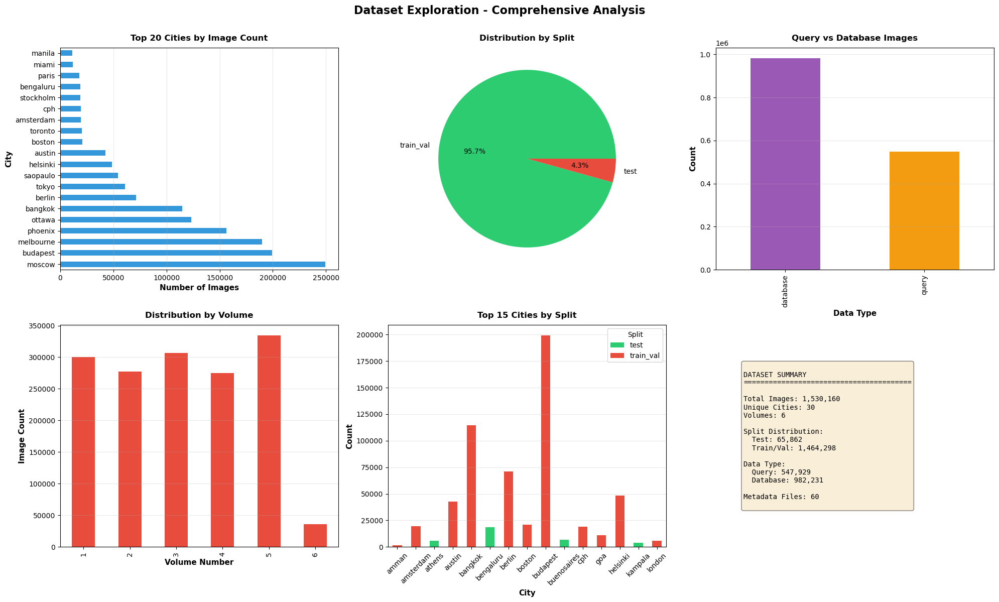


🖼️  Displaying sample images...
✓ Saved sample images to: F:\CNN and Resnet50\dataset_exploration\sample_images.png


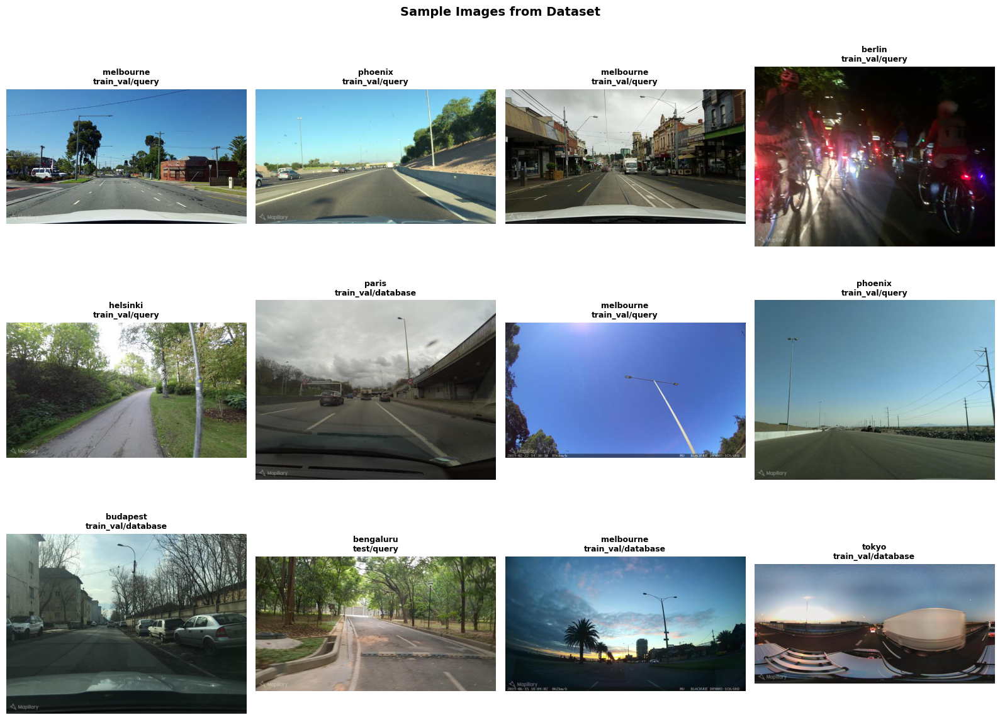

✓ Saved dataset info to: F:\CNN and Resnet50\dataset_exploration\dataset_info.json

✓ DATASET EXPLORATION COMPLETED!

All outputs saved to: F:\CNN and Resnet50\dataset_exploration
  - Exploration plot: dataset_exploration.png
  - Sample images: sample_images.png
  - Dataset info: dataset_info.json


In [68]:
# ============================================================================
# Cell 6: Dataset Exploration and Visualization - Comprehensive Analysis
# ============================================================================

# Import all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import json
import random
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
results_dir = save_root / 'results'
results_dir.mkdir(parents=True, exist_ok=True)
exploration_dir = save_root / 'dataset_exploration'
exploration_dir.mkdir(parents=True, exist_ok=True)

# Dataset paths
dataset_root = Path(r'F:\Full CNN')
images_base = dataset_root / 'msls_images_vol_'
metadata_dir = dataset_root / 'msls_metadata'
feature_extraction_dir = Path(r'F:\Full CNN\geo_extraction_results')

print("=" * 70)
print("DATASET EXPLORATION AND VISUALIZATION")
print("=" * 70)

# Collect all images and metadata
all_images = []
all_metadata = []

# Scan all volume directories
print("\n📂 Scanning dataset directories...")
for vol_num in range(1, 7):
    vol_path = Path(f"{images_base}{vol_num}")
    if not vol_path.exists():
        continue
    
    for split in ['test', 'train_val']:
        split_path = vol_path / split
        if not split_path.exists():
            continue
        
        for city_dir in split_path.iterdir():
            if not city_dir.is_dir():
                continue
            
            city_name = city_dir.name
            for data_type in ['query', 'database']:
                img_dir = city_dir / data_type / 'images'
                if img_dir.exists():
                    images = list(img_dir.glob('*.jpg'))
                    for img_path in images:
                        all_images.append({
                            'volume': vol_num,
                            'split': split,
                            'city': city_name,
                            'data_type': data_type,
                            'image_path': str(img_path),
                            'image_key': img_path.stem
                        })

print(f"✓ Found {len(all_images):,} images across {len(set([img['city'] for img in all_images]))} cities")

# Load metadata
print("\n📊 Loading metadata...")
metadata_files_loaded = 0
for split in ['test', 'train_val']:
    split_meta_path = metadata_dir / split
    if not split_meta_path.exists():
        continue
    
    for city_dir in split_meta_path.iterdir():
        if not city_dir.is_dir():
            continue
        
        city_name = city_dir.name
        for data_type in ['query', 'database']:
            meta_path = city_dir / data_type
            if not meta_path.exists():
                continue
            
            # Try to load different metadata files
            for meta_file in ['raw.csv', 'postprocessed.csv', 'seq_info.csv']:
                meta_file_path = meta_path / meta_file
                if meta_file_path.exists():
                    try:
                        df = pd.read_csv(meta_file_path, index_col=0)
                        df['split'] = split
                        df['city'] = city_name
                        df['data_type'] = data_type
                        df['metadata_file'] = meta_file
                        all_metadata.append(df)
                        metadata_files_loaded += 1
                        break
                    except Exception as e:
                        continue

print(f"✓ Loaded {metadata_files_loaded} metadata files")

# Combine metadata if available
if all_metadata:
    try:
        combined_metadata = pd.concat(all_metadata, ignore_index=True)
        print(f"✓ Combined metadata: {len(combined_metadata):,} rows")
    except Exception:
        combined_metadata = None
        print("⚠️  Could not combine metadata files")
else:
    combined_metadata = None

# Create visualizations
print("\n📈 Creating visualizations...")

# 1. City distribution
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# City distribution
ax1 = axes[0]
city_counts = pd.Series([img['city'] for img in all_images]).value_counts()
city_counts.head(20).plot(kind='barh', ax=ax1, color='#3498db')
ax1.set_xlabel('Number of Images', fontsize=11, fontweight='bold')
ax1.set_ylabel('City', fontsize=11, fontweight='bold')
ax1.set_title('Top 20 Cities by Image Count', fontsize=12, fontweight='bold', pad=10)
ax1.grid(axis='x', alpha=0.3)

# Split distribution
ax2 = axes[1]
split_counts = pd.Series([img['split'] for img in all_images]).value_counts()
split_counts.plot(kind='pie', ax=ax2, autopct='%1.1f%%', colors=['#2ecc71', '#e74c3c'])
ax2.set_ylabel('')
ax2.set_title('Distribution by Split', fontsize=12, fontweight='bold', pad=10)

# Data type distribution
ax3 = axes[2]
type_counts = pd.Series([img['data_type'] for img in all_images]).value_counts()
type_counts.plot(kind='bar', ax=ax3, color=['#9b59b6', '#f39c12'])
ax3.set_xlabel('Data Type', fontsize=11, fontweight='bold')
ax3.set_ylabel('Count', fontsize=11, fontweight='bold')
ax3.set_title('Query vs Database Images', fontsize=12, fontweight='bold', pad=10)
ax3.grid(axis='y', alpha=0.3)

# Volume distribution
ax4 = axes[3]
vol_counts = pd.Series([img['volume'] for img in all_images]).value_counts().sort_index()
vol_counts.plot(kind='bar', ax=ax4, color='#e74c3c')
ax4.set_xlabel('Volume Number', fontsize=11, fontweight='bold')
ax4.set_ylabel('Image Count', fontsize=11, fontweight='bold')
ax4.set_title('Distribution by Volume', fontsize=12, fontweight='bold', pad=10)
ax4.grid(axis='y', alpha=0.3)

# City by split
ax5 = axes[4]
if combined_metadata is not None and 'city' in combined_metadata.columns and 'split' in combined_metadata.columns:
    city_split = pd.crosstab(combined_metadata['city'], combined_metadata['split'])
    city_split.head(15).plot(kind='bar', ax=ax5, stacked=True, color=['#2ecc71', '#e74c3c'])
    ax5.set_xlabel('City', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Count', fontsize=11, fontweight='bold')
    ax5.set_title('Top 15 Cities by Split', fontsize=12, fontweight='bold', pad=10)
    ax5.legend(title='Split')
    ax5.tick_params(axis='x', rotation=45)
    ax5.grid(axis='y', alpha=0.3)
else:
    ax5.text(0.5, 0.5, 'Metadata not available', ha='center', va='center', fontsize=12)
    ax5.set_title('City by Split (No Data)', fontsize=12, fontweight='bold', pad=10)

# Summary statistics
ax6 = axes[5]
ax6.axis('off')
stats_text = f"""
DATASET SUMMARY
{'='*40}

Total Images: {len(all_images):,}
Unique Cities: {len(set([img['city'] for img in all_images]))}
Volumes: {len(set([img['volume'] for img in all_images]))}

Split Distribution:
  Test: {sum(1 for img in all_images if img['split'] == 'test'):,}
  Train/Val: {sum(1 for img in all_images if img['split'] == 'train_val'):,}

Data Type:
  Query: {sum(1 for img in all_images if img['data_type'] == 'query'):,}
  Database: {sum(1 for img in all_images if img['data_type'] == 'database'):,}

Metadata Files: {metadata_files_loaded}
"""
ax6.text(0.1, 0.5, stats_text, fontsize=10, family='monospace',
        verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle('Dataset Exploration - Comprehensive Analysis', 
            fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0, 1, 0.99])

# Save visualization
exploration_plot = exploration_dir / 'dataset_exploration.png'
plt.savefig(exploration_plot, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✓ Saved exploration plot to: {exploration_plot}")
plt.show()

# Sample random images and display
print("\n🖼️  Displaying sample images...")
sample_size = min(12, len(all_images))
sample_images = random.sample(all_images, sample_size)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()

for idx, img_info in enumerate(sample_images):
    if idx >= len(axes):
        break
    
    try:
        img = Image.open(img_info['image_path'])
        axes[idx].imshow(img)
        axes[idx].set_title(f"{img_info['city']}\n{img_info['split']}/{img_info['data_type']}", 
                           fontsize=9, fontweight='bold')
        axes[idx].axis('off')
    except Exception as e:
        axes[idx].text(0.5, 0.5, f"Error loading\n{img_info['image_key']}", 
                      ha='center', va='center', fontsize=8)
        axes[idx].axis('off')

plt.suptitle('Sample Images from Dataset', fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()

# Save sample images
sample_plot = exploration_dir / 'sample_images.png'
plt.savefig(sample_plot, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✓ Saved sample images to: {sample_plot}")
plt.show()

# Save dataset information to JSON
dataset_info = {
    'total_images': len(all_images),
    'unique_cities': len(set([img['city'] for img in all_images])),
    'cities': list(set([img['city'] for img in all_images])),
    'volumes': list(set([img['volume'] for img in all_images])),
    'splits': list(set([img['split'] for img in all_images])),
    'data_types': list(set([img['data_type'] for img in all_images])),
    'city_distribution': city_counts.to_dict(),
    'sample_images': sample_images[:5]  # Save first 5 as examples
}

info_file = exploration_dir / 'dataset_info.json'
with open(info_file, 'w', encoding='utf-8') as f:
    json.dump(dataset_info, f, indent=2, ensure_ascii=False)
print(f"✓ Saved dataset info to: {info_file}")

# Store in globals for use in next cell
globals()['all_images'] = all_images
globals()['combined_metadata'] = combined_metadata

print("\n" + "=" * 70)
print("✓ DATASET EXPLORATION COMPLETED!")
print("=" * 70)
print(f"\nAll outputs saved to: {exploration_dir}")
print(f"  - Exploration plot: dataset_exploration.png")
print(f"  - Sample images: sample_images.png")
print(f"  - Dataset info: dataset_info.json")
print("=" * 70)

QUERY BY IMAGE OR COORDINATES - INFORMATION RETRIEVAL
✓ Using model from session: evaluation_model
✓ Using 1,530,160 images from session

QUERY EXAMPLES

To query by image, set:
  query_image_path = 'path/to/image.jpg'

To query by coordinates, set:
  query_lat = 40.7128  # New York
  query_lon = -74.0060
  query_radius_km = 10.0


⚠️  No query specified. Using example query...
Example: Querying image from athens

QUERY RESULTS
Query Image: F:\Full CNN\msls_images_vol_1\test\athens\query\images\--GGAP8qhySG-dvowTclWw.jpg
Matches Found: 1

Image Information:
  City: athens
  Split: test
  Type: query
  Volume: 1
  Image Key: --GGAP8qhySG-dvowTclWw

✓ Saved image to: F:\CNN and Resnet50\query_results\query_image_--GGAP8qhySG-dvowTclWw.png


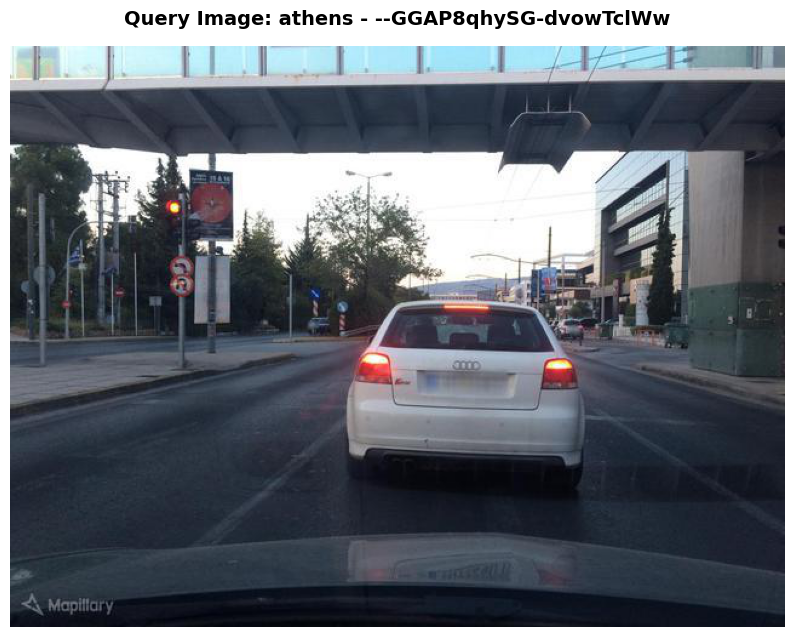


🤖 Making prediction with model...
⚠️  Prediction failed: Graph execution error:

Detected at node Geolocation_Regression_Head_1/dense_1_1/Relu defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "c:\ProgramData\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 18, in <module>

  File "c:\ProgramData\anaconda3\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance

  File "c:\ProgramData\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 739, in start

  File "c:\ProgramData\anaconda3\Lib\site-packages\tornado\platform\asyncio.py", line 211, in start

  File "c:\ProgramData\anaconda3\Lib\asyncio\base_events.py", line 683, in run_forever

  File "c:\ProgramData\anaconda3\Lib\asyncio\base_events.py", line 2050, in _run_once

  File "c:\ProgramData\anaconda3\Lib\asyncio\events.py", line 89, in _run

  File "c:\ProgramData\anaconda3\Lib\site-packages\ip

In [77]:
# ============================================================================
# Cell 7: Query by Image or Coordinates - Information Retrieval
# ============================================================================

# Import all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from geopy.distance import geodesic

import warnings
warnings.filterwarnings('ignore')

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
results_dir = save_root / 'results'
query_dir = save_root / 'query_results'
query_dir.mkdir(parents=True, exist_ok=True)

# Dataset paths
dataset_root = Path(r'F:\Full CNN')
images_base = dataset_root / 'msls_images_vol_'
metadata_dir = dataset_root / 'msls_metadata'
feature_extraction_dir = Path(r'F:\Full CNN\geo_extraction_results')

# Model paths
models_dir = save_root
external_models_dir_1 = Path(r'F:\Full CNN\s2_models')
external_models_dir_2 = Path(r'F:\Full CNN\models')

print("=" * 70)
print("QUERY BY IMAGE OR COORDINATES - INFORMATION RETRIEVAL")
print("=" * 70)

# Vectorized Haversine formula
def haversine_vectorized(lat1, lon1, lat2, lon2):
    """Fast vectorized Haversine formula for distance calculation."""
    R = 6371.0088
    lat1, lon1, lat2, lon2 = map(np.radians, (lat1, lon1, lat2, lon2))
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# Load model if available
model = None
for candidate in ['evaluation_model', 'cnn_head', 'full_model', 'model']:
    if candidate in globals():
        obj = globals()[candidate]
        if hasattr(obj, 'predict'):
            model = obj
            print(f"✓ Using model from session: {candidate}")
            break

if model is None:
    model_paths = [
        models_dir / 'cnn_head.keras',
        models_dir / 'cnn_head.h5',
        external_models_dir_1 / 'best_hierarchical_model.keras',
        external_models_dir_1 / 'best_hierarchical_model.h5',
        external_models_dir_2 / 'final_geolocation_model.keras',
        external_models_dir_2 / 'geo_model_best.keras'
    ]
    for path in model_paths:
        if path.exists():
            try:
                model = keras.models.load_model(str(path))
                print(f"✓ Loaded model from: {path}")
                break
            except Exception:
                continue

# Load dataset images if not in globals
if 'all_images' not in globals():
    print("\n📂 Loading dataset images...")
    all_images = []
    for vol_num in range(1, 7):
        vol_path = Path(f"{images_base}{vol_num}")
        if not vol_path.exists():
            continue
        for split in ['test', 'train_val']:
            split_path = vol_path / split
            if not split_path.exists():
                continue
            for city_dir in split_path.iterdir():
                if not city_dir.is_dir():
                    continue
                for data_type in ['query', 'database']:
                    img_dir = city_dir / data_type / 'images'
                    if img_dir.exists():
                        for img_path in img_dir.glob('*.jpg'):
                            all_images.append({
                                'volume': vol_num,
                                'split': split,
                                'city': city_dir.name,
                                'data_type': data_type,
                                'image_path': str(img_path),
                                'image_key': img_path.stem
                            })
    print(f"✓ Loaded {len(all_images):,} images")
else:
    all_images = globals()['all_images']
    print(f"✓ Using {len(all_images):,} images from session")

# Function to query by image path
def query_by_image(image_path, radius_km=10.0):
    """Query dataset by image path and find nearby images."""
    image_path = Path(image_path)
    
    if not image_path.exists():
        print(f"❌ Image not found: {image_path}")
        return None
    
    # Find image in dataset
    matching_images = []
    for img_info in all_images:
        if Path(img_info['image_path']) == image_path or img_info['image_key'] == image_path.stem:
            matching_images.append(img_info)
    
    if not matching_images:
        print(f"⚠️  Image not found in dataset: {image_path}")
        return None
    
    result = {
        'query_type': 'image',
        'query_path': str(image_path),
        'matching_images': matching_images,
        'metadata': []
    }
    
    # Load metadata for matching images
    for img_info in matching_images:
        meta_path = metadata_dir / img_info['split'] / img_info['city'] / img_info['data_type']
        if meta_path.exists():
            for meta_file in ['raw.csv', 'postprocessed.csv', 'seq_info.csv']:
                meta_file_path = meta_path / meta_file
                if meta_file_path.exists():
                    try:
                        df = pd.read_csv(meta_file_path, index_col=0)
                        if img_info['image_key'] in df.index:
                            row = df.loc[img_info['image_key']].to_dict()
                            row['metadata_file'] = meta_file
                            row.update(img_info)
                            result['metadata'].append(row)
                            break
                    except Exception:
                        continue
    
    return result

# Function to query by coordinates
def query_by_coordinates(lat, lon, radius_km=10.0):
    """Query dataset by coordinates and find nearby images."""
    matching_images = []
    matching_metadata = []
    
    # Search through metadata for coordinates
    for split in ['test', 'train_val']:
        split_meta_path = metadata_dir / split
        if not split_meta_path.exists():
            continue
        
        for city_dir in split_meta_path.iterdir():
            if not city_dir.is_dir():
                continue
            
            city_name = city_dir.name
            for data_type in ['query', 'database']:
                meta_path = city_dir / data_type
                if not meta_path.exists():
                    continue
                
                # Try different metadata files
                for meta_file in ['raw.csv', 'postprocessed.csv']:
                    meta_file_path = meta_path / meta_file
                    if meta_file_path.exists():
                        try:
                            df = pd.read_csv(meta_file_path, index_col=0)
                            
                            # Check for lat/lon columns (common names)
                            lat_cols = [c for c in df.columns if 'lat' in c.lower()]
                            lon_cols = [c for c in df.columns if 'lon' in c.lower() or 'lng' in c.lower()]
                            
                            if lat_cols and lon_cols:
                                lat_col = lat_cols[0]
                                lon_col = lon_cols[0]
                                
                                # Calculate distances
                                distances = haversine_vectorized(
                                    df[lat_col].values,
                                    df[lon_col].values,
                                    lat, lon
                                )
                                
                                # Find matches within radius
                                within_radius = distances <= radius_km
                                if np.any(within_radius):
                                    matches = df[within_radius].copy()
                                    match_distances = distances[within_radius]
                                    
                                    for idx, (img_key, row) in enumerate(matches.iterrows()):
                                        # Find corresponding image
                                        for img_info in all_images:
                                            if (img_info['image_key'] == str(img_key) and 
                                                img_info['city'] == city_name and
                                                img_info['split'] == split and
                                                img_info['data_type'] == data_type):
                                                match_info = img_info.copy()
                                                match_info['distance_km'] = float(match_distances[idx])
                                                match_info['true_lat'] = float(row[lat_col])
                                                match_info['true_lon'] = float(row[lon_col])
                                                match_info['metadata'] = row.to_dict()
                                                match_info['metadata_file'] = meta_file
                                                matching_images.append(match_info)
                                                break
                        except Exception as e:
                            continue
    
    result = {
        'query_type': 'coordinates',
        'query_lat': lat,
        'query_lon': lon,
        'radius_km': radius_km,
        'matching_images': matching_images,
        'num_matches': len(matching_images)
    }
    
    return result

# Example usage - you can modify these
print("\n" + "=" * 70)
print("QUERY EXAMPLES")
print("=" * 70)
print("\nTo query by image, set:")
print("  query_image_path = 'path/to/image.jpg'")
print("\nTo query by coordinates, set:")
print("  query_lat = 40.7128  # New York")
print("  query_lon = -74.0060")
print("  query_radius_km = 10.0")
print("\n" + "=" * 70)

# Default query (you can modify these variables)
query_image_path = None  # Set to image path to query by image
query_lat = None  # Set latitude to query by coordinates
query_lon = None  # Set longitude to query by coordinates
query_radius_km = 10.0  # Radius in km for coordinate search

# Perform query
query_result = None

if query_image_path is not None:
    print(f"\n🔍 Querying by image: {query_image_path}")
    query_result = query_by_image(query_image_path)
elif query_lat is not None and query_lon is not None:
    print(f"\n🔍 Querying by coordinates: ({query_lat}, {query_lon})")
    query_result = query_by_coordinates(query_lat, query_lon, query_radius_km)
else:
    print("\n⚠️  No query specified. Using example query...")
    # Example: Find a random image and query it
    if all_images:
        example_img = all_images[0]
        print(f"Example: Querying image from {example_img['city']}")
        query_result = query_by_image(example_img['image_path'])

# Display results
if query_result is not None:
    print("\n" + "=" * 70)
    print("QUERY RESULTS")
    print("=" * 70)
    
    if query_result['query_type'] == 'image':
        print(f"Query Image: {query_result['query_path']}")
        print(f"Matches Found: {len(query_result['matching_images'])}")
        
        # Display image and information
        if query_result['matching_images']:
            img_info = query_result['matching_images'][0]
            print(f"\nImage Information:")
            print(f"  City: {img_info['city']}")
            print(f"  Split: {img_info['split']}")
            print(f"  Type: {img_info['data_type']}")
            print(f"  Volume: {img_info['volume']}")
            print(f"  Image Key: {img_info['image_key']}")
            
            # Display metadata if available
            if query_result['metadata']:
                print(f"\nMetadata:")
                for key, value in query_result['metadata'][0].items():
                    if key not in ['image_path', 'image_key', 'volume', 'split', 'city', 'data_type', 'metadata_file']:
                        print(f"  {key}: {value}")
            
            # Display image
            try:
                img = Image.open(img_info['image_path'])
                plt.figure(figsize=(10, 8))
                plt.imshow(img)
                plt.title(f"Query Image: {img_info['city']} - {img_info['image_key']}", 
                         fontsize=14, fontweight='bold', pad=15)
                plt.axis('off')
                
                # Save image
                result_img_path = query_dir / f"query_image_{img_info['image_key']}.png"
                plt.savefig(result_img_path, dpi=300, bbox_inches='tight', facecolor='white')
                print(f"\n✓ Saved image to: {result_img_path}")
                plt.show()
            except Exception as e:
                print(f"⚠️  Could not display image: {e}")
            
            # Make prediction if model available
            if model is not None:
                print("\n🤖 Making prediction with model...")
                try:
                    img = load_img(img_info['image_path'], target_size=(256, 256))
                    img_array = img_to_array(img)
                    img_array = np.expand_dims(img_array, axis=0)
                    img_array = preprocess_input(img_array)
                    
                    # Extract features
                    backbone = ResNet50(weights='imagenet', include_top=False, pooling='avg')
                    features = backbone.predict(img_array, verbose=0)
                    
                    # Predict coordinates
                    prediction = model.predict(features, verbose=0)
                    pred_lat, pred_lon = prediction[0]
                    
                    print(f"  Predicted Location: ({pred_lat:.6f}, {pred_lon:.6f})")
                    
                    # If we have true coordinates, calculate distance
                    if query_result['metadata']:
                        meta = query_result['metadata'][0]
                        lat_cols = [k for k in meta.keys() if 'lat' in k.lower()]
                        lon_cols = [k for k in meta.keys() if 'lon' in k.lower() or 'lng' in k.lower()]
                        if lat_cols and lon_cols:
                            true_lat = float(meta[lat_cols[0]])
                            true_lon = float(meta[lon_cols[0]])
                            distance = geodesic((true_lat, true_lon), (pred_lat, pred_lon)).km
                            print(f"  True Location: ({true_lat:.6f}, {true_lon:.6f})")
                            print(f"  Distance Error: {distance:.2f} km")
                    
                    query_result['prediction'] = {
                        'pred_lat': float(pred_lat),
                        'pred_lon': float(pred_lon)
                    }
                except Exception as e:
                    print(f"⚠️  Prediction failed: {e}")
    
    elif query_result['query_type'] == 'coordinates':
        print(f"Query Coordinates: ({query_result['query_lat']}, {query_result['query_lon']})")
        print(f"Search Radius: {query_result['radius_km']} km")
        print(f"Matches Found: {query_result['num_matches']}")
        
        if query_result['matching_images']:
            print(f"\nTop 10 Nearest Images:")
            # Sort by distance
            sorted_matches = sorted(query_result['matching_images'], 
                                  key=lambda x: x.get('distance_km', float('inf')))[:10]
            
            for idx, match in enumerate(sorted_matches, 1):
                print(f"\n  {idx}. {match['city']} - {match['image_key']}")
                print(f"     Distance: {match.get('distance_km', 'N/A'):.2f} km")
                print(f"     Location: ({match.get('true_lat', 'N/A')}, {match.get('true_lon', 'N/A')})")
                print(f"     Path: {match['image_path']}")
            
            # Display sample images
            display_count = min(6, len(sorted_matches))
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            axes = axes.flatten()
            
            for idx, match in enumerate(sorted_matches[:display_count]):
                try:
                    img = Image.open(match['image_path'])
                    axes[idx].imshow(img)
                    title = f"{match['city']}\n{match.get('distance_km', 0):.2f} km"
                    axes[idx].set_title(title, fontsize=10, fontweight='bold')
                    axes[idx].axis('off')
                except Exception:
                    axes[idx].text(0.5, 0.5, 'Error', ha='center', va='center')
                    axes[idx].axis('off')
            
            plt.suptitle(f'Images within {query_result["radius_km"]} km of ({query_result["query_lat"]}, {query_result["query_lon"]})', 
                        fontsize=14, fontweight='bold', y=0.995)
            plt.tight_layout()
            
            result_plot = query_dir / f"query_coords_{query_result['query_lat']}_{query_result['query_lon']}.png"
            plt.savefig(result_plot, dpi=300, bbox_inches='tight', facecolor='white')
            print(f"\n✓ Saved plot to: {result_plot}")
            plt.show()
    
    # Save results to JSON
    result_file = query_dir / 'query_result.json'
    # Convert to JSON-serializable format
    json_result = {
        'query_type': query_result['query_type'],
        'matching_images': [
            {k: v for k, v in img.items() if k != 'metadata' or isinstance(v, (dict, list, str, int, float, bool, type(None)))}
            for img in query_result.get('matching_images', [])
        ]
    }
    if 'prediction' in query_result:
        json_result['prediction'] = query_result['prediction']
    
    with open(result_file, 'w', encoding='utf-8') as f:
        json.dump(json_result, f, indent=2, ensure_ascii=False)
    print(f"✓ Saved query results to: {result_file}")
    
    print("\n" + "=" * 70)
    print("✓ QUERY COMPLETED!")
    print("=" * 70)
    print(f"\nAll results saved to: {query_dir}")
    print("=" * 70)
else:
    print("\n❌ No results found. Please check your query parameters.")

In [ ]:
# ============================================================================
# Cell 8: Interactive Image Analysis - Badge with Animations
# ============================================================================

# Import all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json
from PIL import Image
import io
import base64
import time
from IPython.display import display, HTML, clear_output
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from geopy.distance import geodesic
import warnings
warnings.filterwarnings('ignore')

# Define paths
save_root = Path(r'F:\CNN and Resnet50')
results_dir = save_root / 'results'
interactive_dir = save_root / 'interactive_analysis'
interactive_dir.mkdir(parents=True, exist_ok=True)

# Dataset paths
dataset_root = Path(r'F:\Full CNN')
images_base = dataset_root / 'msls_images_vol_'
metadata_dir = dataset_root / 'msls_metadata'

# Model paths
models_dir = save_root
external_models_dir_1 = Path(r'F:\Full CNN\s2_models')
external_models_dir_2 = Path(r'F:\Full CNN\models')

print("=" * 70)
print("INTERACTIVE IMAGE ANALYSIS - ANIMATED BADGE")
print("=" * 70)

# Load model if available
model = None
for candidate in ['evaluation_model', 'cnn_head', 'full_model', 'model']:
    if candidate in globals():
        obj = globals()[candidate]
        if hasattr(obj, 'predict'):
            model = obj
            print(f"✓ Model loaded from session: {candidate}")
            break

if model is None:
    model_paths = [
        models_dir / 'cnn_head.keras',
        models_dir / 'cnn_head.h5',
        external_models_dir_1 / 'best_hierarchical_model.keras',
        external_models_dir_1 / 'best_hierarchical_model.h5',
        external_models_dir_2 / 'final_geolocation_model.keras',
        external_models_dir_2 / 'geo_model_best.keras'
    ]
    for path in model_paths:
        if path.exists():
            try:
                model = keras.models.load_model(str(path))
                print(f"✓ Model loaded from: {path.name}")
                break
            except Exception:
                continue

# Load dataset images if available
if 'all_images' in globals():
    all_images = globals()['all_images']
    print(f"✓ Using {len(all_images):,} images from session")
else:
    all_images = []
    print("⚠️  Dataset images not loaded. Run Cell 6 first for full dataset search.")

# Function to analyze image
def analyze_image(image_file, show_animation=True):
    """Analyze uploaded image and return all information."""
    
    if show_animation:
        # Animated loading badge
        print("🔄 Processing image...")
        for i in range(3):
            time.sleep(0.3)
            print("   " + "█" * (i+1) + "░" * (2-i))
    
    try:
        # Read image - handle different file upload formats
        if isinstance(image_file, dict):
            # Standard format: {'content': bytes, 'metadata': {'name': str}}
            image_bytes = image_file.get('content', image_file.get('value', None))
            if image_bytes is None:
                raise ValueError("Could not find image content in uploaded file")
            image_name = image_file.get('metadata', {}).get('name', 'uploaded_image.jpg')
        elif hasattr(image_file, 'content'):
            # Object with content attribute
            image_bytes = image_file.content
            image_name = getattr(image_file, 'name', 'uploaded_image.jpg')
        else:
            # Try to use directly as bytes
            image_bytes = image_file
            image_name = 'uploaded_image.jpg'
        
        # Ensure we have bytes - handle memoryview, bytes, and file-like objects
        if isinstance(image_bytes, memoryview):
            # Convert memoryview to bytes
            image_bytes = image_bytes.tobytes()
        elif not isinstance(image_bytes, bytes):
            if hasattr(image_bytes, 'read'):
                # File-like object
                image_bytes = image_bytes.read()
            elif hasattr(image_bytes, 'tobytes'):
                # Array-like object (numpy array, etc.)
                image_bytes = image_bytes.tobytes()
            elif isinstance(image_bytes, (bytearray, bytes)):
                # Already bytes or bytearray
                image_bytes = bytes(image_bytes)
            else:
                # Try to convert to bytes
                try:
                    image_bytes = bytes(image_bytes)
                except (TypeError, ValueError):
                    raise ValueError(f"Unexpected image file format: {type(image_bytes)}. Cannot convert to bytes.")
        
        # Ensure it's bytes type
        if not isinstance(image_bytes, bytes):
            image_bytes = bytes(image_bytes)
        
        image = Image.open(io.BytesIO(image_bytes))
        if not image_name or image_name == 'uploaded_image.jpg':
            image_name = f"image_{int(time.time())}.jpg"
        
        print("\n" + "=" * 70)
        print("📸 IMAGE ANALYSIS RESULTS")
        print("=" * 70)
        
        # Basic image information
        print(f"\n📋 Basic Information:")
        print(f"  File Name: {image_name}")
        print(f"  Image Size: {image.size[0]} x {image.size[1]} pixels")
        print(f"  Image Mode: {image.mode}")
        print(f"  Format: {image.format}")
        
        # Convert to RGB if needed
        if image.mode != 'RGB':
            image = image.convert('RGB')
        
        # Check if image exists in dataset - comprehensive search
        image_info = None
        all_metadata_info = {}
        
        # Calculate image hash for content-based matching
        import hashlib
        image_bytes_for_hash = io.BytesIO()
        image.save(image_bytes_for_hash, format='JPEG')
        image_hash = hashlib.md5(image_bytes_for_hash.getvalue()).hexdigest()
        image_bytes_for_hash.seek(0)
        
        if all_images:
            print(f"\n🔍 Searching in dataset...")
            image_key = Path(image_name).stem
            image_name_only = Path(image_name).name
            
            # First: Search by name/key (fast)
            for img_info in all_images:
                if (img_info['image_key'] == image_key or 
                    Path(img_info['image_path']).name == image_name or
                    Path(img_info['image_path']).name == image_name_only or
                    img_info['image_key'] in image_name or
                    image_name in img_info['image_path']):
                    image_info = img_info
                    print(f"  ✓ Found by name/key match!")
                    break
            
            # Second: If not found by name, try content-based search (hash comparison)
            if image_info is None:
                print(f"  🔎 Name not found. Trying content-based search (hash comparison)...")
                print(f"     Image hash: {image_hash[:16]}...")
                
                # Try to find matching image by comparing hashes (sample first 1000 for speed)
                sample_size = min(1000, len(all_images))
                for img_info in all_images[:sample_size]:
                    try:
                        if Path(img_info['image_path']).exists():
                            with open(img_info['image_path'], 'rb') as f:
                                file_hash = hashlib.md5(f.read()).hexdigest()
                            if file_hash == image_hash:
                                image_info = img_info
                                print(f"  ✓ Found by content hash match!")
                                break
                    except Exception:
                        continue
                
                if image_info is None and len(all_images) > sample_size:
                    print(f"     Checked {sample_size} images. For full search, use dataset image path directly.")
            
            if image_info:
                print(f"  ✓ Found in dataset!")
                print(f"  City: {image_info['city']}")
                print(f"  Split: {image_info['split']}")
                print(f"  Type: {image_info['data_type']}")
                print(f"  Volume: {image_info['volume']}")
                print(f"  Full Path: {image_info['image_path']}")
                
                # Try to load ALL available metadata files
                meta_path = metadata_dir / image_info['split'] / image_info['city'] / image_info['data_type']
                if meta_path.exists():
                    print(f"\n📊 Loading all available metadata...")
                    metadata_files_found = []
                    
                    for meta_file in ['raw.csv', 'postprocessed.csv', 'seq_info.csv', 'subtask_index.csv']:
                        meta_file_path = meta_path / meta_file
                        if meta_file_path.exists():
                            try:
                                df = pd.read_csv(meta_file_path, index_col=0)
                                if image_info['image_key'] in df.index:
                                    row = df.loc[image_info['image_key']]
                                    all_metadata_info[meta_file] = row.to_dict()
                                    metadata_files_found.append(meta_file)
                                    
                                    print(f"\n  📄 {meta_file}:")
                                    for col in df.columns:
                                        if col not in ['split', 'city', 'data_type', 'metadata_file']:
                                            value = row[col]
                                            # Format value nicely
                                            if pd.isna(value):
                                                value_str = "N/A"
                                            elif isinstance(value, (int, float)):
                                                if isinstance(value, float) and abs(value) < 1e-6:
                                                    value_str = f"{value:.6f}"
                                                else:
                                                    value_str = str(value)
                                            else:
                                                value_str = str(value)
                                            print(f"    {col}: {value_str}")
                            except Exception as e:
                                continue
                    
                    if not metadata_files_found:
                        print(f"  ⚠️  No metadata found for this image key")
                else:
                    print(f"  ⚠️  Metadata directory not found: {meta_path}")
            else:
                print(f"  ⚠️  Image not found in dataset")
                print(f"     Searched for key: {image_key}")
                print(f"     Searched for name: {image_name}")
                print(f"     Image hash: {image_hash[:16]}...")
                print(f"\n  💡 Note: Uploaded images get generated names (e.g., 'image_XXXXX.jpg')")
                print(f"     which won't match dataset image keys (e.g., 'e4eFI9GPGq0-HK4K_SGl0W').")
                print(f"     To find metadata:")
                print(f"     1. Use an image from the dataset directly")
                print(f"     2. Or provide the dataset image path/key")
                print(f"     3. Or search all metadata files (see below)")
                
                # Try comprehensive metadata search across all cities/splits
                print(f"\n  🔎 Searching ALL metadata files for any matching criteria...")
                print(f"     This may take a moment...")
                
                # Search all metadata directories
                metadata_found = False
                for split in ['test', 'train_val']:
                    split_meta_path = metadata_dir / split
                    if not split_meta_path.exists():
                        continue
                    
                    for city_dir in split_meta_path.iterdir():
                        if not city_dir.is_dir():
                            continue
                        
                        city_name = city_dir.name
                        for data_type in ['query', 'database']:
                            meta_path = city_dir / data_type
                            if not meta_path.exists():
                                continue
                            
                            # Check all metadata files
                            for meta_file in ['raw.csv', 'postprocessed.csv', 'seq_info.csv', 'subtask_index.csv']:
                                meta_file_path = meta_path / meta_file
                                if meta_file_path.exists():
                                    try:
                                        df = pd.read_csv(meta_file_path, index_col=0)
                                        
                                        # Try to find by any column that might match
                                        # Check if image_key appears in any index
                                        if image_key in df.index:
                                            row = df.loc[image_key]
                                            # Found a match! Now find the corresponding image
                                            for img_info in all_images:
                                                if (img_info['image_key'] == image_key and
                                                    img_info['city'] == city_name and
                                                    img_info['split'] == split and
                                                    img_info['data_type'] == data_type):
                                                    image_info = img_info
                                                    all_metadata_info[meta_file] = row.to_dict()
                                                    metadata_found = True
                                                    print(f"  ✓ Found in metadata: {split}/{city_name}/{data_type}/{meta_file}")
                                                    break
                                            
                                            if image_info:
                                                break
                                    except Exception as e:
                                        continue
                            
                            if image_info:
                                break
                        if image_info:
                            break
                    if image_info:
                        break
                
                if not metadata_found:
                    print(f"     ⚠️  No matching metadata found in any file")
        else:
            # If all_images not loaded, try to search directly in dataset
            print(f"\n🔍 Searching directly in dataset directories...")
            print(f"  💡 Note: For better results, run Cell 6 (Dataset Exploration) first")
            image_key = Path(image_name).stem
            
            # Also try hash-based search
            print(f"  🔎 Trying content-based search (hash: {image_hash[:16]}...)...")
            
            for vol_num in range(1, 7):
                vol_path = Path(f"{images_base}{vol_num}")
                if not vol_path.exists():
                    continue
                
                for split in ['test', 'train_val']:
                    split_path = vol_path / split
                    if not split_path.exists():
                        continue
                    
                    for city_dir in split_path.iterdir():
                        if not city_dir.is_dir():
                            continue
                        
                        for data_type in ['query', 'database']:
                            img_dir = city_dir / data_type / 'images'
                            if img_dir.exists():
                                # First try by name
                                img_path = img_dir / f"{image_key}.jpg"
                                if img_path.exists():
                                    image_info = {
                                        'volume': vol_num,
                                        'split': split,
                                        'city': city_dir.name,
                                        'data_type': data_type,
                                        'image_path': str(img_path),
                                        'image_key': image_key
                                    }
                                    print(f"  ✓ Found in dataset by name!")
                                    break
                                
                                # Then try hash comparison (sample first 100 images per directory)
                                if image_info is None:
                                    try:
                                        image_files = list(img_dir.glob('*.jpg'))[:100]  # Limit for performance
                                        for img_file in image_files:
                                            try:
                                                with open(img_file, 'rb') as f:
                                                    file_hash = hashlib.md5(f.read()).hexdigest()
                                                if file_hash == image_hash:
                                                    image_info = {
                                                        'volume': vol_num,
                                                        'split': split,
                                                        'city': city_dir.name,
                                                        'data_type': data_type,
                                                        'image_path': str(img_file),
                                                        'image_key': img_file.stem
                                                    }
                                                    print(f"  ✓ Found in dataset by content hash!")
                                                    break
                                            except Exception:
                                                continue
                                    except Exception:
                                        pass
                        
                        if image_info:
                            break
                    if image_info:
                        break
                if image_info:
                    break
        
        # Make prediction with model
        if model is not None:
            print(f"\n🤖 Model Prediction:")
            try:
                # Preprocess image
                img_resized = image.resize((256, 256))
                img_array = img_to_array(img_resized)
                img_array = np.expand_dims(img_array, axis=0)
                img_array = preprocess_input(img_array)
                
                # Extract features
                backbone = ResNet50(weights='imagenet', include_top=False, pooling='avg')
                features = backbone.predict(img_array, verbose=0)
                
                # Predict coordinates
                prediction = model.predict(features, verbose=0)
                pred_lat, pred_lon = prediction[0]
                
                print(f"  Predicted Latitude: {pred_lat:.6f}°")
                print(f"  Predicted Longitude: {pred_lon:.6f}°")
                
                # If we have true coordinates from metadata, calculate error
                if image_info:
                    meta_path = metadata_dir / image_info['split'] / image_info['city'] / image_info['data_type']
                    if meta_path.exists():
                        for meta_file in ['raw.csv', 'postprocessed.csv']:
                            meta_file_path = meta_path / meta_file
                            if meta_file_path.exists():
                                try:
                                    df = pd.read_csv(meta_file_path, index_col=0)
                                    if image_info['image_key'] in df.index:
                                        row = df.loc[image_info['image_key']]
                                        lat_cols = [c for c in df.columns if 'lat' in c.lower()]
                                        lon_cols = [c for c in df.columns if 'lon' in c.lower() or 'lng' in c.lower()]
                                        if lat_cols and lon_cols:
                                            true_lat = float(row[lat_cols[0]])
                                            true_lon = float(row[lon_cols[0]])
                                            distance = geodesic((true_lat, true_lon), (pred_lat, pred_lon)).km
                                            print(f"\n  True Location: ({true_lat:.6f}°, {true_lon:.6f}°)")
                                            print(f"  Distance Error: {distance:.2f} km")
                                            break
                                except Exception:
                                    continue
                
                prediction_info = {
                    'pred_lat': float(pred_lat),
                    'pred_lon': float(pred_lon)
                }
            except Exception as e:
                print(f"  ⚠️  Prediction failed: {e}")
                prediction_info = None
        else:
            print(f"\n⚠️  Model not available for prediction")
            prediction_info = None
        
        # Create comprehensive visualization
        fig = plt.figure(figsize=(20, 12))
        
        # Create grid layout: 2 rows, 3 columns
        gs = fig.add_gridspec(2, 3, hspace=0.3, wspace=0.3)
        
        # 1. Display image (large, top-left, spans 2 columns)
        ax_img = fig.add_subplot(gs[0, :2])
        ax_img.imshow(image)
        ax_img.set_title(f'Uploaded Image: {image_name}', fontsize=16, fontweight='bold', pad=20)
        ax_img.axis('off')
        
        # 2. Basic Information (top-right)
        ax_info = fig.add_subplot(gs[0, 2])
        ax_info.axis('off')
        info_text = f"""FILE INFORMATION
{'='*30}

Name: {image_name[:30]}{'...' if len(image_name) > 30 else ''}
Size: {image.size[0]} × {image.size[1]} px
Mode: {image.mode}
Format: {image.format if image.format else 'Unknown'}

Image Stats:
  Aspect Ratio: {image.size[0]/image.size[1]:.2f}
  Total Pixels: {image.size[0]*image.size[1]:,}
"""
        ax_info.text(0.05, 0.95, info_text, fontsize=10, family='monospace',
                    verticalalignment='top', transform=ax_info.transAxes,
                    bbox=dict(boxstyle='round', facecolor='#e8f4f8', alpha=0.9))
        
        # 3. Dataset Information (bottom-left)
        ax_dataset = fig.add_subplot(gs[1, 0])
        ax_dataset.axis('off')
        if image_info:
            dataset_text = f"""DATASET INFORMATION
{'='*30}

✓ Found in Dataset

City: {image_info['city']}
Split: {image_info['split']}
Type: {image_info['data_type']}
Volume: {image_info['volume']}
Key: {image_info['image_key'][:20]}{'...' if len(image_info['image_key']) > 20 else ''}

Path:
{str(image_info['image_path'])[:50]}...
"""
        else:
            dataset_text = f"""DATASET INFORMATION
{'='*30}

⚠️ Not found in dataset

Searched for:
  Key: {Path(image_name).stem}
  Name: {image_name[:30]}...
"""
        ax_dataset.text(0.05, 0.95, dataset_text, fontsize=10, family='monospace',
                       verticalalignment='top', transform=ax_dataset.transAxes,
                       bbox=dict(boxstyle='round', facecolor='#fff4e6', alpha=0.9))
        
        # 4. Metadata Information (bottom-middle)
        ax_meta = fig.add_subplot(gs[1, 1])
        ax_meta.axis('off')
        if all_metadata_info:
            meta_text = f"""METADATA INFORMATION
{'='*30}

Files Found: {len(all_metadata_info)}

"""
            for meta_file, meta_data in list(all_metadata_info.items())[:3]:  # Show first 3
                meta_text += f"{meta_file}:\n"
                # Show key fields (limit to avoid overflow)
                key_fields = ['lat', 'lon', 'lng', 'latitude', 'longitude', 'date', 'time', 'sequence']
                shown = 0
                for key in key_fields:
                    if key in meta_data:
                        value = meta_data[key]
                        if not pd.isna(value):
                            meta_text += f"  {key}: {value}\n"
                            shown += 1
                            if shown >= 3:
                                break
                if shown == 0 and len(meta_data) > 0:
                    # Show first few fields
                    for i, (k, v) in enumerate(list(meta_data.items())[:3]):
                        if k not in ['split', 'city', 'data_type']:
                            meta_text += f"  {k}: {v}\n"
                meta_text += "\n"
        else:
            meta_text = f"""METADATA INFORMATION
{'='*30}

⚠️ No metadata found

Metadata files checked:
  • raw.csv
  • postprocessed.csv
  • seq_info.csv
  • subtask_index.csv
"""
        ax_meta.text(0.05, 0.95, meta_text, fontsize=9, family='monospace',
                    verticalalignment='top', transform=ax_meta.transAxes,
                    bbox=dict(boxstyle='round', facecolor='#f0f8ff', alpha=0.9))
        
        # 5. Prediction Information (bottom-right)
        ax_pred = fig.add_subplot(gs[1, 2])
        ax_pred.axis('off')
        if prediction_info:
            pred_text = f"""MODEL PREDICTION
{'='*30}

Predicted Location:
  Latitude: {prediction_info['pred_lat']:.6f}°
  Longitude: {prediction_info['pred_lon']:.6f}°

"""
            # Try to get true coordinates for comparison
            true_coords = None
            if all_metadata_info:
                for meta_data in all_metadata_info.values():
                    lat_cols = [k for k in meta_data.keys() if 'lat' in k.lower()]
                    lon_cols = [k for k in meta_data.keys() if 'lon' in k.lower() or 'lng' in k.lower()]
                    if lat_cols and lon_cols:
                        try:
                            true_lat = float(meta_data[lat_cols[0]])
                            true_lon = float(meta_data[lon_cols[0]])
                            if not (pd.isna(true_lat) or pd.isna(true_lon)):
                                true_coords = (true_lat, true_lon)
                                distance = geodesic((true_lat, true_lon), 
                                                  (prediction_info['pred_lat'], prediction_info['pred_lon'])).km
                                pred_text += f"""True Location:
  Latitude: {true_lat:.6f}°
  Longitude: {true_lon:.6f}°

Distance Error:
  {distance:.2f} km
"""
                                break
                        except Exception:
                            continue
            
            if not true_coords:
                pred_text += "\n⚠️ True coordinates not available"
        else:
            pred_text = f"""MODEL PREDICTION
{'='*30}

⚠️ Model not available

To get predictions:
  1. Load a trained model
  2. Model should output (lat, lon)
"""
        ax_pred.text(0.05, 0.95, pred_text, fontsize=10, family='monospace',
                    verticalalignment='top', transform=ax_pred.transAxes,
                    bbox=dict(boxstyle='round', facecolor='#e6ffe6', alpha=0.9))
        
        plt.suptitle('Comprehensive Image Analysis Report', 
                    fontsize=18, fontweight='bold', y=0.98)
        
        # Save result
        result_path = interactive_dir / f"analysis_{Path(image_name).stem}.png"
        plt.savefig(result_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"\n✓ Analysis saved to: {result_path}")
        plt.show()
        
        # Create additional detailed metadata visualization if available
        if all_metadata_info:
            print(f"\n📊 Creating detailed metadata visualization...")
            fig2, axes2 = plt.subplots(1, len(all_metadata_info), figsize=(6*len(all_metadata_info), 6))
            if len(all_metadata_info) == 1:
                axes2 = [axes2]
            
            for idx, (meta_file, meta_data) in enumerate(all_metadata_info.items()):
                if idx >= len(axes2):
                    break
                
                ax = axes2[idx]
                ax.axis('off')
                
                # Create table of metadata
                meta_table = []
                for key, value in meta_data.items():
                    if key not in ['split', 'city', 'data_type', 'metadata_file']:
                        if pd.isna(value):
                            value_str = "N/A"
                        elif isinstance(value, float):
                            value_str = f"{value:.6f}" if abs(value) < 1e6 else f"{value:.2f}"
                        else:
                            value_str = str(value)[:50]  # Truncate long strings
                        meta_table.append(f"{key:20s}: {value_str}")
                
                table_text = f"{meta_file.upper()}\n{'='*60}\n\n" + "\n".join(meta_table[:15])  # Limit to 15 rows
                if len(meta_table) > 15:
                    table_text += f"\n... and {len(meta_table) - 15} more fields"
                
                ax.text(0.05, 0.95, table_text, fontsize=9, family='monospace',
                       verticalalignment='top', transform=ax.transAxes,
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))
            
            plt.suptitle('Detailed Metadata Information', fontsize=14, fontweight='bold', y=0.98)
            plt.tight_layout()
            
            metadata_plot = interactive_dir / f"metadata_{Path(image_name).stem}.png"
            plt.savefig(metadata_plot, dpi=300, bbox_inches='tight', facecolor='white')
            print(f"✓ Metadata visualization saved to: {metadata_plot}")
            plt.show()
        
        # Save comprehensive JSON report
        report = {
            'image_name': image_name,
            'image_size': list(image.size),
            'image_mode': image.mode,
            'image_format': image.format if image.format else None,
            'image_aspect_ratio': float(image.size[0] / image.size[1]),
            'image_total_pixels': int(image.size[0] * image.size[1]),
            'dataset_info': image_info,
            'metadata': {k: {kk: (str(vv) if not isinstance(vv, (int, float, str, bool, type(None))) else vv) 
                            for kk, vv in v.items()} 
                        for k, v in all_metadata_info.items()},
            'prediction': prediction_info,
            'analysis_timestamp': time.strftime('%Y-%m-%d %H:%M:%S')
        }
        
        report_path = interactive_dir / f"report_{Path(image_name).stem}.json"
        with open(report_path, 'w', encoding='utf-8') as f:
            json.dump(report, f, indent=2, ensure_ascii=False, default=str)
        print(f"✓ Comprehensive report saved to: {report_path}")
        
        # Also save a text summary
        summary_path = interactive_dir / f"summary_{Path(image_name).stem}.txt"
        with open(summary_path, 'w', encoding='utf-8') as f:
            f.write("=" * 70 + "\n")
            f.write("COMPREHENSIVE IMAGE ANALYSIS SUMMARY\n")
            f.write("=" * 70 + "\n\n")
            f.write(f"Image: {image_name}\n")
            f.write(f"Size: {image.size[0]} x {image.size[1]} pixels\n")
            f.write(f"Format: {image.format}\n\n")
            
            if image_info:
                f.write("DATASET INFORMATION:\n")
                f.write(f"  City: {image_info['city']}\n")
                f.write(f"  Split: {image_info['split']}\n")
                f.write(f"  Type: {image_info['data_type']}\n")
                f.write(f"  Volume: {image_info['volume']}\n")
                f.write(f"  Path: {image_info['image_path']}\n\n")
            
            if all_metadata_info:
                f.write("METADATA:\n")
                for meta_file, meta_data in all_metadata_info.items():
                    f.write(f"\n  {meta_file}:\n")
                    for key, value in meta_data.items():
                        if key not in ['split', 'city', 'data_type']:
                            f.write(f"    {key}: {value}\n")
                f.write("\n")
            
            if prediction_info:
                f.write("MODEL PREDICTION:\n")
                f.write(f"  Latitude: {prediction_info['pred_lat']:.6f}°\n")
                f.write(f"  Longitude: {prediction_info['pred_lon']:.6f}°\n")
        
        print(f"✓ Text summary saved to: {summary_path}")
        
        print("\n" + "=" * 70)
        print("✓ ANALYSIS COMPLETED!")
        print("=" * 70)
            
    except Exception as e:
        print(f"\n❌ Error analyzing image: {e}")
        import traceback
        traceback.print_exc()

# Create interactive widget
print("\n📦 Creating interactive badge...")

# File upload widget
upload_widget = widgets.FileUpload(
    accept='image/*',
    multiple=False,
    description='Upload Image',
    layout=Layout(width='300px', height='40px')
)

# Analysis button
analyze_button = widgets.Button(
    description='🔍 Analyze Image',
    button_style='success',
    layout=Layout(width='200px', height='40px')
)

# Output area
output_area = widgets.Output(layout=Layout(height='600px', border='2px solid #3498db'))

# Progress indicator
progress_bar = widgets.IntProgress(
    value=0,
    min=0,
    max=100,
    description='Progress:',
    bar_style='info',
    layout=Layout(width='100%', visibility='hidden')
)

# Status label
status_label = widgets.HTML(
    value='<p style="font-size:14px; color:#3498db;">📸 Ready to analyze images</p>',
    layout=Layout(margin='10px 0px')
)

# Function to handle button click
def on_analyze_button_clicked(b):
    with output_area:
        clear_output(wait=True)
        
        # Check if file is uploaded
        if upload_widget.value is None or len(upload_widget.value) == 0:
            print("⚠️  Please upload an image first!")
            return
        
        # Get uploaded file - handle different formats
        try:
            upload_value = upload_widget.value
            
            if upload_value is None:
                print("⚠️  No file uploaded!")
                return
            
            # Handle different ipywidgets FileUpload formats
            image_file = None
            
            # Case 1: Dictionary format (most common)
            if isinstance(upload_value, dict):
                if len(upload_value) > 0:
                    # Get first file from dict
                    file_key = list(upload_value.keys())[0]
                    image_file = upload_value[file_key]
                else:
                    print("⚠️  Upload dictionary is empty!")
                    return
            
            # Case 2: Tuple/List format
            elif isinstance(upload_value, (list, tuple)):
                if len(upload_value) == 0:
                    print("⚠️  Upload tuple/list is empty!")
                    return
                
                # Check what's in the tuple
                first_elem = upload_value[0]
                
                if isinstance(first_elem, dict):
                    # Tuple of dicts: [(dict1,), (dict2,)] or (dict1, dict2)
                    image_file = first_elem
                elif isinstance(first_elem, bytes):
                    # Tuple of bytes: (bytes, metadata_string) or (bytes,)
                    image_file = {
                        'content': first_elem,
                        'metadata': {'name': upload_value[1] if len(upload_value) > 1 and isinstance(upload_value[1], str) else 'uploaded_image.jpg'}
                    }
                else:
                    # Try to use first element directly
                    image_file = first_elem
            
            # Case 3: Object with attributes
            elif hasattr(upload_value, 'content'):
                image_file = upload_value
            
            # Case 4: Direct value (bytes or file-like)
            else:
                image_file = upload_value
            
            # Verify we have a valid file object
            if image_file is None:
                print("⚠️  Could not extract file from upload!")
                print(f"   Upload value type: {type(upload_value)}")
                print(f"   Upload value length: {len(upload_value) if hasattr(upload_value, '__len__') else 'N/A'}")
                return
                
        except (AttributeError, IndexError, TypeError, KeyError) as e:
            print(f"⚠️  Error accessing uploaded file: {e}")
            print(f"   File upload value type: {type(upload_widget.value)}")
            import traceback
            traceback.print_exc()
            return
        
        # Show progress
        progress_bar.visibility = 'visible'
        progress_bar.value = 0
        
        # Update status
        status_label.value = '<p style="font-size:14px; color:#2ecc71;">🔄 Analyzing image...</p>'
        
        # Analyze
        analyze_image(image_file, show_animation=True)
        
        # Update progress
        progress_bar.value = 100
        time.sleep(0.5)
        progress_bar.visibility = 'hidden'
        
        # Update status
        status_label.value = '<p style="font-size:14px; color:#2ecc71;">✓ Analysis complete! Upload another image to analyze more.</p>'

analyze_button.on_click(on_analyze_button_clicked)

# Create badge layout
badge_html = """
<div style="
    background: linear-gradient(135deg, #667eea 0%, #764ba2 100%);
    padding: 20px;
    border-radius: 15px;
    box-shadow: 0 10px 30px rgba(0,0,0,0.3);
    margin: 20px 0px;
">
    <h2 style="color: white; text-align: center; margin: 0 0 20px 0;">
        🎯 Geo- Location Based on Image 
    </h2>
    <div style="background: white; padding: 20px; border-radius: 10px;">
"""

# Display badge
display(HTML(badge_html))

# Create layout
box_layout = Layout(
    display='flex',
    flex_flow='column',
    align_items='center',
    width='100%',
    padding='20px'
)

controls_box = widgets.VBox([
    status_label,
    widgets.HBox([upload_widget, analyze_button], layout=Layout(justify_content='center', margin='10px 0px')),
    progress_bar
], layout=box_layout)

main_box = widgets.VBox([
    controls_box,
    output_area
], layout=Layout(width='100%', padding='10px'))

display(main_box)
display(HTML("</div></div>"))

print("\n" + "=" * 70)
print("✓ INTERACTIVE BADGE READY!")
print("=" * 70)
print("\n📝 Instructions:")
print("  1. Click 'Upload Image' to select an image file")
print("  2. Click '🔍 Analyze Image' to analyze")
print("  3. View results with all information and predictions")
print("  4. Results are saved to: F:\\CNN and Resnet50\\interactive_analysis\\")
print("=" * 70)

INTERACTIVE IMAGE ANALYSIS - ANIMATED BADGE
✓ Model loaded from session: evaluation_model
✓ Using 1,530,160 images from session

📦 Creating interactive badge...



✓ INTERACTIVE BADGE READY!

📝 Instructions:
  1. Click 'Upload Image' to select an image file
  2. Click '🔍 Analyze Image' to analyze
  3. View results with all information and predictions
  4. Results are saved to: F:\CNN and Resnet50\interactive_analysis\
